In [16]:
# !pip uninstall opencv-python
# !pip install opencv-contrib-python

In [1]:
import argparse
import logging
import os

import numpy as np
import torch
import torch.nn.functional as F
from PIL import Image
from torchvision import transforms

from unet import UNet
from utils.data_vis import plot_img_and_mask
from utils.dataset import BasicDataset
import cv2

import matplotlib.pyplot as plt
%matplotlib inline
import cv2

import random

In [2]:
def predict_img(net,
                full_img,
                device,
                scale_factor=1,
                out_threshold=0.5):
    net.eval()

    img = torch.from_numpy(BasicDataset.preprocess(full_img))


    img = img.unsqueeze(0)
    img = img.to(device=device, dtype=torch.float32)

    with torch.no_grad():
        full_output = net(img)
        output = full_output[0]
        
        print('full_output.shape: ...')
        print(len(full_output))
        
        print('output.shape: ...')
        print(output.shape)
        
        probs_0 = torch.sigmoid(output[:, 0, :, :])
        probs_1 = torch.sigmoid(output[:, 1, :, :])
        probs_2 = torch.sigmoid(output[:, 2, :, :])
        probs_3 = torch.sigmoid(output[:, 3, :, :])
        probs_4 = torch.sigmoid(output[:, 4, :, :])
        probs_5 = torch.sigmoid(output[:, 5, :, :])

        probs_0 = probs_0.squeeze(0)
        probs_1 = probs_1.squeeze(0)
        probs_2 = probs_2.squeeze(0)
        probs_3 = probs_3.squeeze(0)
        probs_4 = probs_4.squeeze(0)
        probs_5 = probs_5.squeeze(0)

        tf = transforms.Compose(
            [
                transforms.ToPILImage(),
                transforms.Resize((full_img.height, full_img.width)),
                transforms.ToTensor()
            ]
        )

        probs_0 = tf(probs_0.cpu())
        probs_1 = tf(probs_1.cpu())
        probs_2 = tf(probs_2.cpu())
        probs_3 = tf(probs_3.cpu())
        probs_4 = tf(probs_4.cpu())
        probs_5 = tf(probs_5.cpu())
        
        mask_0 = probs_0.squeeze().cpu().numpy()
        mask_1 = probs_1.squeeze().cpu().numpy()
        mask_2 = probs_2.squeeze().cpu().numpy()
        mask_3 = probs_3.squeeze().cpu().numpy()
        mask_4 = probs_4.squeeze().cpu().numpy()
        mask_5 = probs_5.squeeze().cpu().numpy()
        
        full_mask = np.array([mask_0, mask_1, mask_2, mask_3, mask_4, mask_5])

    return full_mask


In [3]:
def get_output_filenames(args):
    in_files = args.input
    out_files = []

    if not args.output:
        for f in in_files:
            pathsplit = os.path.splitext(f)
            out_files.append("{}_OUT{}".format(pathsplit[0], pathsplit[1]))
    elif len(in_files) != len(args.output):
        logging.error("Input files and output files are not of the same length")
        raise SystemExit()
    else:
        out_files = output

    return out_files

In [4]:
def mask_to_image(mask):
    return Image.fromarray((mask * 255).astype(np.uint8))

In [9]:
scale = 0.5
mask_threshold = 0.5 #минимальная вероятность для рассматривания пикселя на маску

In [10]:
model = 'ckpts_dir/axial_ckpts/best_epoch_18.pth'

net = UNet(n_channels=1, n_classes=6)

logging.info("Loading model {}".format(model))

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
logging.info(f'Using device {device}')
net.to(device=device)
net.load_state_dict(torch.load(model, map_location=device))

logging.info("Model loaded !")

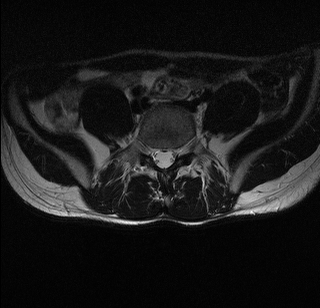

In [11]:
my_file = '/home/natasha/unet/axial_data_new/test/First_3/pictures/00065.PNG'
img = Image.open(my_file).convert('L')

img

outputs:
torch.Size([1, 6, 308, 320])
torch.Size([1, 64, 308, 320])
torch.Size([1, 6, 600, 600])
torch.Size([1, 6, 600, 600])
torch.Size([1, 6, 600, 600])
torch.Size([1, 6, 600, 600])
torch.Size([1, 6, 600, 600])
full_output.shape: ...
10
output.shape: ...
torch.Size([1, 6, 308, 320])
mask.shape: ...
(6, 308, 320)


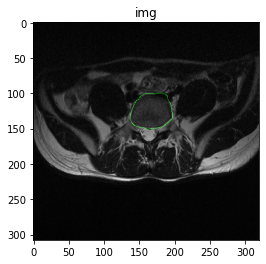

In [12]:
mask = predict_img(net=net,
                   full_img=img,
                   scale_factor=scale,
                   out_threshold=mask_threshold,
                   device=device)

print('mask.shape: ...')
print(mask.shape)

res_treshold = 0.05

mask = np.array([mask[0] > res_treshold, mask[1] > res_treshold, \
                 mask[2] > res_treshold, mask[3] > res_treshold,mask[4] > res_treshold, mask[5] > res_treshold], \
                dtype=np.uint8)

vertebrae = cv2.Canny(image=mask[0]*255, threshold1=50, threshold2=150)
canal = cv2.Canny(image=mask[1]*255, threshold1=50, threshold2=150)
xz = cv2.Canny(image=mask[2]*255, threshold1=50, threshold2=150)
zx = cv2.Canny(image=mask[3]*255, threshold1=50, threshold2=150)
zz = cv2.Canny(image=mask[4]*255, threshold1=50, threshold2=150)
xx = cv2.Canny(image=mask[5]*255, threshold1=50, threshold2=150)

rgb_contours = np.dstack([np.zeros_like(canal), vertebrae, xx])
img_np = np.array(img)

#here is a problema, need more dims to viz all at once
rgb_mrimg = np.dstack([img, img, img])
result_img = cv2.addWeighted(rgb_mrimg, 1, rgb_contours, 0.5, 0)


plt.imshow(result_img)
plt.title('img')
plt.show()

In [13]:
infile_list = os.listdir('/home/natasha/unet/axial_data_new/test/First_3/pictures/')

In [14]:
indirimg = ('/home/natasha/unet/axial_data_new/test/First_3/pictures/')
imdirmask = ('/home/natasha/unet/axial_data_new/test/First_3/masks/')

0077.PNG
infiles:  /home/natasha/unet/axial_data_new/test/First_3/pictures/0077.PNG
inmasks:  /home/natasha/unet/axial_data_new/test/First_3/masks/0077.npy
outputs:
torch.Size([1, 6, 308, 320])
torch.Size([1, 64, 308, 320])
torch.Size([1, 6, 600, 600])
torch.Size([1, 6, 600, 600])
torch.Size([1, 6, 600, 600])
torch.Size([1, 6, 600, 600])
torch.Size([1, 6, 600, 600])
full_output.shape: ...
10
output.shape: ...
torch.Size([1, 6, 308, 320])
mask.shape: ...
(6, 308, 320)
true_mask.shape: ...
(308, 320, 6)
uniques: ...
[0 1]
mask.shape: ...
(6, 308, 320)
 --- --- --- vis started --- --- --- 
 --- --- --- 1st --- --- --- 


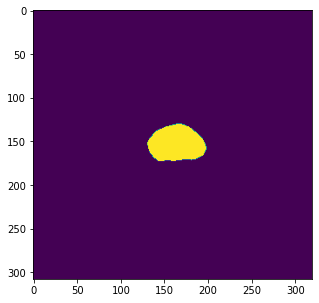

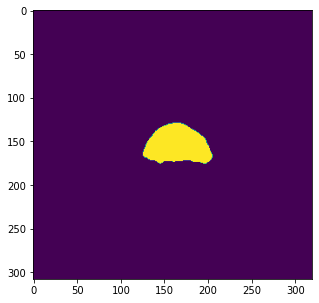

 --- --- --- 2nd --- --- --- 


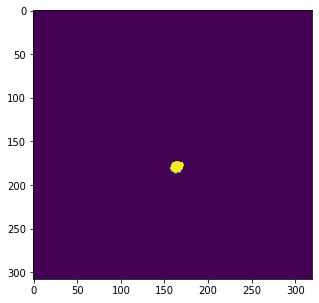

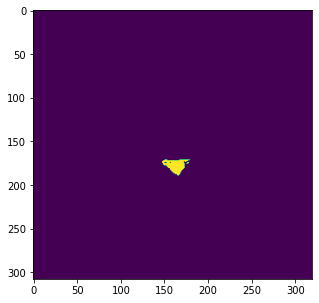

 --- --- --- 3rd --- --- --- 


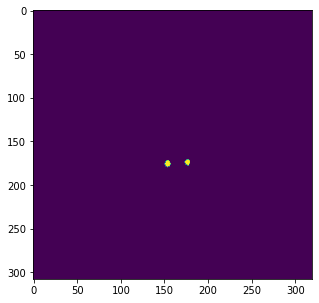

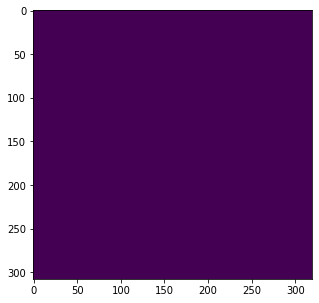

 --- --- --- 4th --- --- --- 


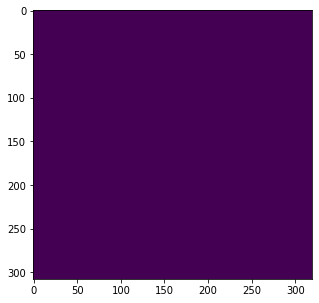

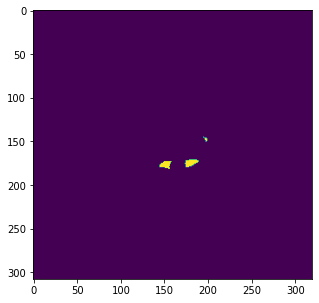

 --- --- --- 5th --- --- --- 


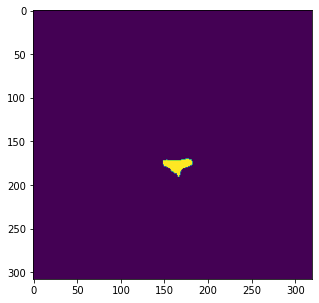

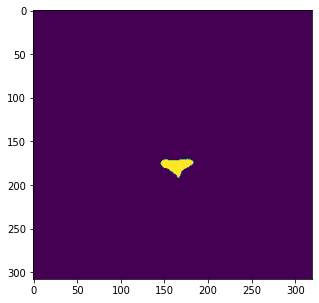

 --- --- --- 6th --- --- --- 


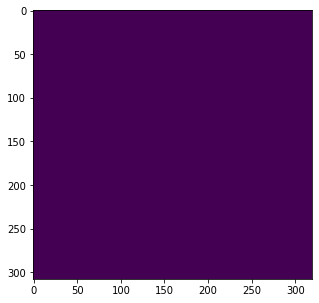

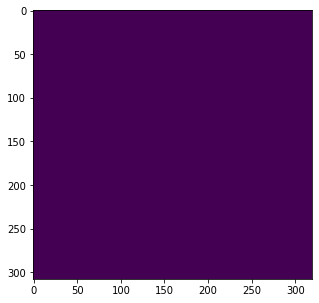

 --- --- --- img itself --- --- --- 


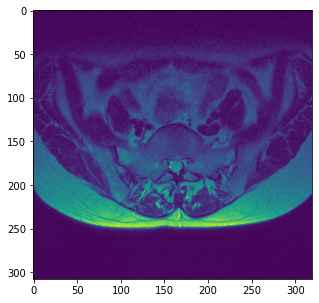

------------------------------------------------------------------------------------------

05778.PNG
infiles:  /home/natasha/unet/axial_data_new/test/First_3/pictures/05778.PNG
inmasks:  /home/natasha/unet/axial_data_new/test/First_3/masks/05778.npy
outputs:
torch.Size([1, 6, 308, 320])
torch.Size([1, 64, 308, 320])
torch.Size([1, 6, 600, 600])
torch.Size([1, 6, 600, 600])
torch.Size([1, 6, 600, 600])
torch.Size([1, 6, 600, 600])
torch.Size([1, 6, 600, 600])
full_output.shape: ...
10
output.shape: ...
torch.Size([1, 6, 308, 320])
mask.shape: ...
(6, 308, 320)
true_mask.shape: ...
(308, 320, 6)
uniques: ...
[0 1]
mask.shape: ...
(6, 308, 320)
 --- --- --- vis started --- --- --- 
 --- --- --- 1st --- --- --- 


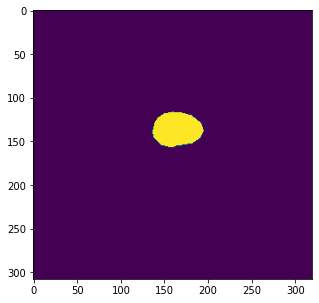

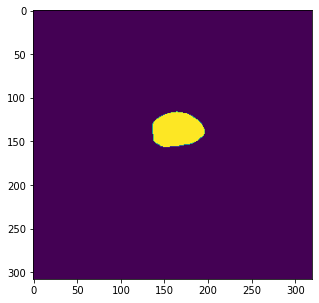

 --- --- --- 2nd --- --- --- 


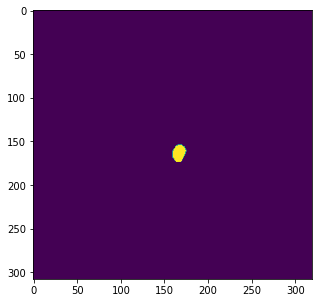

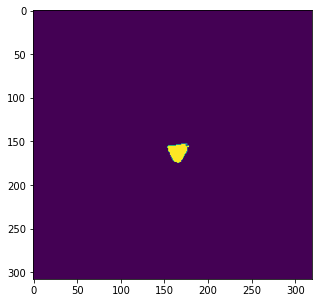

 --- --- --- 3rd --- --- --- 


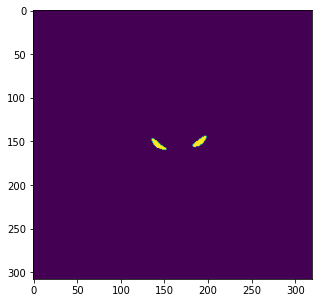

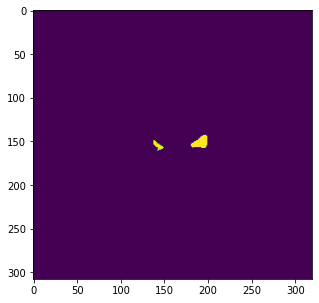

 --- --- --- 4th --- --- --- 


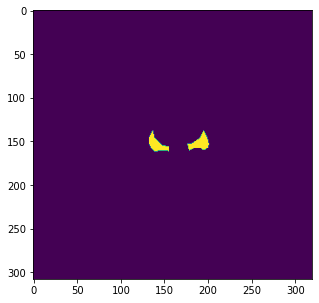

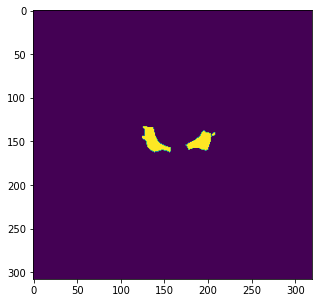

 --- --- --- 5th --- --- --- 


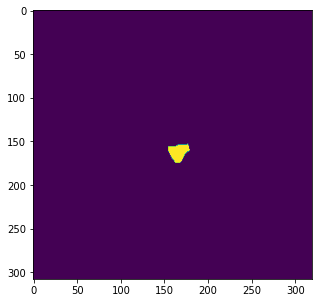

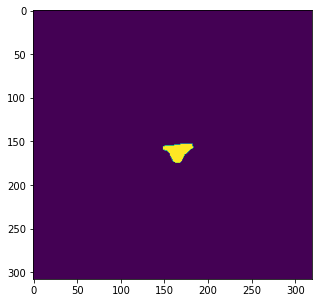

 --- --- --- 6th --- --- --- 


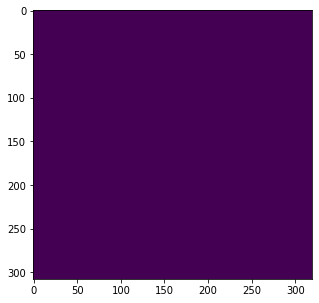

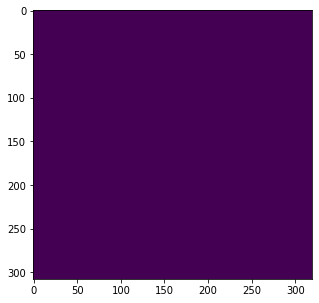

 --- --- --- img itself --- --- --- 


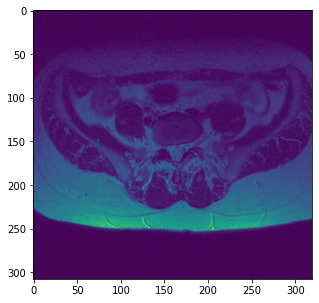

------------------------------------------------------------------------------------------

05810.PNG
infiles:  /home/natasha/unet/axial_data_new/test/First_3/pictures/05810.PNG
inmasks:  /home/natasha/unet/axial_data_new/test/First_3/masks/05810.npy
outputs:
torch.Size([1, 6, 308, 320])
torch.Size([1, 64, 308, 320])
torch.Size([1, 6, 600, 600])
torch.Size([1, 6, 600, 600])
torch.Size([1, 6, 600, 600])
torch.Size([1, 6, 600, 600])
torch.Size([1, 6, 600, 600])
full_output.shape: ...
10
output.shape: ...
torch.Size([1, 6, 308, 320])
mask.shape: ...
(6, 308, 320)
true_mask.shape: ...
(308, 320, 6)
uniques: ...
[0 1]
mask.shape: ...
(6, 308, 320)
 --- --- --- vis started --- --- --- 
 --- --- --- 1st --- --- --- 


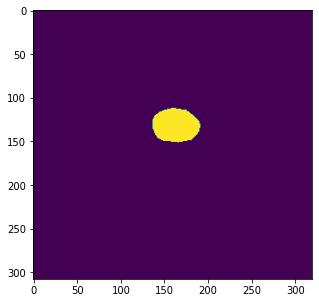

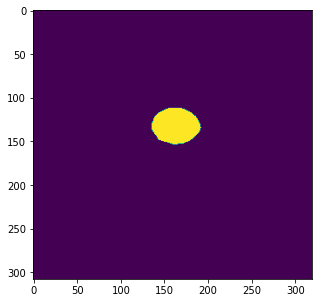

 --- --- --- 2nd --- --- --- 


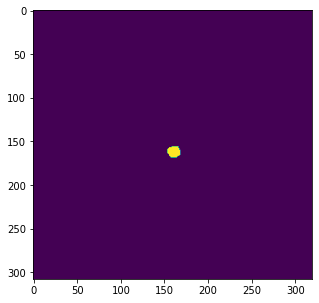

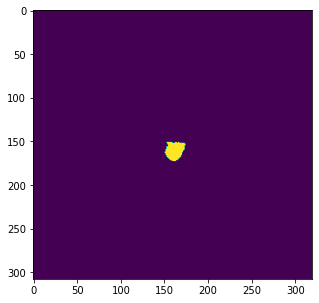

 --- --- --- 3rd --- --- --- 


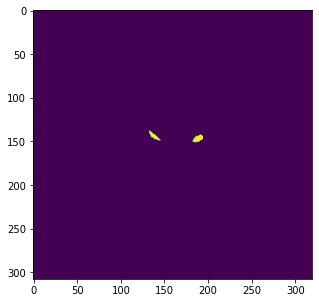

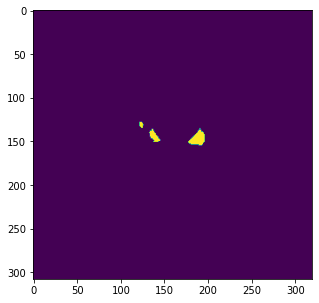

 --- --- --- 4th --- --- --- 


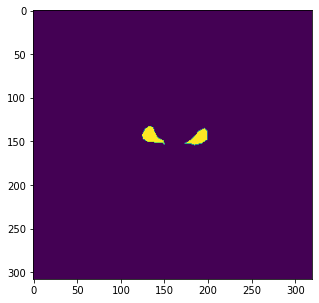

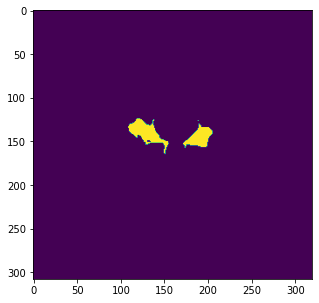

 --- --- --- 5th --- --- --- 


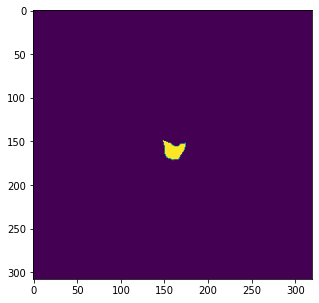

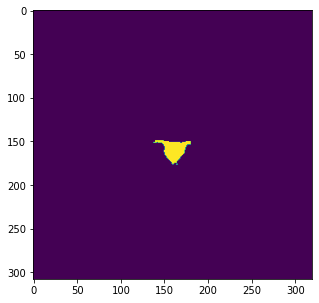

 --- --- --- 6th --- --- --- 


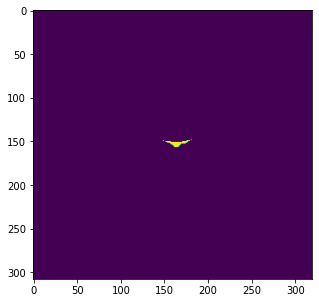

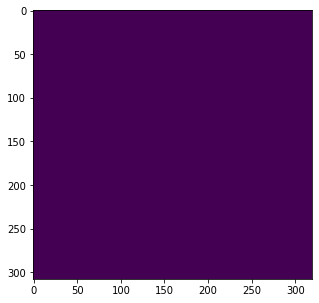

 --- --- --- img itself --- --- --- 


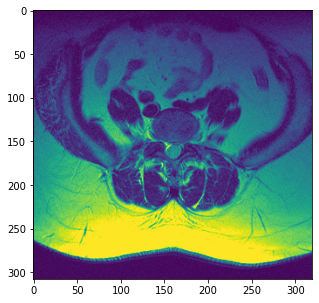

------------------------------------------------------------------------------------------

00102.PNG
infiles:  /home/natasha/unet/axial_data_new/test/First_3/pictures/00102.PNG
inmasks:  /home/natasha/unet/axial_data_new/test/First_3/masks/00102.npy
outputs:
torch.Size([1, 6, 308, 320])
torch.Size([1, 64, 308, 320])
torch.Size([1, 6, 600, 600])
torch.Size([1, 6, 600, 600])
torch.Size([1, 6, 600, 600])
torch.Size([1, 6, 600, 600])
torch.Size([1, 6, 600, 600])
full_output.shape: ...
10
output.shape: ...
torch.Size([1, 6, 308, 320])
mask.shape: ...
(6, 308, 320)
true_mask.shape: ...
(308, 320, 6)
uniques: ...
[0 1]
mask.shape: ...
(6, 308, 320)
 --- --- --- vis started --- --- --- 
 --- --- --- 1st --- --- --- 


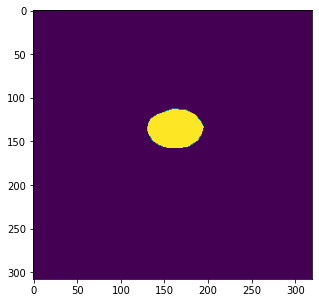

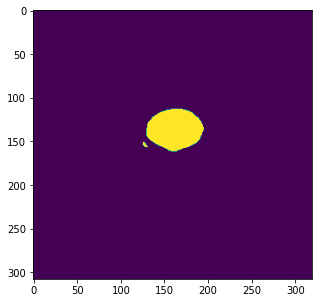

 --- --- --- 2nd --- --- --- 


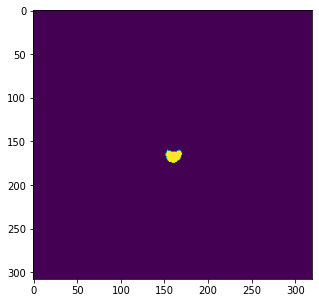

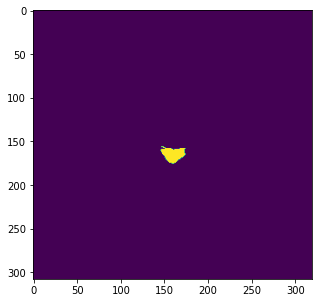

 --- --- --- 3rd --- --- --- 


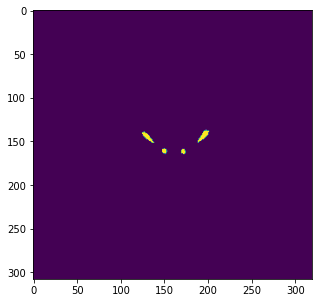

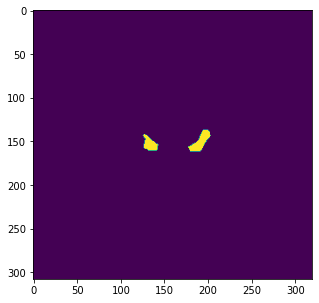

 --- --- --- 4th --- --- --- 


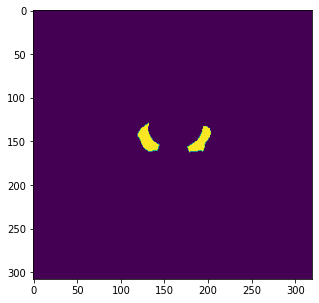

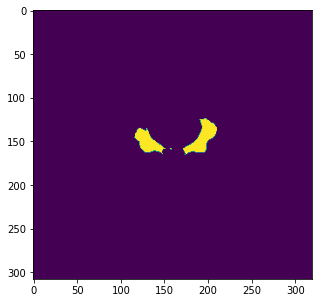

 --- --- --- 5th --- --- --- 


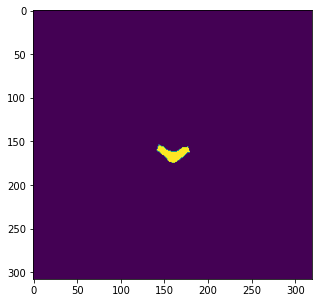

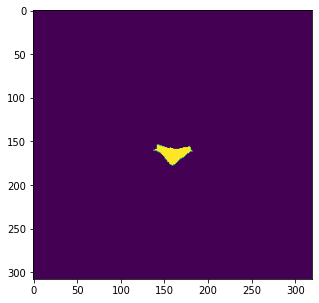

 --- --- --- 6th --- --- --- 


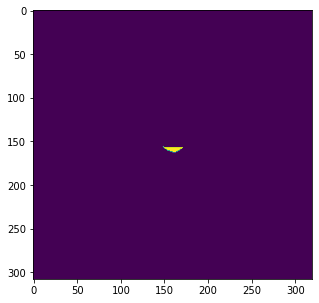

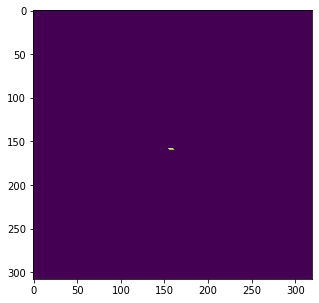

 --- --- --- img itself --- --- --- 


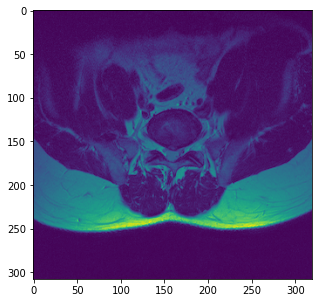

------------------------------------------------------------------------------------------

00097.PNG
infiles:  /home/natasha/unet/axial_data_new/test/First_3/pictures/00097.PNG
inmasks:  /home/natasha/unet/axial_data_new/test/First_3/masks/00097.npy
outputs:
torch.Size([1, 6, 308, 320])
torch.Size([1, 64, 308, 320])
torch.Size([1, 6, 600, 600])
torch.Size([1, 6, 600, 600])
torch.Size([1, 6, 600, 600])
torch.Size([1, 6, 600, 600])
torch.Size([1, 6, 600, 600])
full_output.shape: ...
10
output.shape: ...
torch.Size([1, 6, 308, 320])
mask.shape: ...
(6, 308, 320)
true_mask.shape: ...
(308, 320, 6)
uniques: ...
[0 1]
mask.shape: ...
(6, 308, 320)
 --- --- --- vis started --- --- --- 
 --- --- --- 1st --- --- --- 


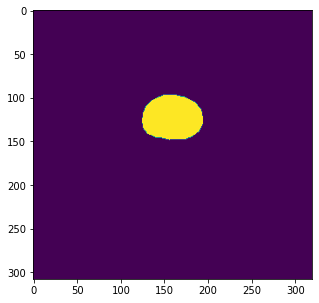

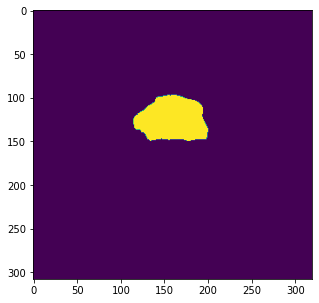

 --- --- --- 2nd --- --- --- 


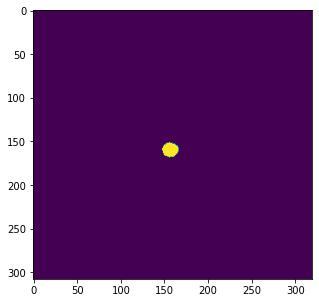

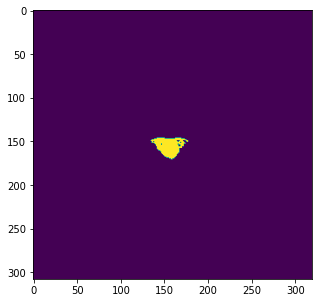

 --- --- --- 3rd --- --- --- 


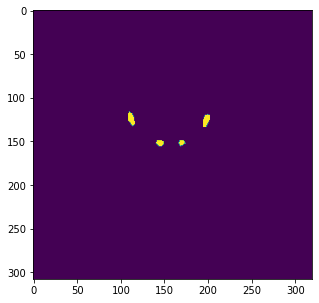

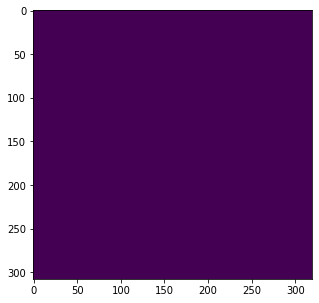

 --- --- --- 4th --- --- --- 


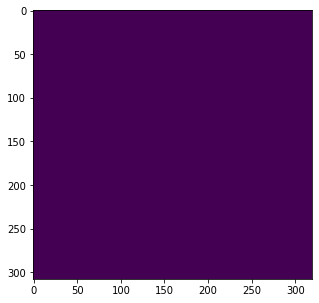

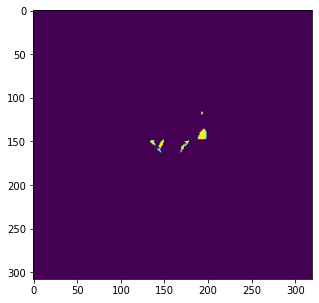

 --- --- --- 5th --- --- --- 


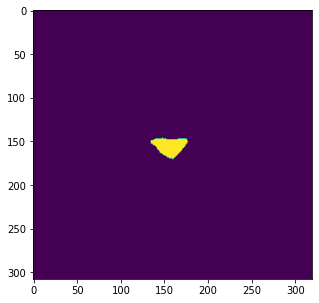

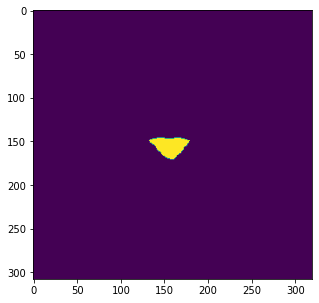

 --- --- --- 6th --- --- --- 


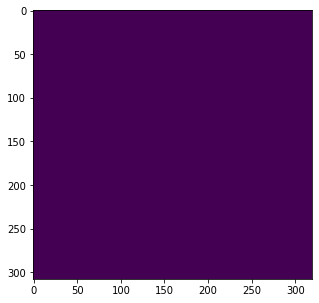

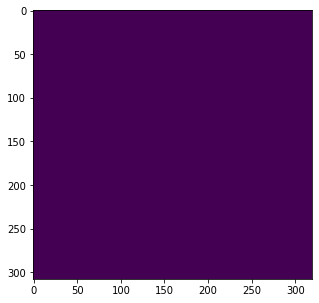

 --- --- --- img itself --- --- --- 


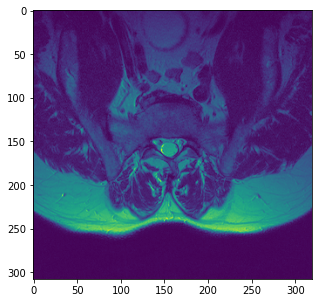

------------------------------------------------------------------------------------------

0117.PNG
infiles:  /home/natasha/unet/axial_data_new/test/First_3/pictures/0117.PNG
inmasks:  /home/natasha/unet/axial_data_new/test/First_3/masks/0117.npy
outputs:
torch.Size([1, 6, 308, 320])
torch.Size([1, 64, 308, 320])
torch.Size([1, 6, 600, 600])
torch.Size([1, 6, 600, 600])
torch.Size([1, 6, 600, 600])
torch.Size([1, 6, 600, 600])
torch.Size([1, 6, 600, 600])
full_output.shape: ...
10
output.shape: ...
torch.Size([1, 6, 308, 320])
mask.shape: ...
(6, 308, 320)
true_mask.shape: ...
(308, 320, 6)
uniques: ...
[0 1]
mask.shape: ...
(6, 308, 320)
 --- --- --- vis started --- --- --- 
 --- --- --- 1st --- --- --- 


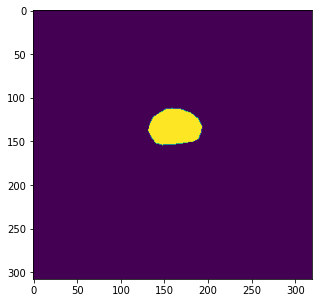

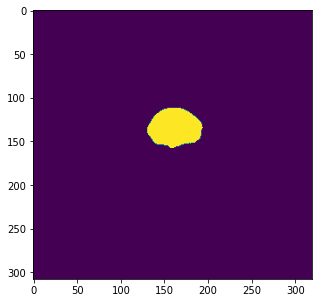

 --- --- --- 2nd --- --- --- 


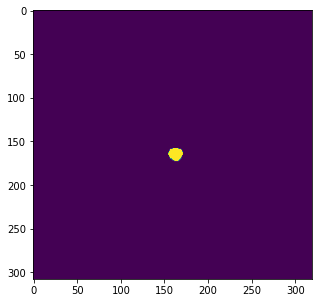

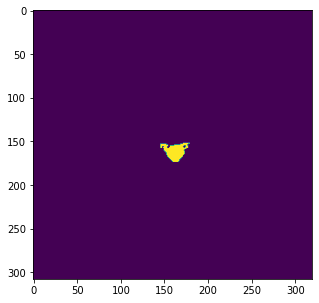

 --- --- --- 3rd --- --- --- 


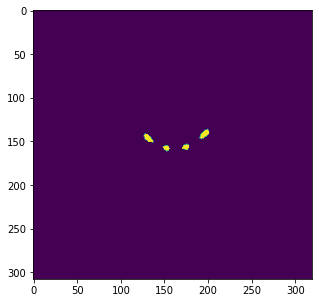

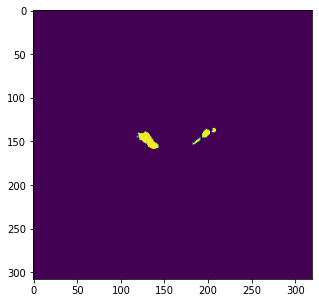

 --- --- --- 4th --- --- --- 


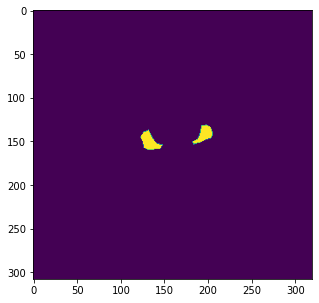

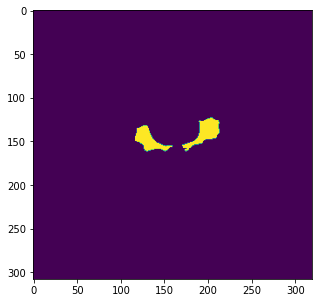

 --- --- --- 5th --- --- --- 


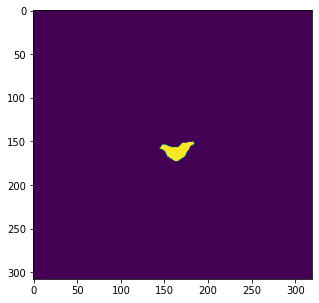

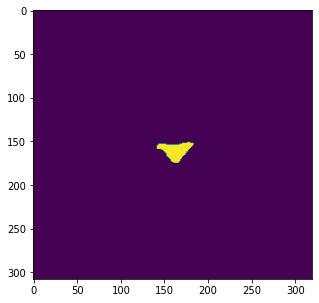

 --- --- --- 6th --- --- --- 


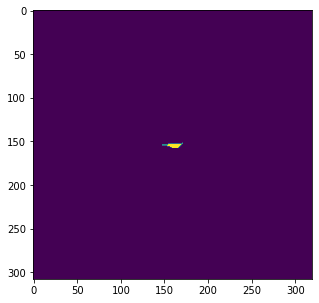

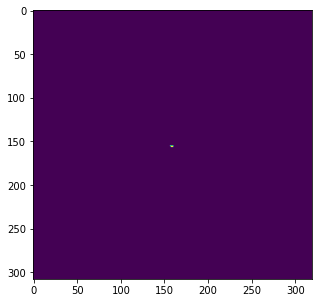

 --- --- --- img itself --- --- --- 


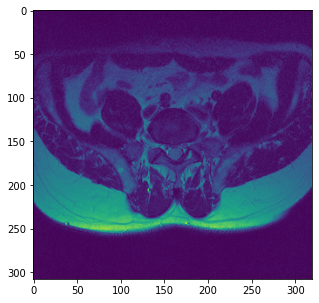

------------------------------------------------------------------------------------------

05768.PNG
infiles:  /home/natasha/unet/axial_data_new/test/First_3/pictures/05768.PNG
inmasks:  /home/natasha/unet/axial_data_new/test/First_3/masks/05768.npy
outputs:
torch.Size([1, 6, 308, 320])
torch.Size([1, 64, 308, 320])
torch.Size([1, 6, 600, 600])
torch.Size([1, 6, 600, 600])
torch.Size([1, 6, 600, 600])
torch.Size([1, 6, 600, 600])
torch.Size([1, 6, 600, 600])
full_output.shape: ...
10
output.shape: ...
torch.Size([1, 6, 308, 320])
mask.shape: ...
(6, 308, 320)
true_mask.shape: ...
(308, 320, 6)
uniques: ...
[0 1]
mask.shape: ...
(6, 308, 320)
 --- --- --- vis started --- --- --- 
 --- --- --- 1st --- --- --- 


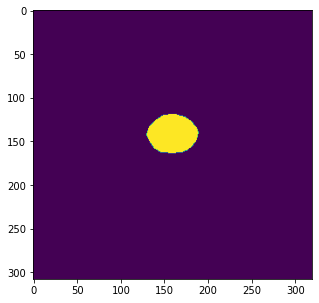

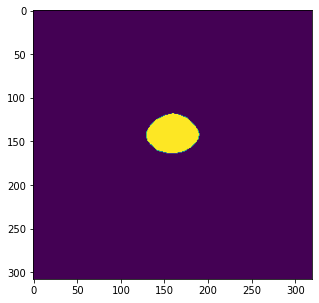

 --- --- --- 2nd --- --- --- 


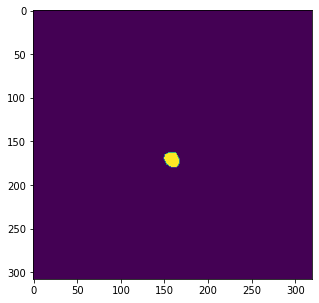

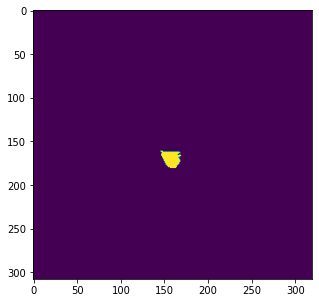

 --- --- --- 3rd --- --- --- 


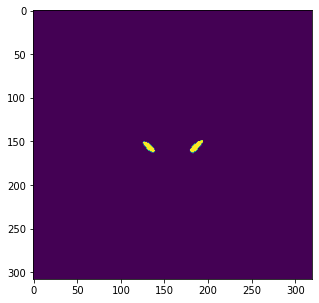

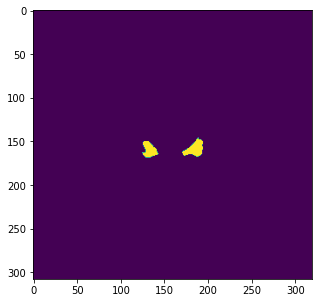

 --- --- --- 4th --- --- --- 


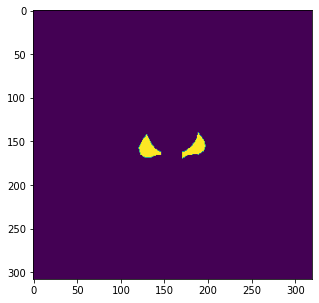

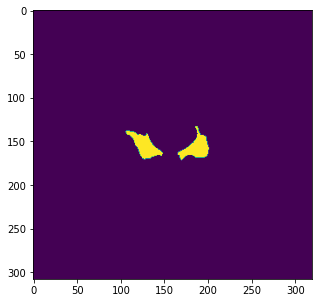

 --- --- --- 5th --- --- --- 


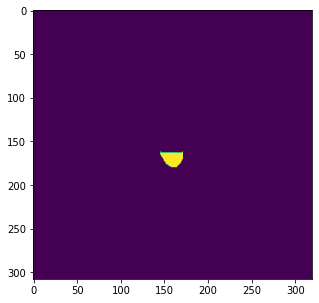

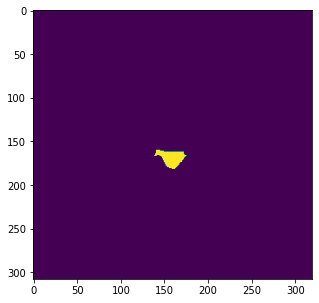

 --- --- --- 6th --- --- --- 


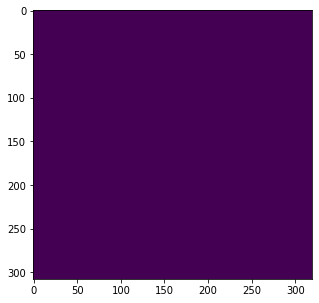

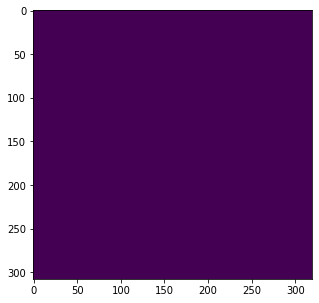

 --- --- --- img itself --- --- --- 


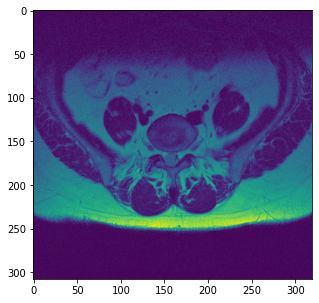

------------------------------------------------------------------------------------------

05796.PNG
infiles:  /home/natasha/unet/axial_data_new/test/First_3/pictures/05796.PNG
inmasks:  /home/natasha/unet/axial_data_new/test/First_3/masks/05796.npy
outputs:
torch.Size([1, 6, 308, 320])
torch.Size([1, 64, 308, 320])
torch.Size([1, 6, 600, 600])
torch.Size([1, 6, 600, 600])
torch.Size([1, 6, 600, 600])
torch.Size([1, 6, 600, 600])
torch.Size([1, 6, 600, 600])
full_output.shape: ...
10
output.shape: ...
torch.Size([1, 6, 308, 320])
mask.shape: ...
(6, 308, 320)
true_mask.shape: ...
(308, 320, 6)
uniques: ...
[0 1]
mask.shape: ...
(6, 308, 320)
 --- --- --- vis started --- --- --- 
 --- --- --- 1st --- --- --- 


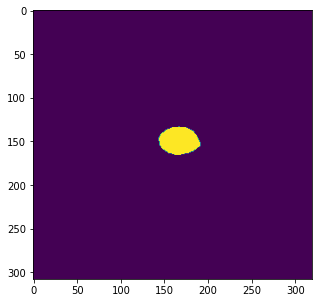

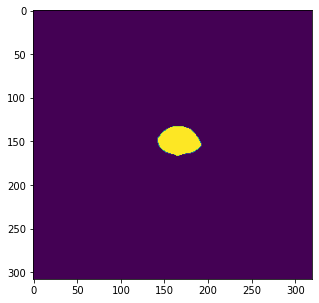

 --- --- --- 2nd --- --- --- 


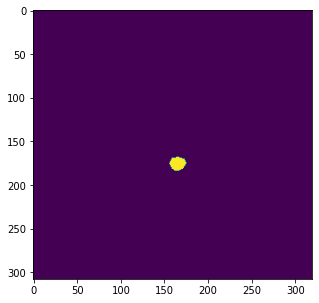

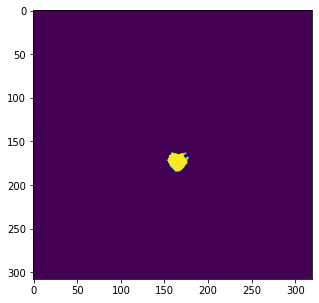

 --- --- --- 3rd --- --- --- 


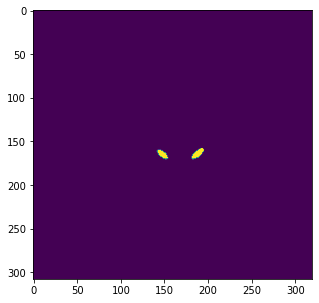

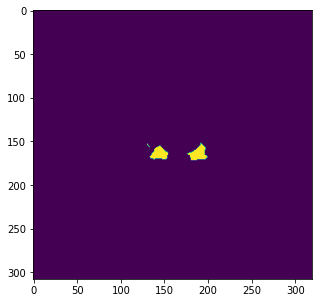

 --- --- --- 4th --- --- --- 


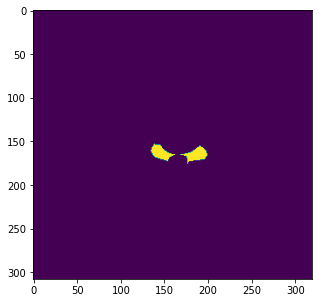

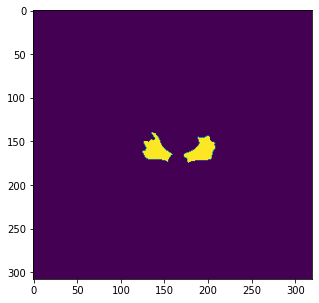

 --- --- --- 5th --- --- --- 


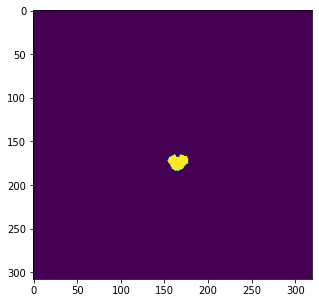

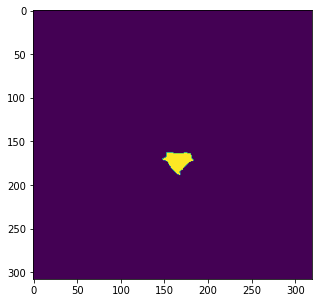

 --- --- --- 6th --- --- --- 


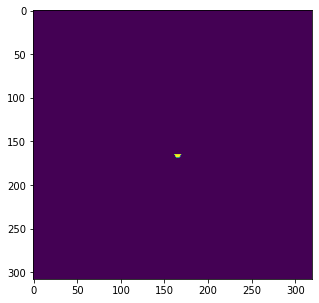

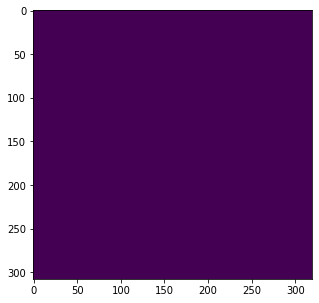

 --- --- --- img itself --- --- --- 


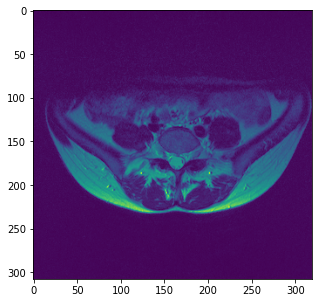

------------------------------------------------------------------------------------------

00129.PNG
infiles:  /home/natasha/unet/axial_data_new/test/First_3/pictures/00129.PNG
inmasks:  /home/natasha/unet/axial_data_new/test/First_3/masks/00129.npy
outputs:
torch.Size([1, 6, 308, 320])
torch.Size([1, 64, 308, 320])
torch.Size([1, 6, 600, 600])
torch.Size([1, 6, 600, 600])
torch.Size([1, 6, 600, 600])
torch.Size([1, 6, 600, 600])
torch.Size([1, 6, 600, 600])
full_output.shape: ...
10
output.shape: ...
torch.Size([1, 6, 308, 320])
mask.shape: ...
(6, 308, 320)
true_mask.shape: ...
(308, 320, 6)
uniques: ...
[0 1]
mask.shape: ...
(6, 308, 320)
 --- --- --- vis started --- --- --- 
 --- --- --- 1st --- --- --- 


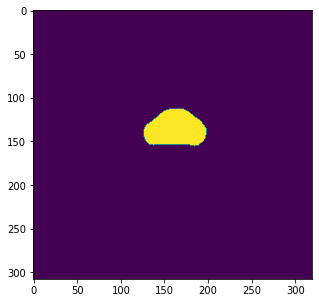

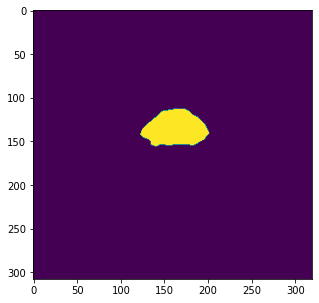

 --- --- --- 2nd --- --- --- 


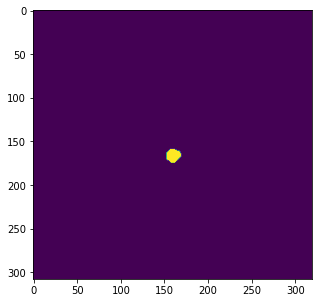

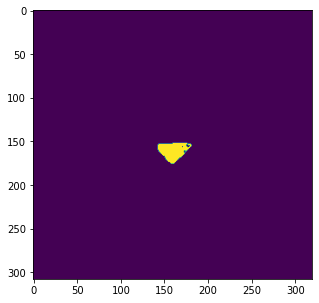

 --- --- --- 3rd --- --- --- 


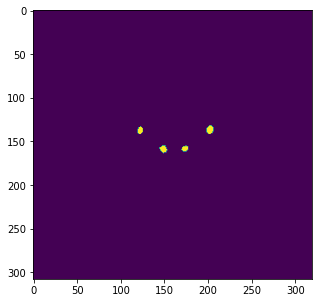

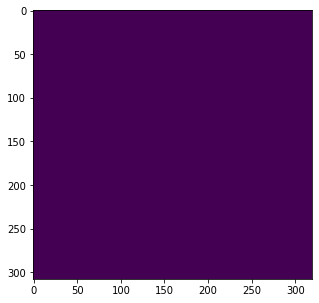

 --- --- --- 4th --- --- --- 


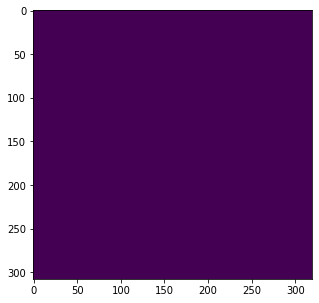

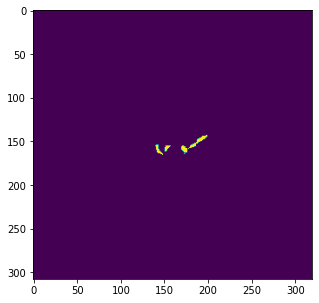

 --- --- --- 5th --- --- --- 


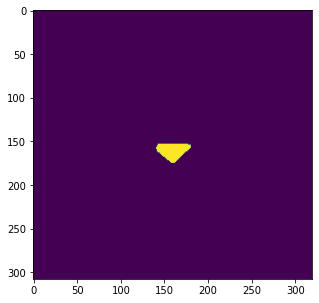

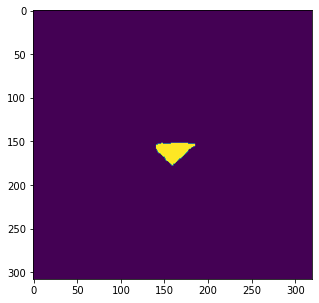

 --- --- --- 6th --- --- --- 


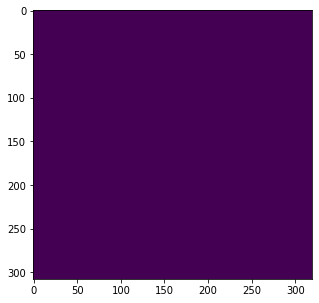

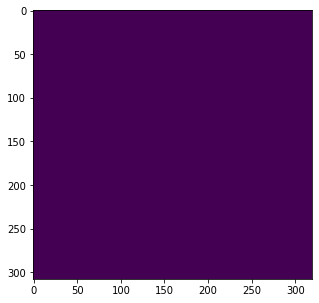

 --- --- --- img itself --- --- --- 


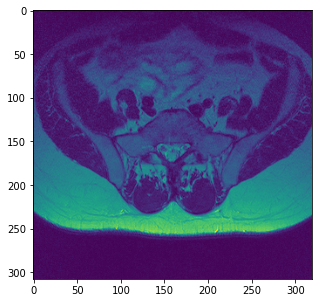

------------------------------------------------------------------------------------------

05806.PNG
infiles:  /home/natasha/unet/axial_data_new/test/First_3/pictures/05806.PNG
inmasks:  /home/natasha/unet/axial_data_new/test/First_3/masks/05806.npy
outputs:
torch.Size([1, 6, 308, 320])
torch.Size([1, 64, 308, 320])
torch.Size([1, 6, 600, 600])
torch.Size([1, 6, 600, 600])
torch.Size([1, 6, 600, 600])
torch.Size([1, 6, 600, 600])
torch.Size([1, 6, 600, 600])
full_output.shape: ...
10
output.shape: ...
torch.Size([1, 6, 308, 320])
mask.shape: ...
(6, 308, 320)
true_mask.shape: ...
(308, 320, 6)
uniques: ...
[0 1]
mask.shape: ...
(6, 308, 320)
 --- --- --- vis started --- --- --- 
 --- --- --- 1st --- --- --- 


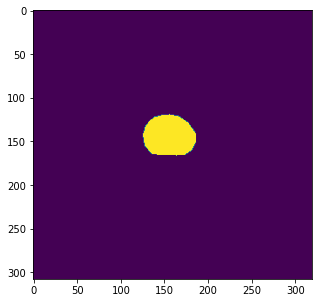

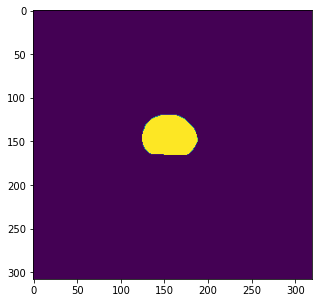

 --- --- --- 2nd --- --- --- 


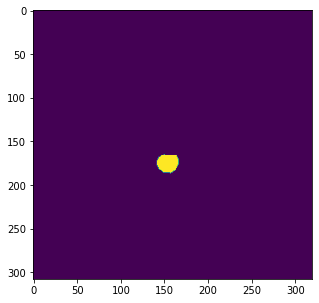

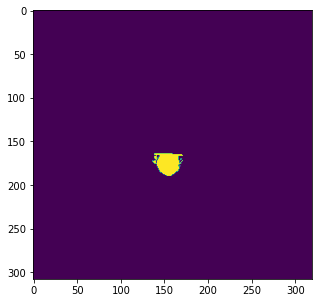

 --- --- --- 3rd --- --- --- 


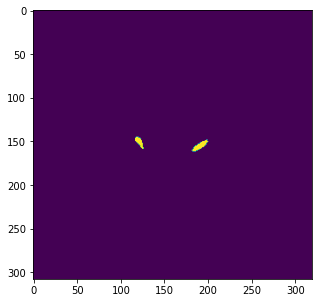

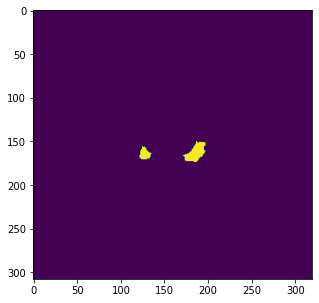

 --- --- --- 4th --- --- --- 


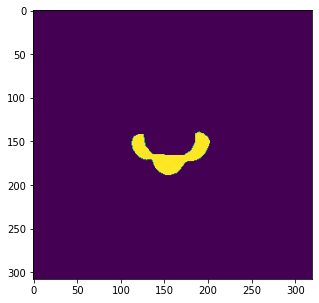

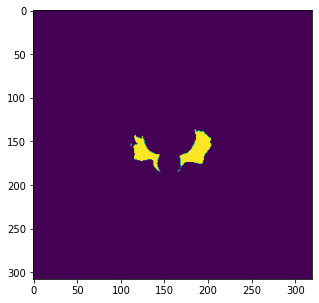

 --- --- --- 5th --- --- --- 


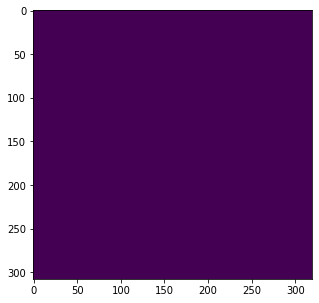

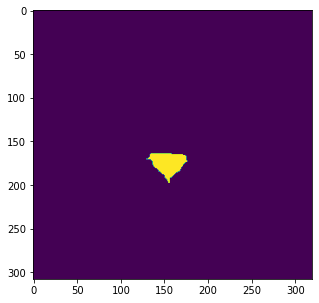

 --- --- --- 6th --- --- --- 


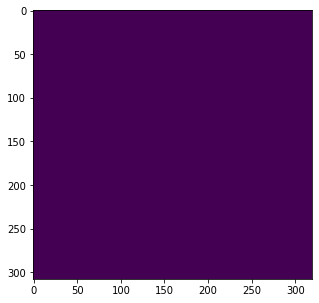

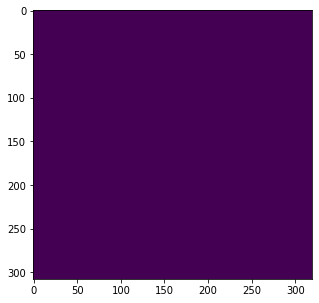

 --- --- --- img itself --- --- --- 


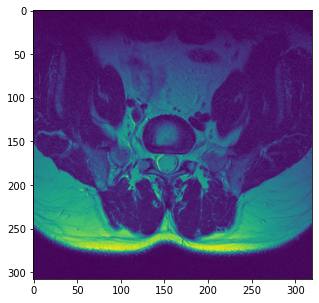

------------------------------------------------------------------------------------------

05828.PNG
infiles:  /home/natasha/unet/axial_data_new/test/First_3/pictures/05828.PNG
inmasks:  /home/natasha/unet/axial_data_new/test/First_3/masks/05828.npy
outputs:
torch.Size([1, 6, 308, 320])
torch.Size([1, 64, 308, 320])
torch.Size([1, 6, 600, 600])
torch.Size([1, 6, 600, 600])
torch.Size([1, 6, 600, 600])
torch.Size([1, 6, 600, 600])
torch.Size([1, 6, 600, 600])
full_output.shape: ...
10
output.shape: ...
torch.Size([1, 6, 308, 320])
mask.shape: ...
(6, 308, 320)
true_mask.shape: ...
(308, 320, 6)
uniques: ...
[0 1]
mask.shape: ...
(6, 308, 320)
 --- --- --- vis started --- --- --- 
 --- --- --- 1st --- --- --- 


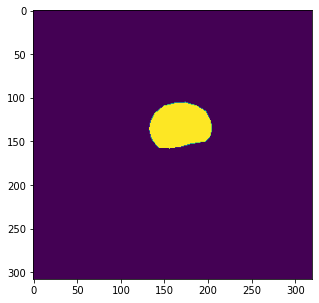

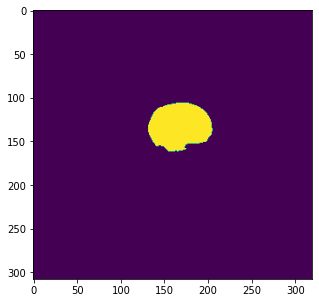

 --- --- --- 2nd --- --- --- 


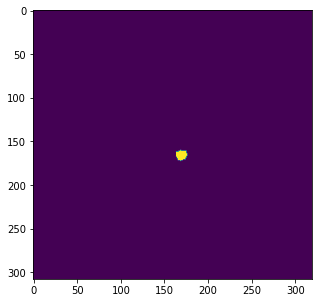

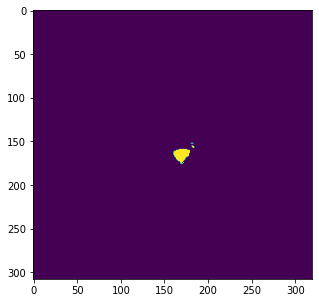

 --- --- --- 3rd --- --- --- 


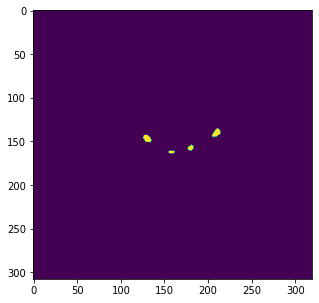

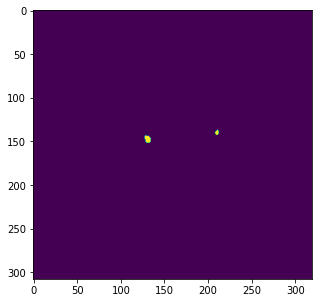

 --- --- --- 4th --- --- --- 


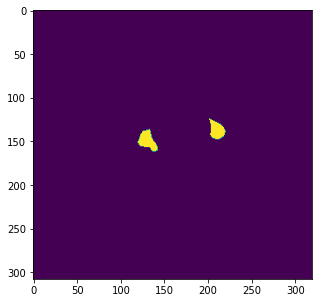

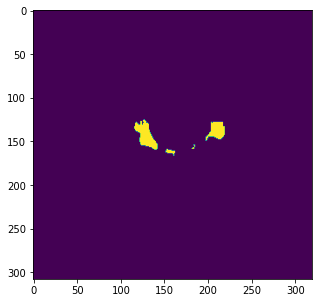

 --- --- --- 5th --- --- --- 


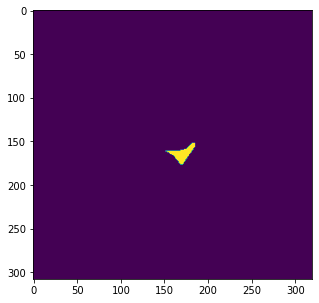

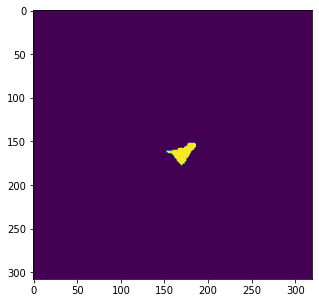

 --- --- --- 6th --- --- --- 


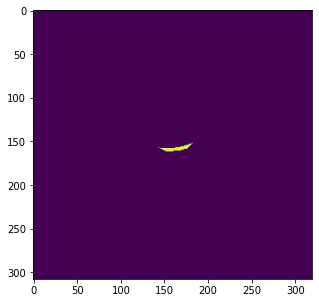

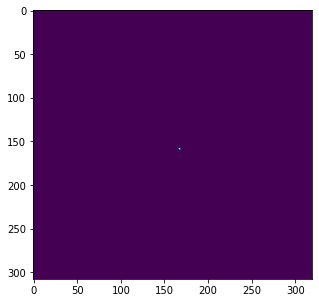

 --- --- --- img itself --- --- --- 


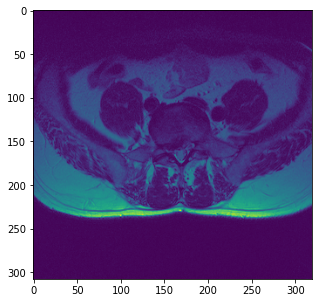

------------------------------------------------------------------------------------------

0121.PNG
infiles:  /home/natasha/unet/axial_data_new/test/First_3/pictures/0121.PNG
inmasks:  /home/natasha/unet/axial_data_new/test/First_3/masks/0121.npy
outputs:
torch.Size([1, 6, 308, 320])
torch.Size([1, 64, 308, 320])
torch.Size([1, 6, 600, 600])
torch.Size([1, 6, 600, 600])
torch.Size([1, 6, 600, 600])
torch.Size([1, 6, 600, 600])
torch.Size([1, 6, 600, 600])
full_output.shape: ...
10
output.shape: ...
torch.Size([1, 6, 308, 320])
mask.shape: ...
(6, 308, 320)
true_mask.shape: ...
(308, 320, 6)
uniques: ...
[0 1]
mask.shape: ...
(6, 308, 320)
 --- --- --- vis started --- --- --- 
 --- --- --- 1st --- --- --- 


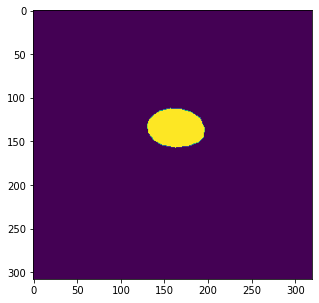

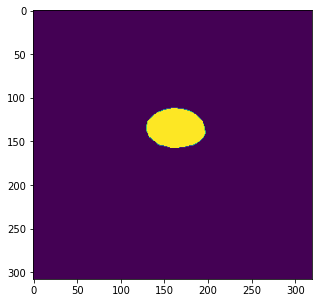

 --- --- --- 2nd --- --- --- 


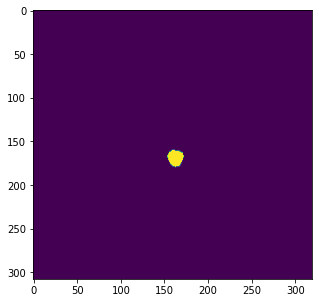

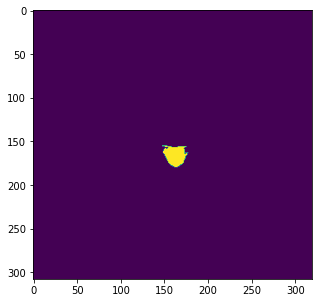

 --- --- --- 3rd --- --- --- 


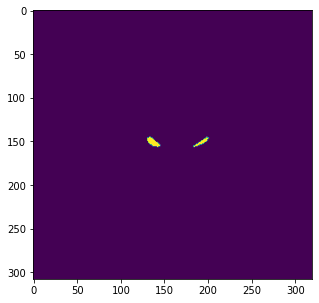

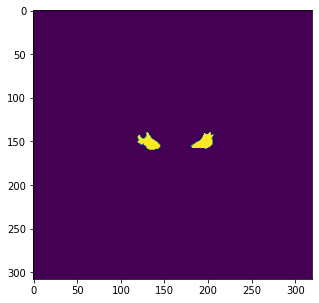

 --- --- --- 4th --- --- --- 


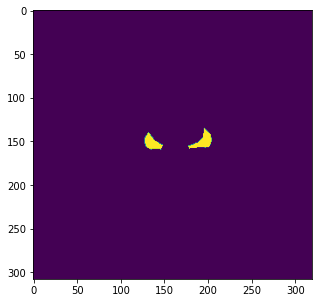

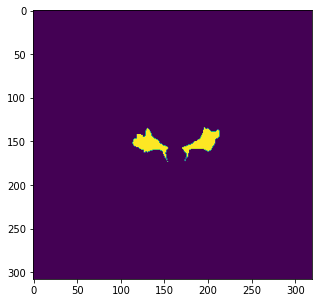

 --- --- --- 5th --- --- --- 


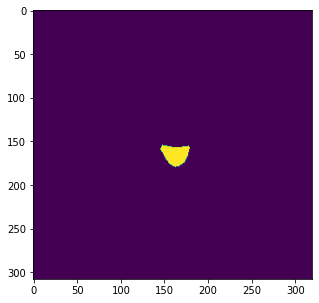

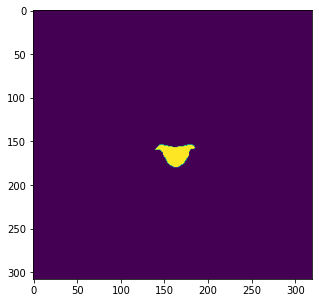

 --- --- --- 6th --- --- --- 


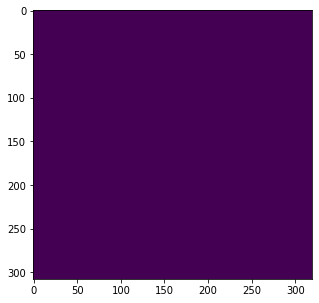

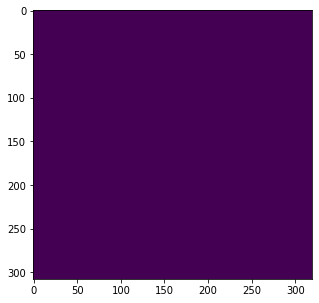

 --- --- --- img itself --- --- --- 


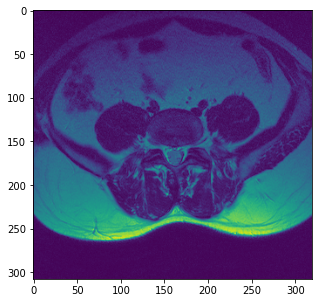

------------------------------------------------------------------------------------------

05777.PNG
infiles:  /home/natasha/unet/axial_data_new/test/First_3/pictures/05777.PNG
inmasks:  /home/natasha/unet/axial_data_new/test/First_3/masks/05777.npy
outputs:
torch.Size([1, 6, 308, 320])
torch.Size([1, 64, 308, 320])
torch.Size([1, 6, 600, 600])
torch.Size([1, 6, 600, 600])
torch.Size([1, 6, 600, 600])
torch.Size([1, 6, 600, 600])
torch.Size([1, 6, 600, 600])
full_output.shape: ...
10
output.shape: ...
torch.Size([1, 6, 308, 320])
mask.shape: ...
(6, 308, 320)
true_mask.shape: ...
(308, 320, 6)
uniques: ...
[0 1]
mask.shape: ...
(6, 308, 320)
 --- --- --- vis started --- --- --- 
 --- --- --- 1st --- --- --- 


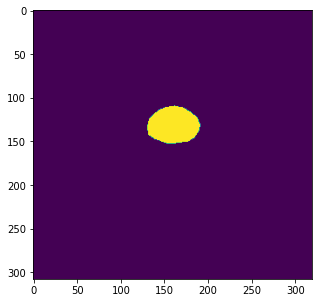

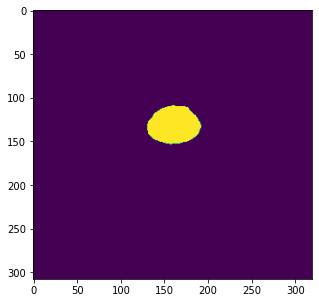

 --- --- --- 2nd --- --- --- 


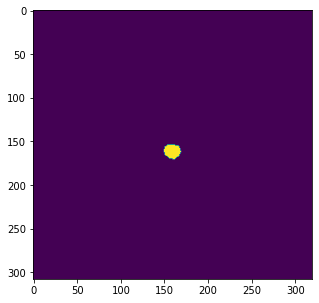

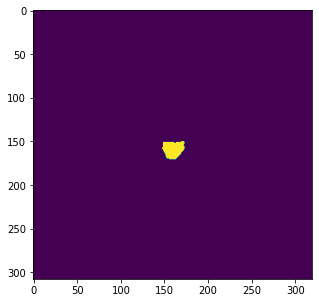

 --- --- --- 3rd --- --- --- 


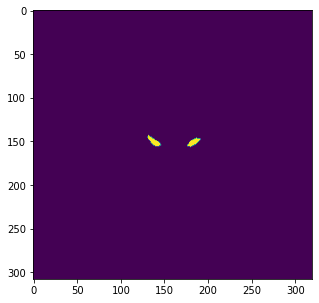

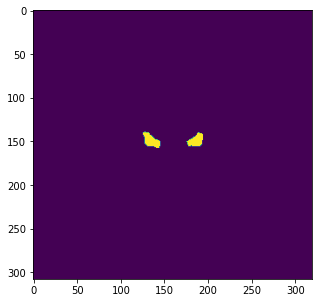

 --- --- --- 4th --- --- --- 


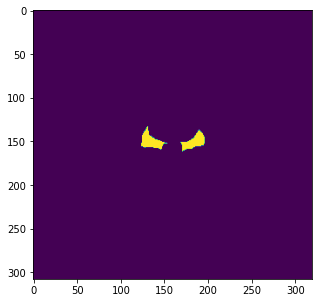

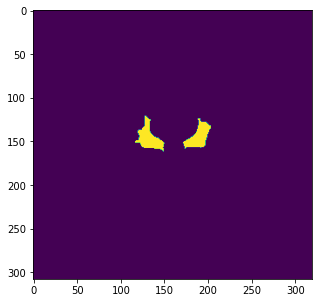

 --- --- --- 5th --- --- --- 


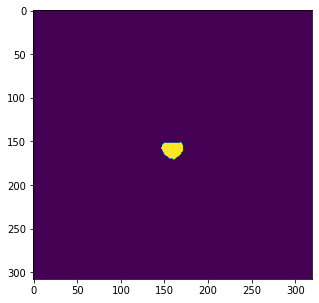

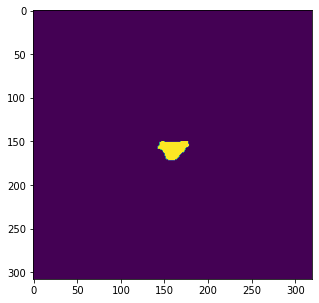

 --- --- --- 6th --- --- --- 


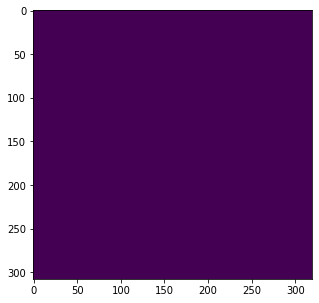

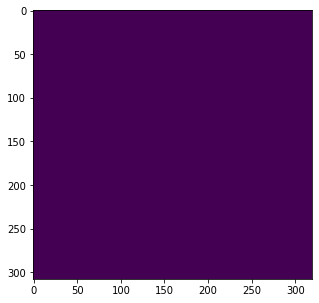

 --- --- --- img itself --- --- --- 


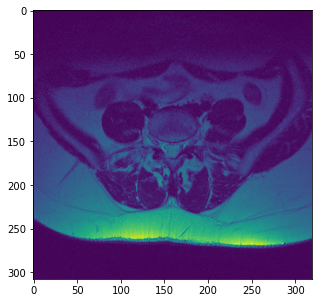

------------------------------------------------------------------------------------------

00103.PNG
infiles:  /home/natasha/unet/axial_data_new/test/First_3/pictures/00103.PNG
inmasks:  /home/natasha/unet/axial_data_new/test/First_3/masks/00103.npy
outputs:
torch.Size([1, 6, 308, 320])
torch.Size([1, 64, 308, 320])
torch.Size([1, 6, 600, 600])
torch.Size([1, 6, 600, 600])
torch.Size([1, 6, 600, 600])
torch.Size([1, 6, 600, 600])
torch.Size([1, 6, 600, 600])
full_output.shape: ...
10
output.shape: ...
torch.Size([1, 6, 308, 320])
mask.shape: ...
(6, 308, 320)
true_mask.shape: ...
(308, 320, 6)
uniques: ...
[0 1]
mask.shape: ...
(6, 308, 320)
 --- --- --- vis started --- --- --- 
 --- --- --- 1st --- --- --- 


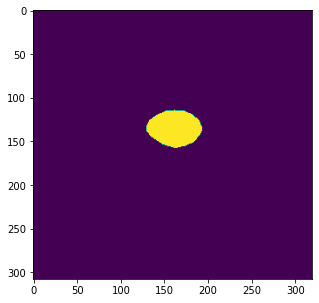

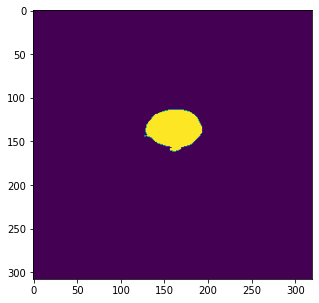

 --- --- --- 2nd --- --- --- 


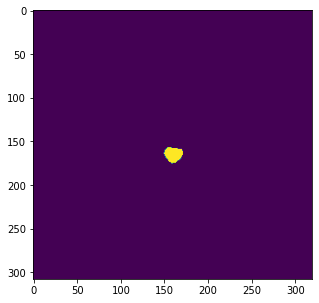

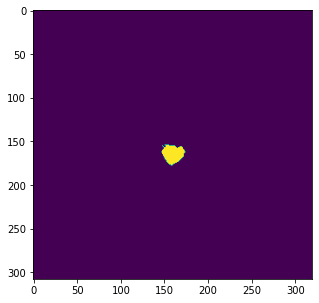

 --- --- --- 3rd --- --- --- 


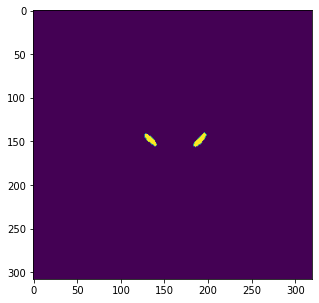

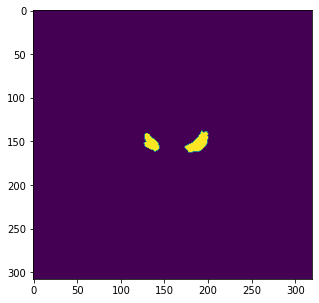

 --- --- --- 4th --- --- --- 


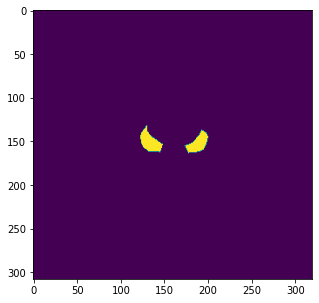

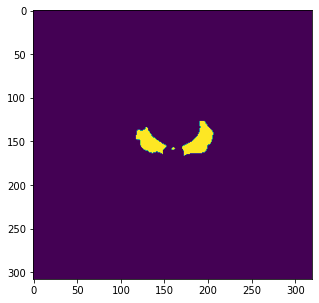

 --- --- --- 5th --- --- --- 


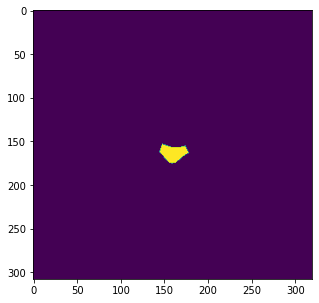

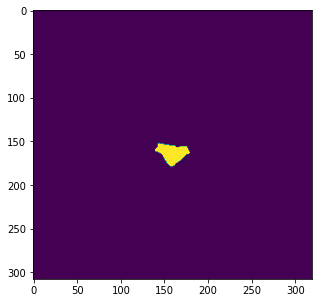

 --- --- --- 6th --- --- --- 


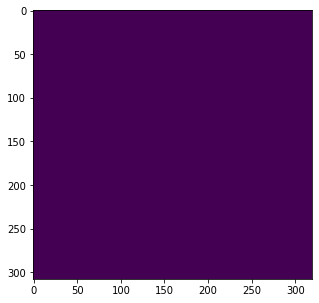

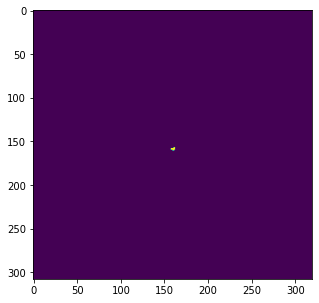

 --- --- --- img itself --- --- --- 


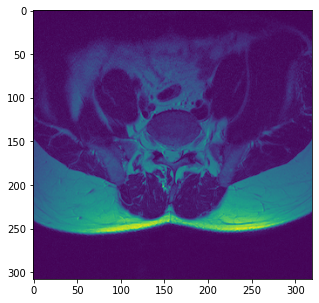

------------------------------------------------------------------------------------------

05917.PNG
infiles:  /home/natasha/unet/axial_data_new/test/First_3/pictures/05917.PNG
inmasks:  /home/natasha/unet/axial_data_new/test/First_3/masks/05917.npy
outputs:
torch.Size([1, 6, 308, 320])
torch.Size([1, 64, 308, 320])
torch.Size([1, 6, 600, 600])
torch.Size([1, 6, 600, 600])
torch.Size([1, 6, 600, 600])
torch.Size([1, 6, 600, 600])
torch.Size([1, 6, 600, 600])
full_output.shape: ...
10
output.shape: ...
torch.Size([1, 6, 308, 320])
mask.shape: ...
(6, 308, 320)
true_mask.shape: ...
(308, 320, 6)
uniques: ...
[0 1]
mask.shape: ...
(6, 308, 320)
 --- --- --- vis started --- --- --- 
 --- --- --- 1st --- --- --- 


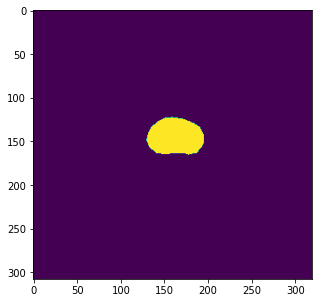

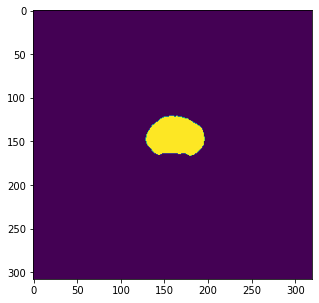

 --- --- --- 2nd --- --- --- 


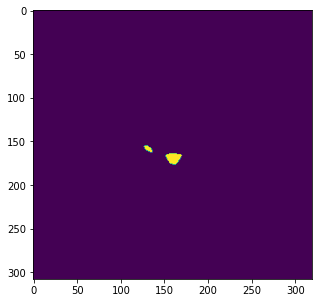

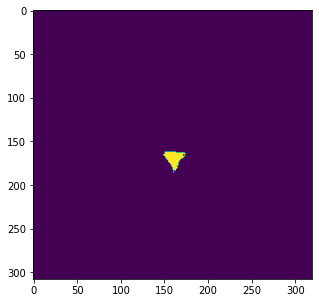

 --- --- --- 3rd --- --- --- 


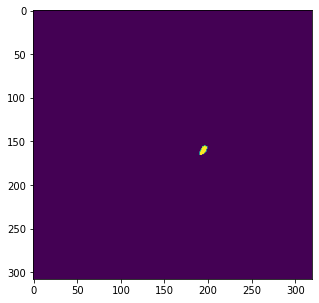

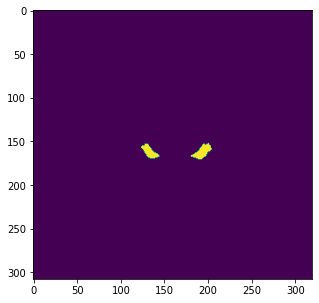

 --- --- --- 4th --- --- --- 


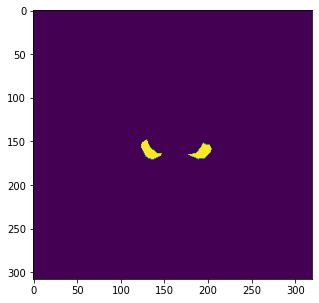

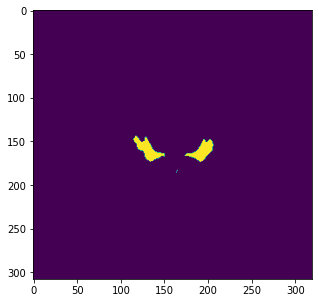

 --- --- --- 5th --- --- --- 


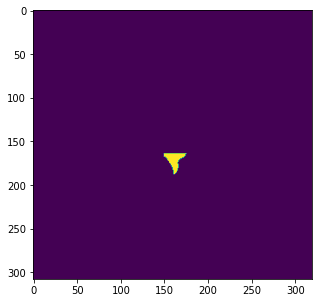

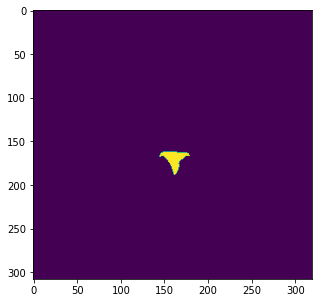

 --- --- --- 6th --- --- --- 


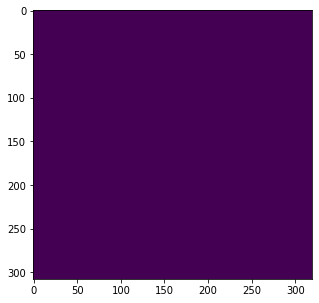

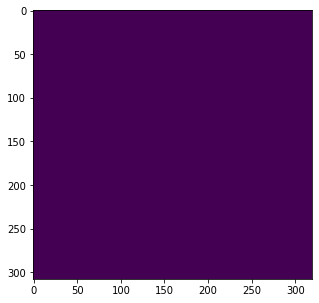

 --- --- --- img itself --- --- --- 


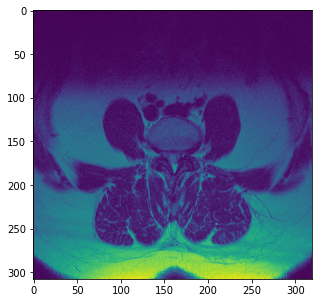

------------------------------------------------------------------------------------------

00100.PNG
infiles:  /home/natasha/unet/axial_data_new/test/First_3/pictures/00100.PNG
inmasks:  /home/natasha/unet/axial_data_new/test/First_3/masks/00100.npy
outputs:
torch.Size([1, 6, 308, 320])
torch.Size([1, 64, 308, 320])
torch.Size([1, 6, 600, 600])
torch.Size([1, 6, 600, 600])
torch.Size([1, 6, 600, 600])
torch.Size([1, 6, 600, 600])
torch.Size([1, 6, 600, 600])
full_output.shape: ...
10
output.shape: ...
torch.Size([1, 6, 308, 320])
mask.shape: ...
(6, 308, 320)
true_mask.shape: ...
(308, 320, 6)
uniques: ...
[0 1]
mask.shape: ...
(6, 308, 320)
 --- --- --- vis started --- --- --- 
 --- --- --- 1st --- --- --- 


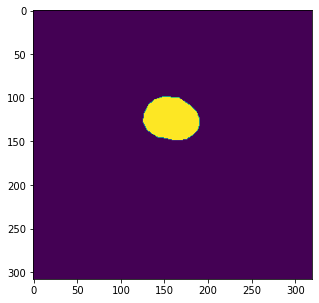

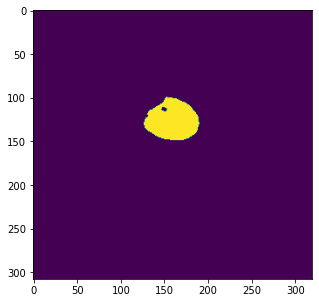

 --- --- --- 2nd --- --- --- 


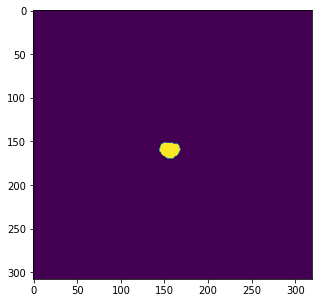

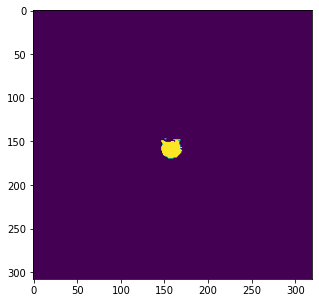

 --- --- --- 3rd --- --- --- 


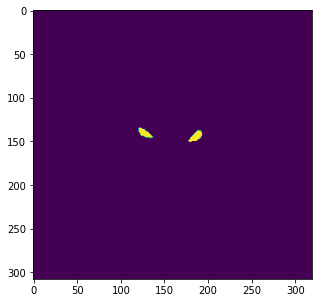

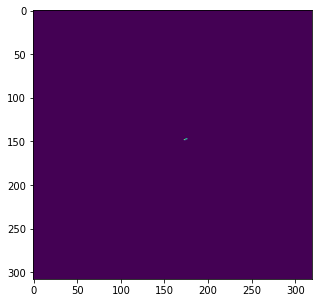

 --- --- --- 4th --- --- --- 


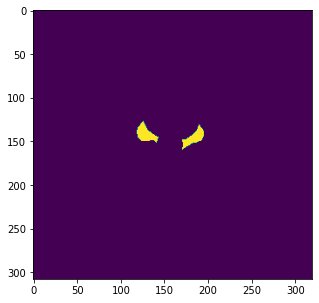

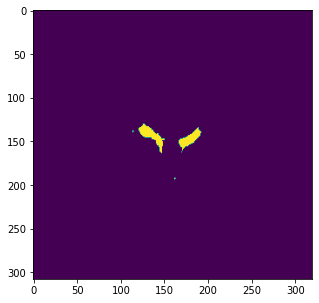

 --- --- --- 5th --- --- --- 


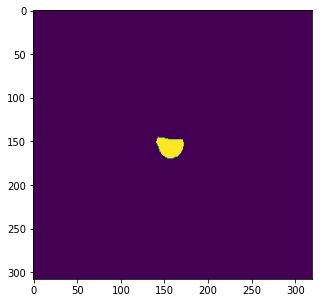

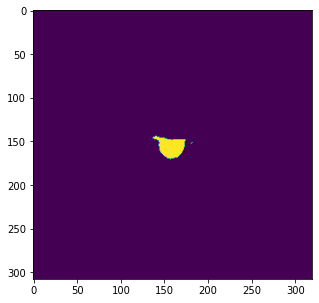

 --- --- --- 6th --- --- --- 


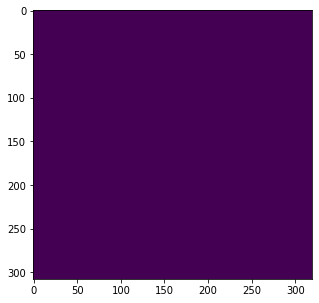

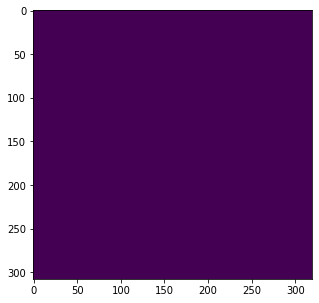

 --- --- --- img itself --- --- --- 


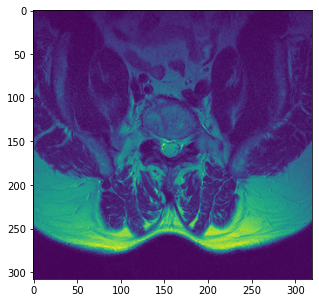

------------------------------------------------------------------------------------------

00096.PNG
infiles:  /home/natasha/unet/axial_data_new/test/First_3/pictures/00096.PNG
inmasks:  /home/natasha/unet/axial_data_new/test/First_3/masks/00096.npy
outputs:
torch.Size([1, 6, 308, 320])
torch.Size([1, 64, 308, 320])
torch.Size([1, 6, 600, 600])
torch.Size([1, 6, 600, 600])
torch.Size([1, 6, 600, 600])
torch.Size([1, 6, 600, 600])
torch.Size([1, 6, 600, 600])
full_output.shape: ...
10
output.shape: ...
torch.Size([1, 6, 308, 320])
mask.shape: ...
(6, 308, 320)
true_mask.shape: ...
(308, 320, 6)
uniques: ...
[0 1]
mask.shape: ...
(6, 308, 320)
 --- --- --- vis started --- --- --- 
 --- --- --- 1st --- --- --- 


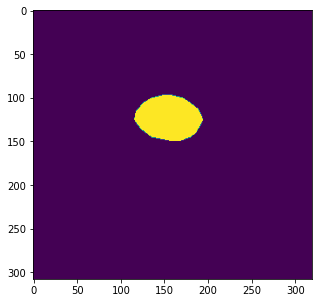

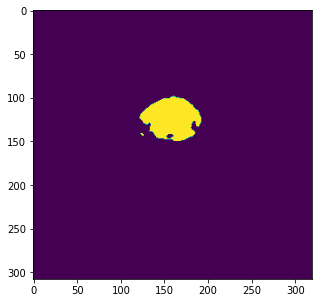

 --- --- --- 2nd --- --- --- 


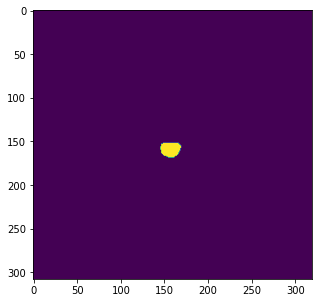

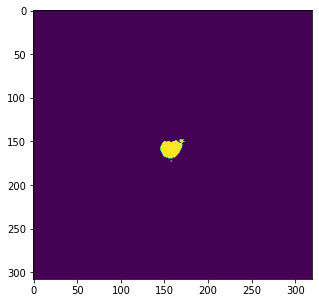

 --- --- --- 3rd --- --- --- 


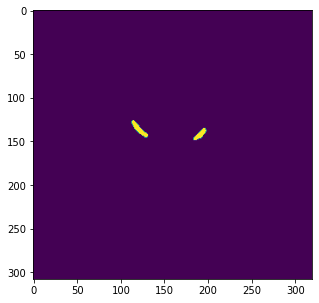

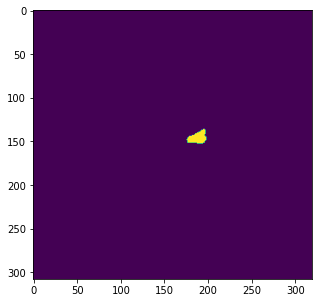

 --- --- --- 4th --- --- --- 


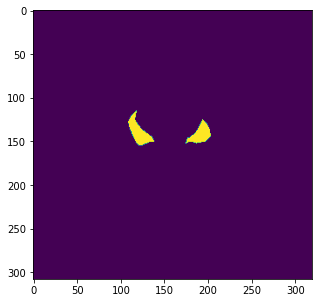

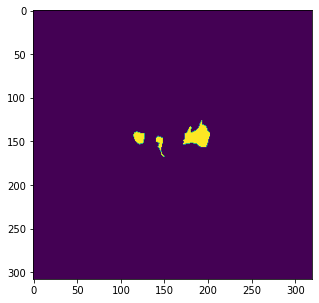

 --- --- --- 5th --- --- --- 


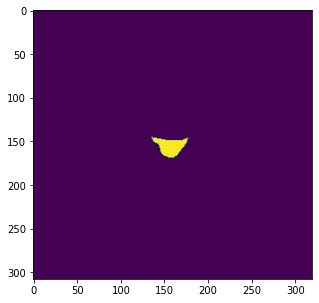

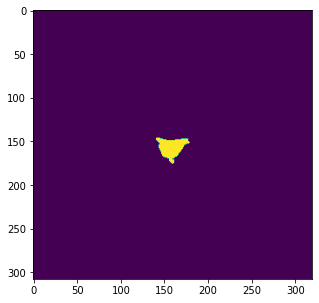

 --- --- --- 6th --- --- --- 


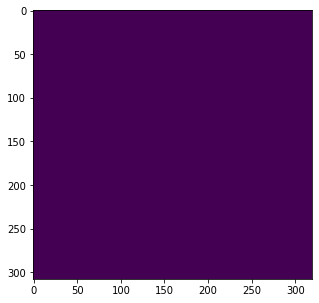

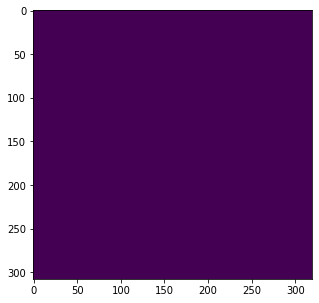

 --- --- --- img itself --- --- --- 


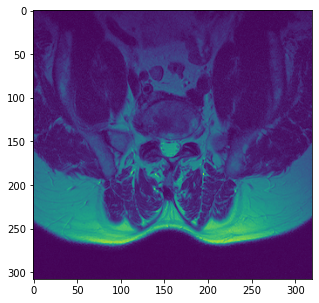

------------------------------------------------------------------------------------------

00103.PNG
infiles:  /home/natasha/unet/axial_data_new/test/First_3/pictures/00103.PNG
inmasks:  /home/natasha/unet/axial_data_new/test/First_3/masks/00103.npy
outputs:
torch.Size([1, 6, 308, 320])
torch.Size([1, 64, 308, 320])
torch.Size([1, 6, 600, 600])
torch.Size([1, 6, 600, 600])
torch.Size([1, 6, 600, 600])
torch.Size([1, 6, 600, 600])
torch.Size([1, 6, 600, 600])
full_output.shape: ...
10
output.shape: ...
torch.Size([1, 6, 308, 320])
mask.shape: ...
(6, 308, 320)
true_mask.shape: ...
(308, 320, 6)
uniques: ...
[0 1]
mask.shape: ...
(6, 308, 320)
 --- --- --- vis started --- --- --- 
 --- --- --- 1st --- --- --- 


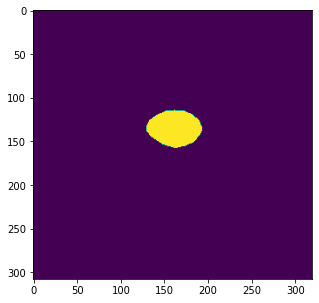

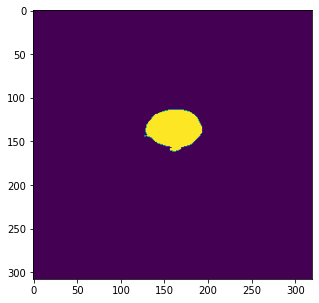

 --- --- --- 2nd --- --- --- 


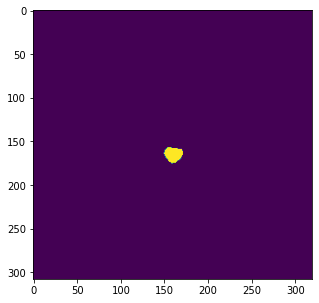

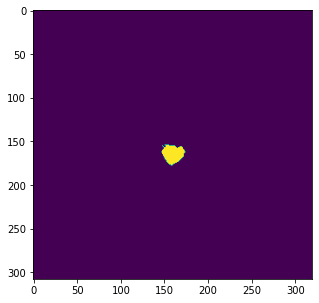

 --- --- --- 3rd --- --- --- 


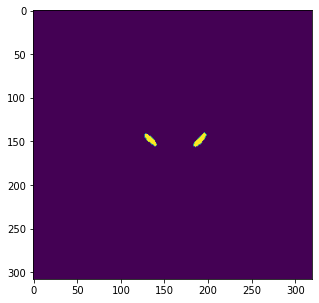

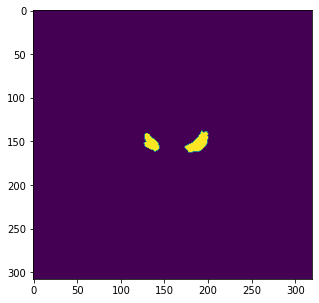

 --- --- --- 4th --- --- --- 


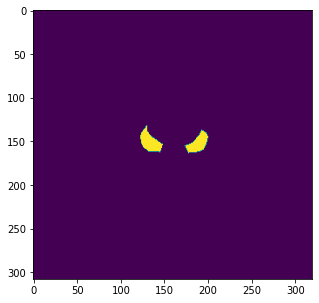

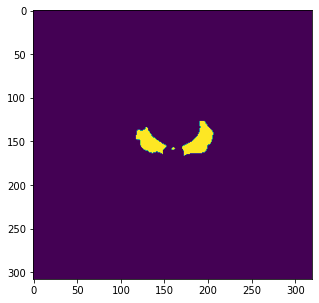

 --- --- --- 5th --- --- --- 


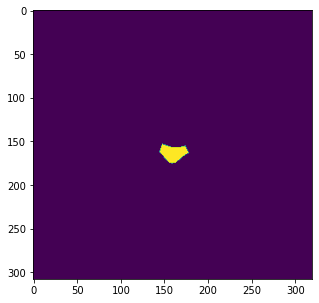

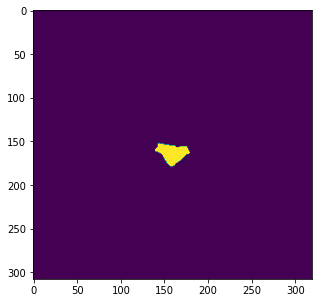

 --- --- --- 6th --- --- --- 


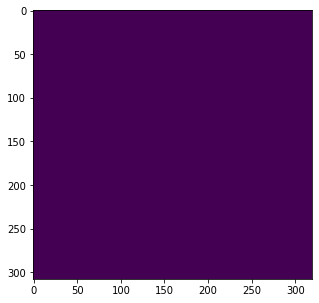

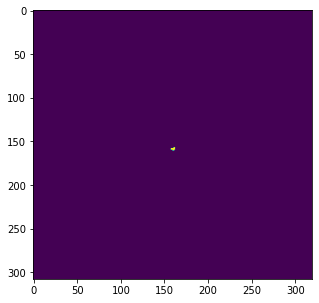

 --- --- --- img itself --- --- --- 


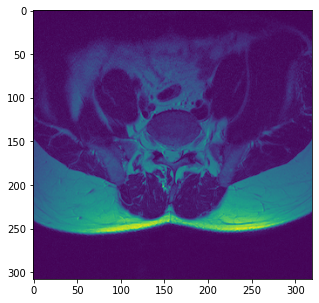

------------------------------------------------------------------------------------------

0102.PNG
infiles:  /home/natasha/unet/axial_data_new/test/First_3/pictures/0102.PNG
inmasks:  /home/natasha/unet/axial_data_new/test/First_3/masks/0102.npy
outputs:
torch.Size([1, 6, 308, 320])
torch.Size([1, 64, 308, 320])
torch.Size([1, 6, 600, 600])
torch.Size([1, 6, 600, 600])
torch.Size([1, 6, 600, 600])
torch.Size([1, 6, 600, 600])
torch.Size([1, 6, 600, 600])
full_output.shape: ...
10
output.shape: ...
torch.Size([1, 6, 308, 320])
mask.shape: ...
(6, 308, 320)
true_mask.shape: ...
(308, 320, 6)
uniques: ...
[0 1]
mask.shape: ...
(6, 308, 320)
 --- --- --- vis started --- --- --- 
 --- --- --- 1st --- --- --- 


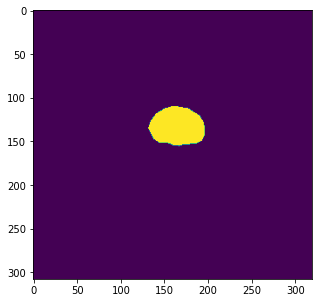

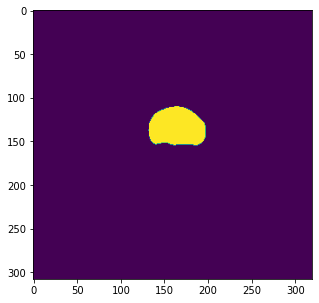

 --- --- --- 2nd --- --- --- 


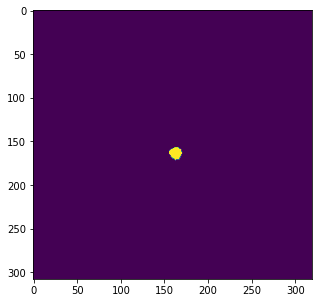

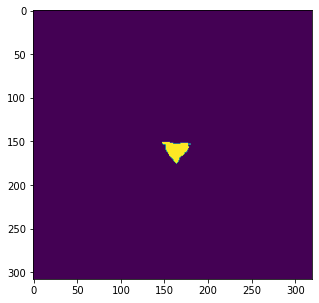

 --- --- --- 3rd --- --- --- 


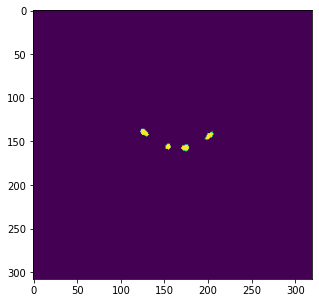

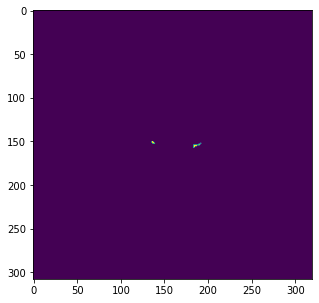

 --- --- --- 4th --- --- --- 


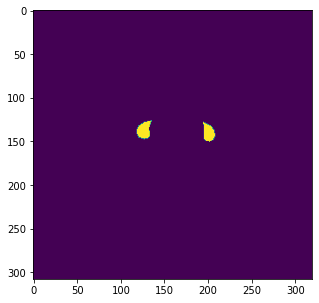

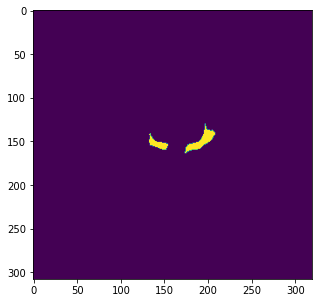

 --- --- --- 5th --- --- --- 


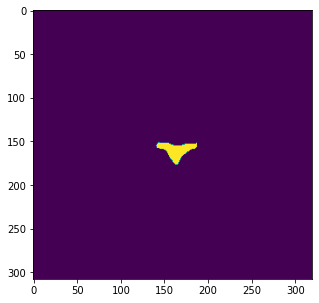

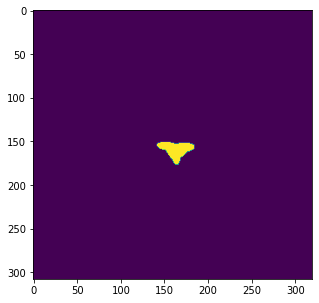

 --- --- --- 6th --- --- --- 


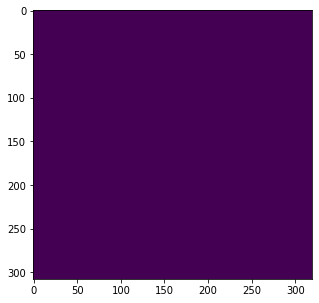

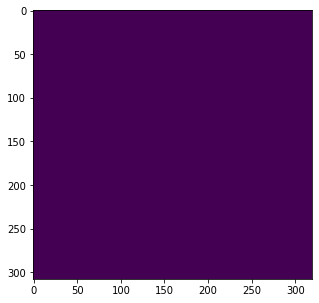

 --- --- --- img itself --- --- --- 


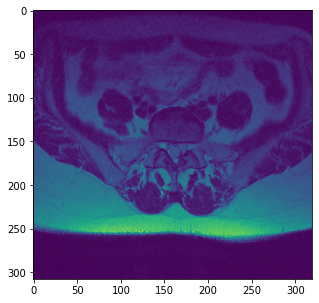

------------------------------------------------------------------------------------------

0096.PNG
infiles:  /home/natasha/unet/axial_data_new/test/First_3/pictures/0096.PNG
inmasks:  /home/natasha/unet/axial_data_new/test/First_3/masks/0096.npy
outputs:
torch.Size([1, 6, 308, 320])
torch.Size([1, 64, 308, 320])
torch.Size([1, 6, 600, 600])
torch.Size([1, 6, 600, 600])
torch.Size([1, 6, 600, 600])
torch.Size([1, 6, 600, 600])
torch.Size([1, 6, 600, 600])
full_output.shape: ...
10
output.shape: ...
torch.Size([1, 6, 308, 320])
mask.shape: ...
(6, 308, 320)
true_mask.shape: ...
(308, 320, 6)
uniques: ...
[0 1]
mask.shape: ...
(6, 308, 320)
 --- --- --- vis started --- --- --- 
 --- --- --- 1st --- --- --- 


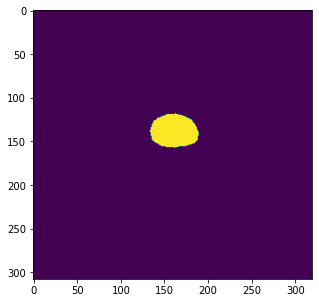

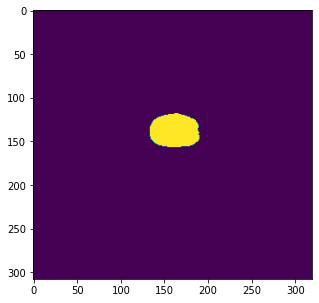

 --- --- --- 2nd --- --- --- 


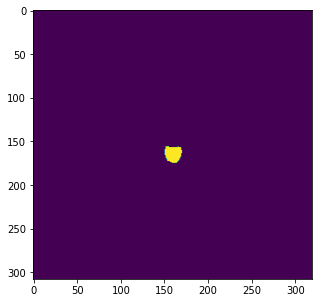

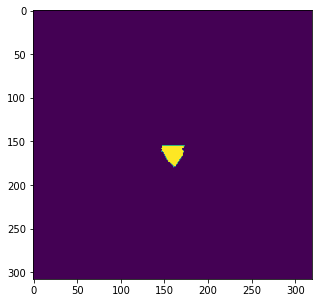

 --- --- --- 3rd --- --- --- 


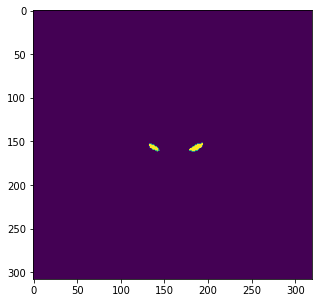

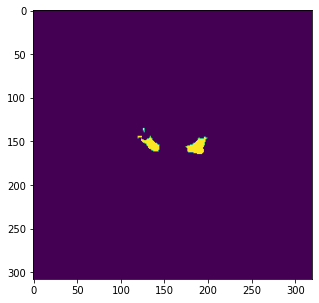

 --- --- --- 4th --- --- --- 


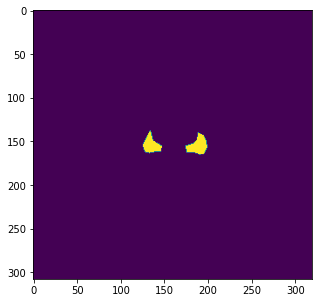

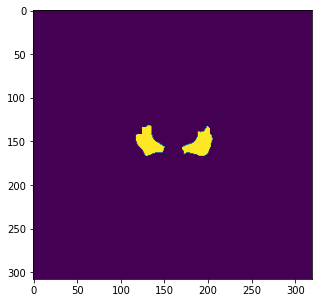

 --- --- --- 5th --- --- --- 


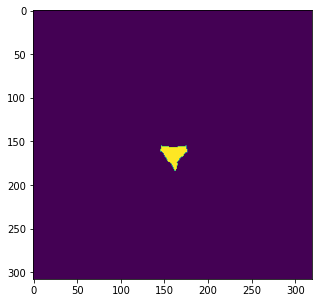

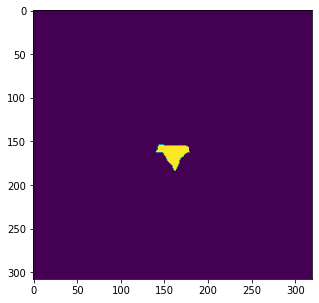

 --- --- --- 6th --- --- --- 


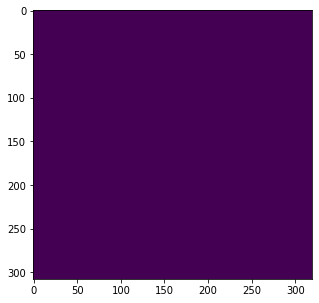

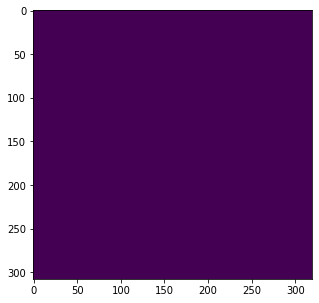

 --- --- --- img itself --- --- --- 


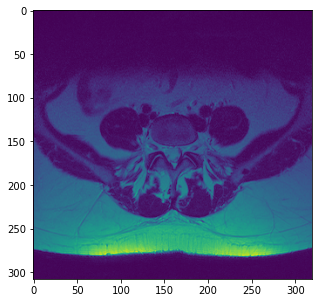

------------------------------------------------------------------------------------------

00093.PNG
infiles:  /home/natasha/unet/axial_data_new/test/First_3/pictures/00093.PNG
inmasks:  /home/natasha/unet/axial_data_new/test/First_3/masks/00093.npy
outputs:
torch.Size([1, 6, 308, 320])
torch.Size([1, 64, 308, 320])
torch.Size([1, 6, 600, 600])
torch.Size([1, 6, 600, 600])
torch.Size([1, 6, 600, 600])
torch.Size([1, 6, 600, 600])
torch.Size([1, 6, 600, 600])
full_output.shape: ...
10
output.shape: ...
torch.Size([1, 6, 308, 320])
mask.shape: ...
(6, 308, 320)
true_mask.shape: ...
(308, 320, 6)
uniques: ...
[0 1]
mask.shape: ...
(6, 308, 320)
 --- --- --- vis started --- --- --- 
 --- --- --- 1st --- --- --- 


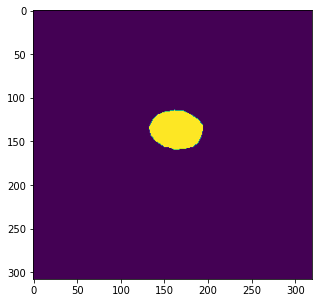

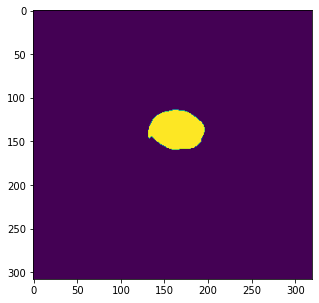

 --- --- --- 2nd --- --- --- 


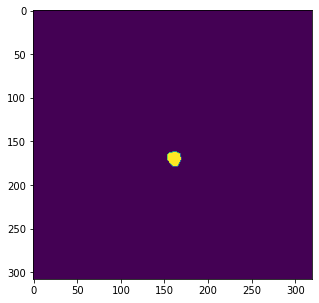

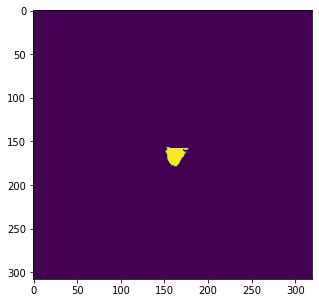

 --- --- --- 3rd --- --- --- 


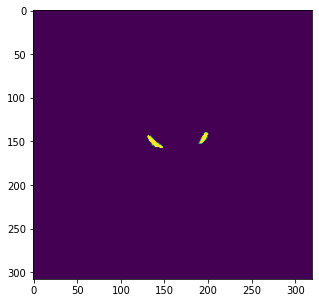

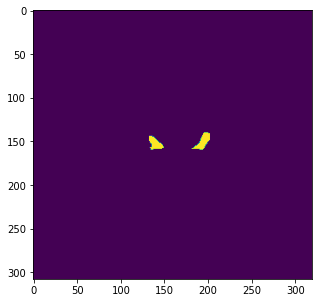

 --- --- --- 4th --- --- --- 


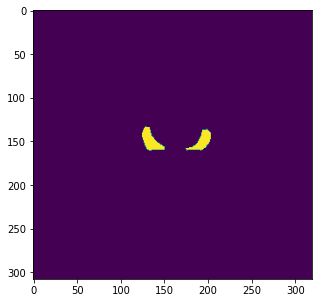

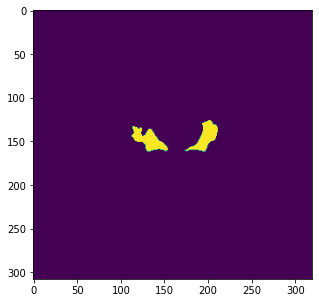

 --- --- --- 5th --- --- --- 


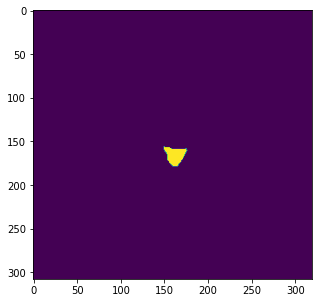

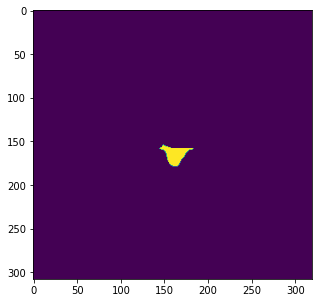

 --- --- --- 6th --- --- --- 


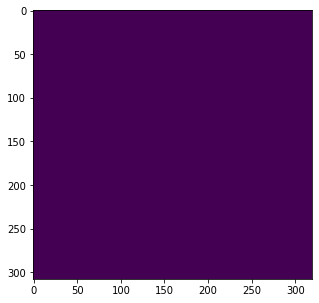

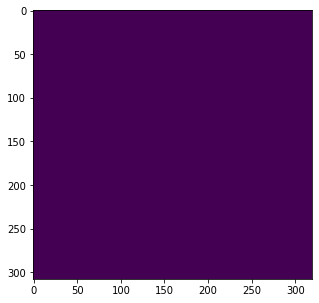

 --- --- --- img itself --- --- --- 


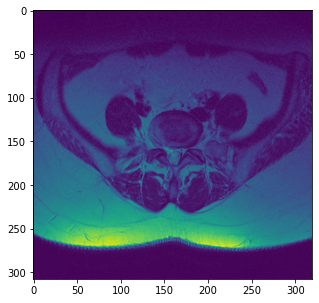

------------------------------------------------------------------------------------------

00072.PNG
infiles:  /home/natasha/unet/axial_data_new/test/First_3/pictures/00072.PNG
inmasks:  /home/natasha/unet/axial_data_new/test/First_3/masks/00072.npy
outputs:
torch.Size([1, 6, 308, 320])
torch.Size([1, 64, 308, 320])
torch.Size([1, 6, 600, 600])
torch.Size([1, 6, 600, 600])
torch.Size([1, 6, 600, 600])
torch.Size([1, 6, 600, 600])
torch.Size([1, 6, 600, 600])
full_output.shape: ...
10
output.shape: ...
torch.Size([1, 6, 308, 320])
mask.shape: ...
(6, 308, 320)
true_mask.shape: ...
(308, 320, 6)
uniques: ...
[0 1]
mask.shape: ...
(6, 308, 320)
 --- --- --- vis started --- --- --- 
 --- --- --- 1st --- --- --- 


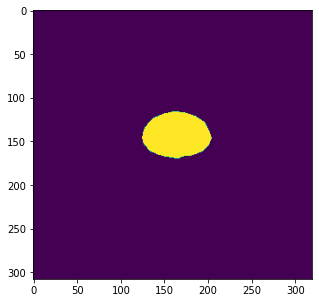

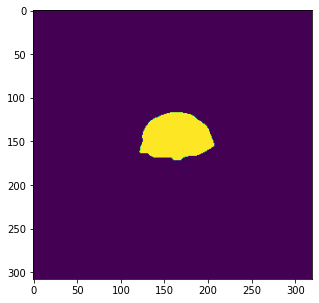

 --- --- --- 2nd --- --- --- 


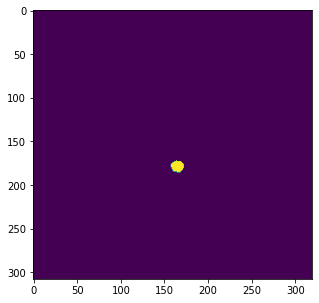

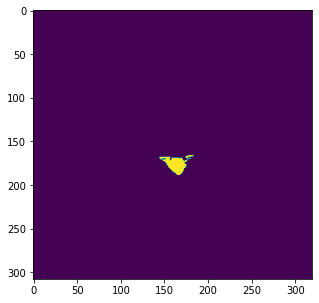

 --- --- --- 3rd --- --- --- 


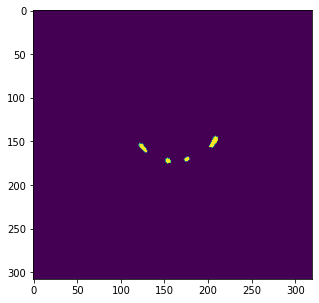

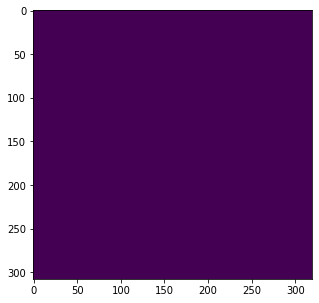

 --- --- --- 4th --- --- --- 


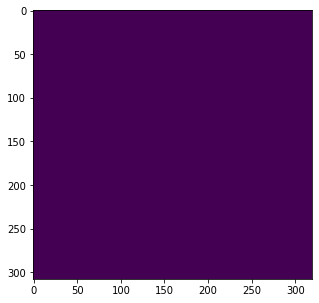

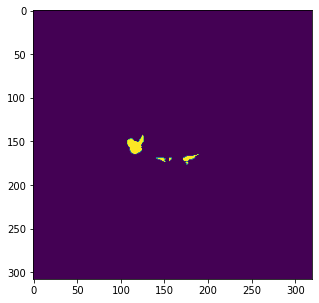

 --- --- --- 5th --- --- --- 


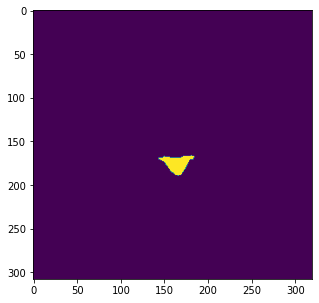

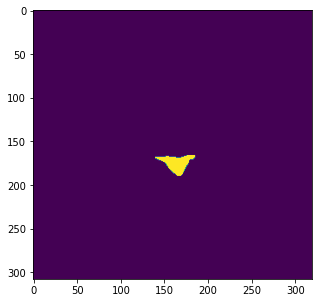

 --- --- --- 6th --- --- --- 


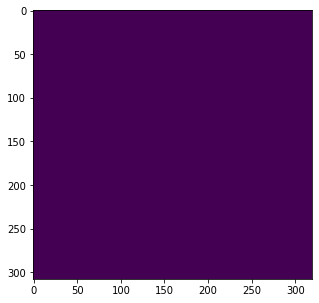

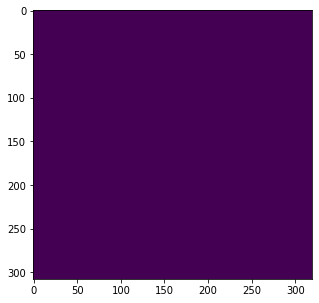

 --- --- --- img itself --- --- --- 


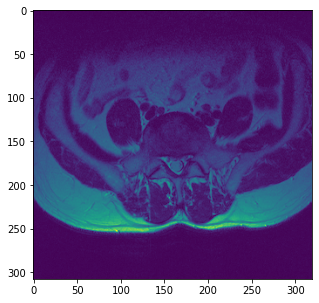

------------------------------------------------------------------------------------------

0074.PNG
infiles:  /home/natasha/unet/axial_data_new/test/First_3/pictures/0074.PNG
inmasks:  /home/natasha/unet/axial_data_new/test/First_3/masks/0074.npy
outputs:
torch.Size([1, 6, 308, 320])
torch.Size([1, 64, 308, 320])
torch.Size([1, 6, 600, 600])
torch.Size([1, 6, 600, 600])
torch.Size([1, 6, 600, 600])
torch.Size([1, 6, 600, 600])
torch.Size([1, 6, 600, 600])
full_output.shape: ...
10
output.shape: ...
torch.Size([1, 6, 308, 320])
mask.shape: ...
(6, 308, 320)
true_mask.shape: ...
(308, 320, 6)
uniques: ...
[0 1]
mask.shape: ...
(6, 308, 320)
 --- --- --- vis started --- --- --- 
 --- --- --- 1st --- --- --- 


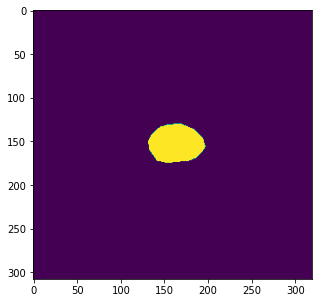

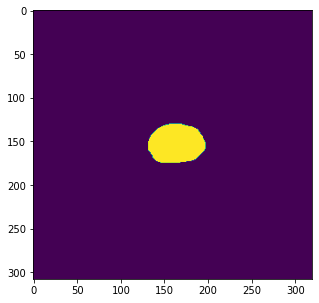

 --- --- --- 2nd --- --- --- 


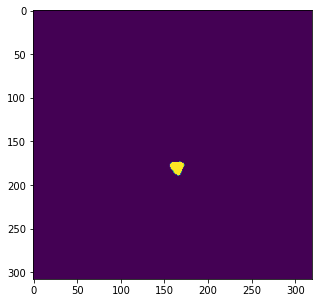

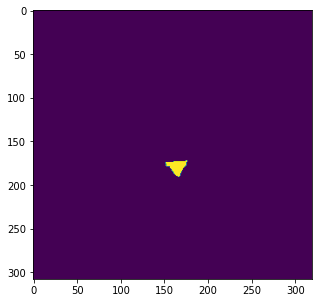

 --- --- --- 3rd --- --- --- 


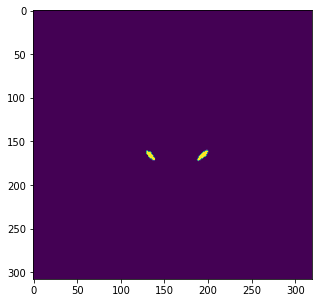

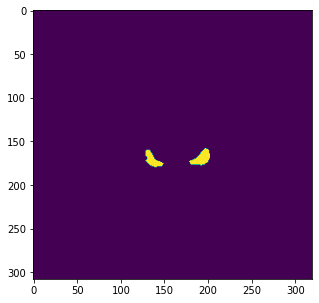

 --- --- --- 4th --- --- --- 


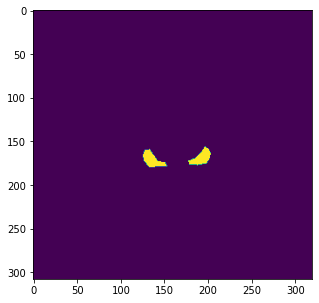

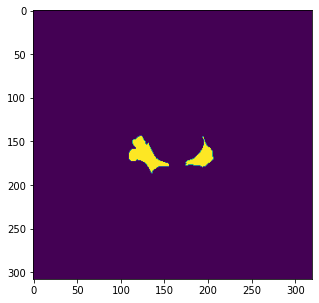

 --- --- --- 5th --- --- --- 


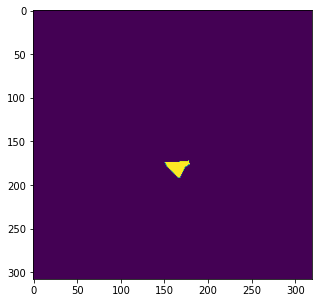

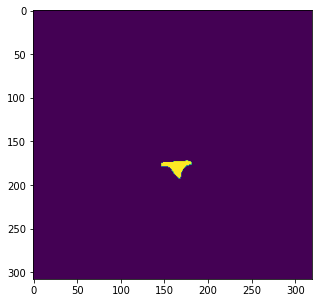

 --- --- --- 6th --- --- --- 


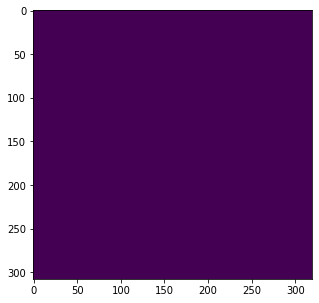

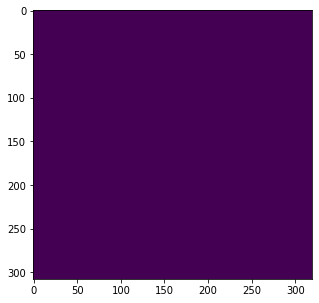

 --- --- --- img itself --- --- --- 


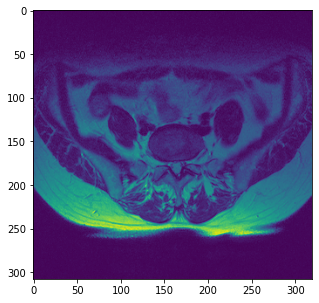

------------------------------------------------------------------------------------------

05768.PNG
infiles:  /home/natasha/unet/axial_data_new/test/First_3/pictures/05768.PNG
inmasks:  /home/natasha/unet/axial_data_new/test/First_3/masks/05768.npy
outputs:
torch.Size([1, 6, 308, 320])
torch.Size([1, 64, 308, 320])
torch.Size([1, 6, 600, 600])
torch.Size([1, 6, 600, 600])
torch.Size([1, 6, 600, 600])
torch.Size([1, 6, 600, 600])
torch.Size([1, 6, 600, 600])
full_output.shape: ...
10
output.shape: ...
torch.Size([1, 6, 308, 320])
mask.shape: ...
(6, 308, 320)
true_mask.shape: ...
(308, 320, 6)
uniques: ...
[0 1]
mask.shape: ...
(6, 308, 320)
 --- --- --- vis started --- --- --- 
 --- --- --- 1st --- --- --- 


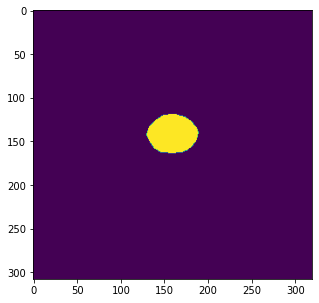

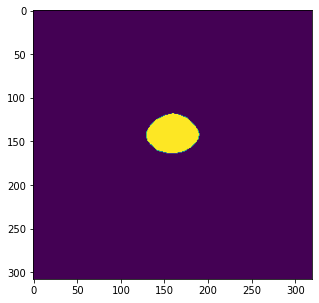

 --- --- --- 2nd --- --- --- 


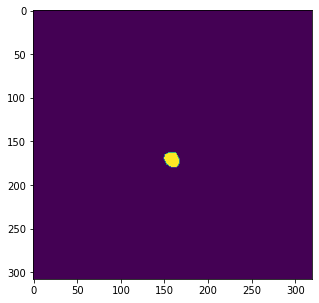

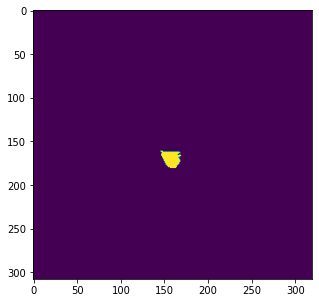

 --- --- --- 3rd --- --- --- 


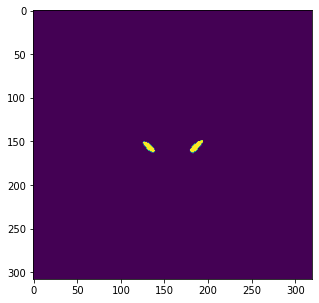

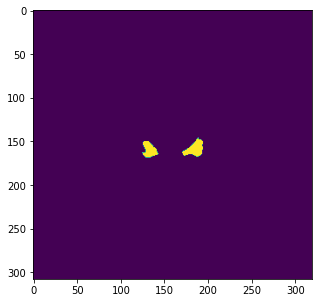

 --- --- --- 4th --- --- --- 


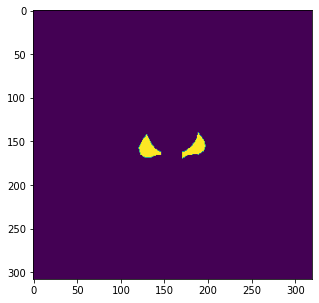

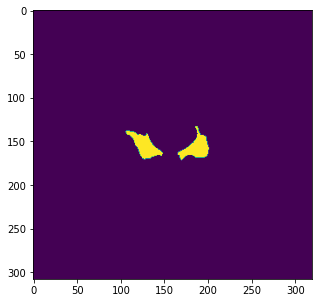

 --- --- --- 5th --- --- --- 


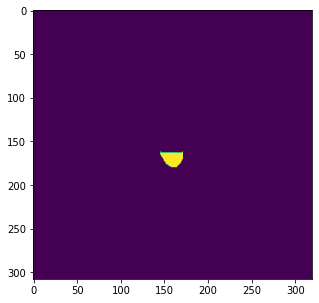

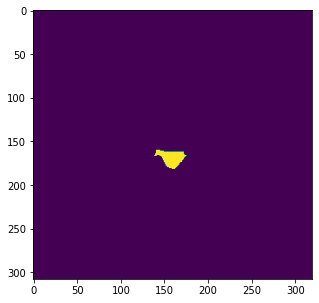

 --- --- --- 6th --- --- --- 


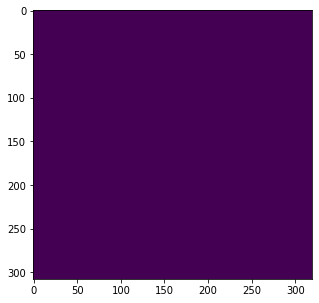

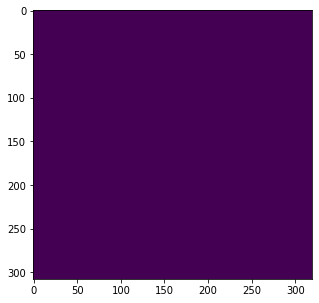

 --- --- --- img itself --- --- --- 


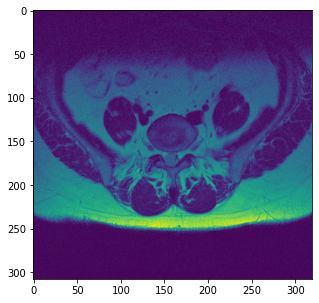

------------------------------------------------------------------------------------------

05766.PNG
infiles:  /home/natasha/unet/axial_data_new/test/First_3/pictures/05766.PNG
inmasks:  /home/natasha/unet/axial_data_new/test/First_3/masks/05766.npy
outputs:
torch.Size([1, 6, 256, 256])
torch.Size([1, 64, 256, 256])
torch.Size([1, 6, 600, 600])
torch.Size([1, 6, 600, 600])
torch.Size([1, 6, 600, 600])
torch.Size([1, 6, 600, 600])
torch.Size([1, 6, 600, 600])
full_output.shape: ...
10
output.shape: ...
torch.Size([1, 6, 256, 256])
mask.shape: ...
(6, 256, 256)
true_mask.shape: ...
(256, 256, 6)
uniques: ...
[0 1]
mask.shape: ...
(6, 256, 256)
 --- --- --- vis started --- --- --- 
 --- --- --- 1st --- --- --- 


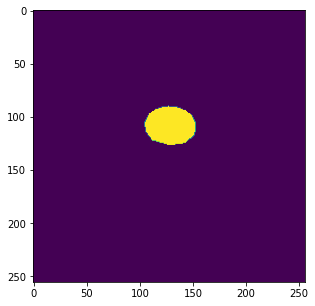

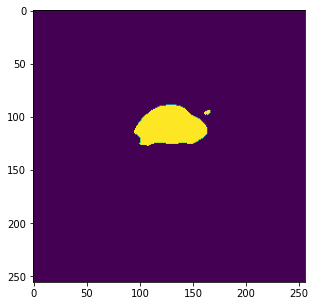

 --- --- --- 2nd --- --- --- 


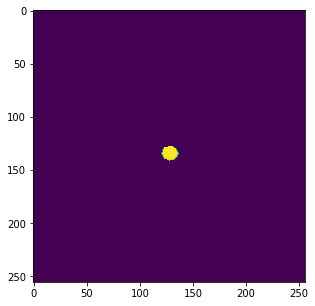

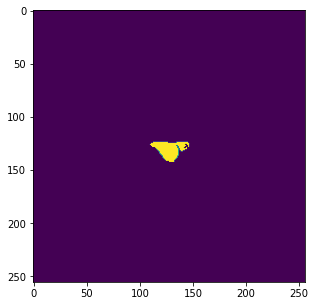

 --- --- --- 3rd --- --- --- 


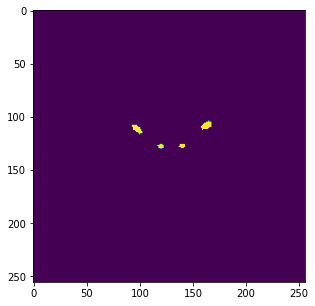

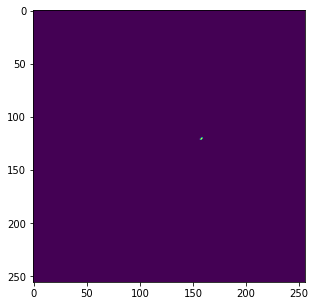

 --- --- --- 4th --- --- --- 


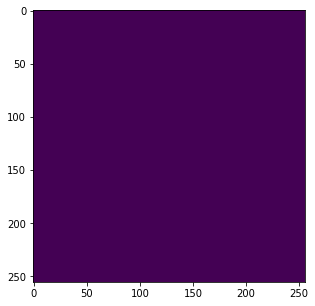

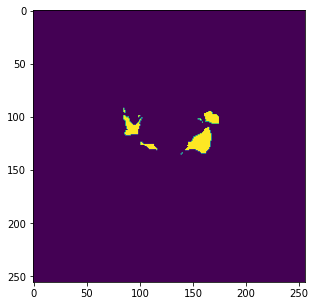

 --- --- --- 5th --- --- --- 


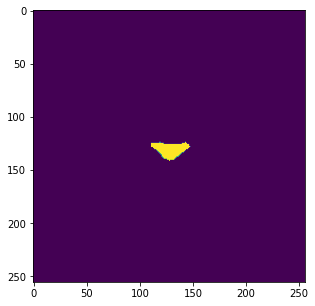

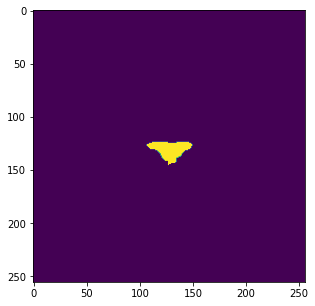

 --- --- --- 6th --- --- --- 


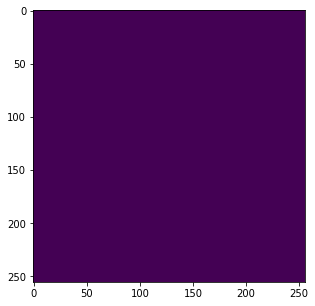

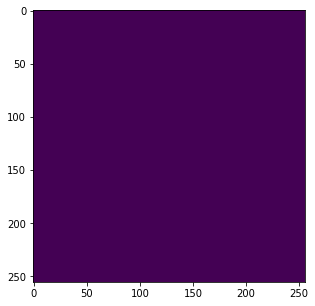

 --- --- --- img itself --- --- --- 


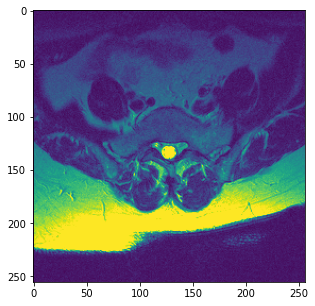

------------------------------------------------------------------------------------------

0078.PNG
infiles:  /home/natasha/unet/axial_data_new/test/First_3/pictures/0078.PNG
inmasks:  /home/natasha/unet/axial_data_new/test/First_3/masks/0078.npy
outputs:
torch.Size([1, 6, 308, 320])
torch.Size([1, 64, 308, 320])
torch.Size([1, 6, 600, 600])
torch.Size([1, 6, 600, 600])
torch.Size([1, 6, 600, 600])
torch.Size([1, 6, 600, 600])
torch.Size([1, 6, 600, 600])
full_output.shape: ...
10
output.shape: ...
torch.Size([1, 6, 308, 320])
mask.shape: ...
(6, 308, 320)
true_mask.shape: ...
(308, 320, 6)
uniques: ...
[0 1]
mask.shape: ...
(6, 308, 320)
 --- --- --- vis started --- --- --- 
 --- --- --- 1st --- --- --- 


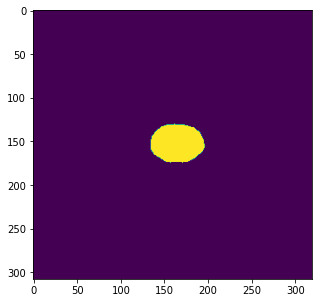

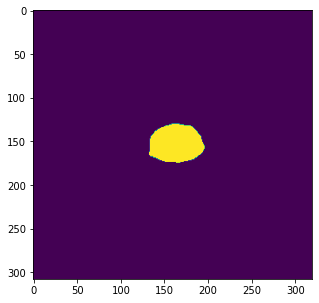

 --- --- --- 2nd --- --- --- 


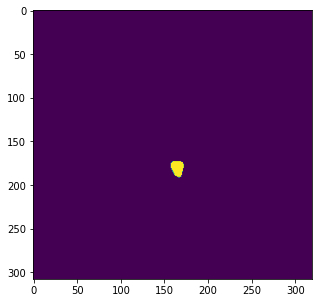

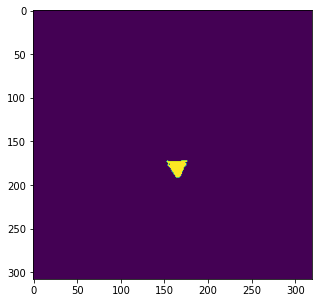

 --- --- --- 3rd --- --- --- 


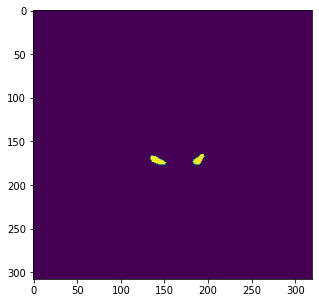

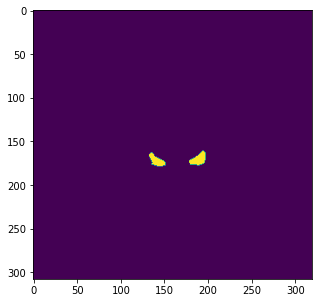

 --- --- --- 4th --- --- --- 


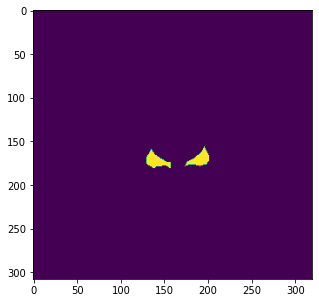

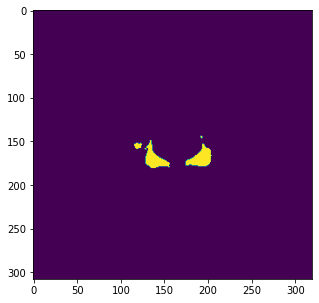

 --- --- --- 5th --- --- --- 


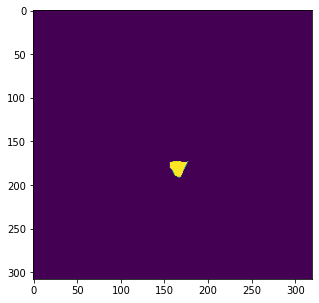

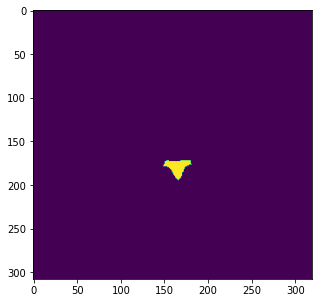

 --- --- --- 6th --- --- --- 


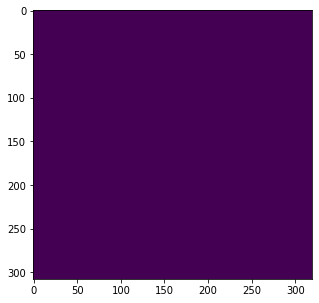

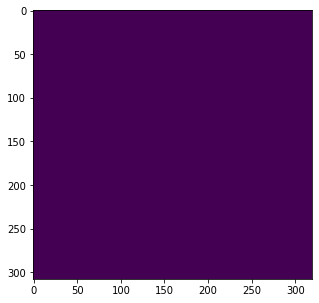

 --- --- --- img itself --- --- --- 


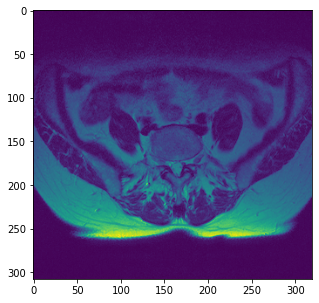

------------------------------------------------------------------------------------------

00067.PNG
infiles:  /home/natasha/unet/axial_data_new/test/First_3/pictures/00067.PNG
inmasks:  /home/natasha/unet/axial_data_new/test/First_3/masks/00067.npy
outputs:
torch.Size([1, 6, 308, 320])
torch.Size([1, 64, 308, 320])
torch.Size([1, 6, 600, 600])
torch.Size([1, 6, 600, 600])
torch.Size([1, 6, 600, 600])
torch.Size([1, 6, 600, 600])
torch.Size([1, 6, 600, 600])
full_output.shape: ...
10
output.shape: ...
torch.Size([1, 6, 308, 320])
mask.shape: ...
(6, 308, 320)
true_mask.shape: ...
(308, 320, 6)
uniques: ...
[0 1]
mask.shape: ...
(6, 308, 320)
 --- --- --- vis started --- --- --- 
 --- --- --- 1st --- --- --- 


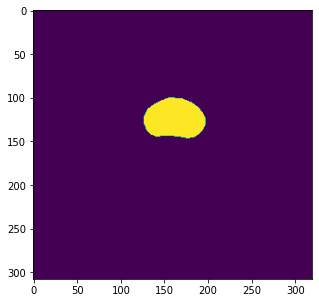

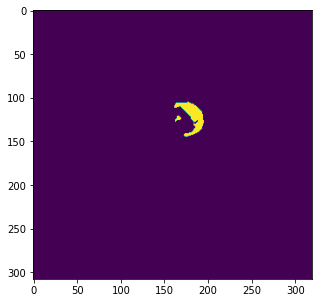

 --- --- --- 2nd --- --- --- 


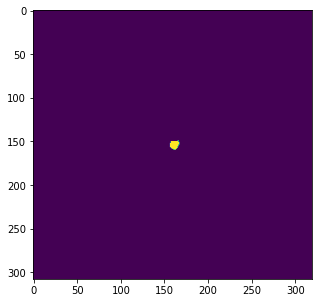

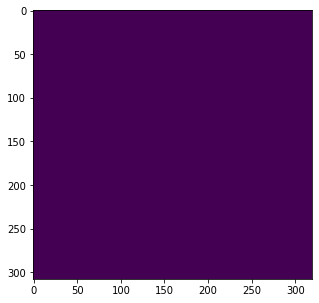

 --- --- --- 3rd --- --- --- 


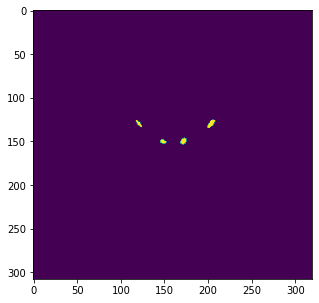

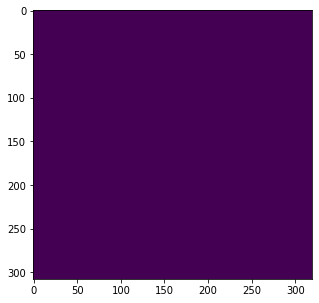

 --- --- --- 4th --- --- --- 


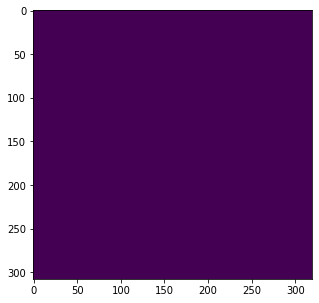

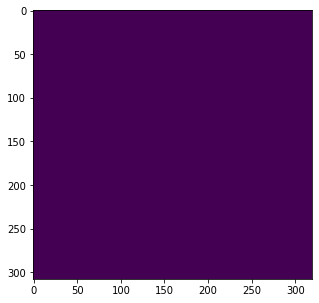

 --- --- --- 5th --- --- --- 


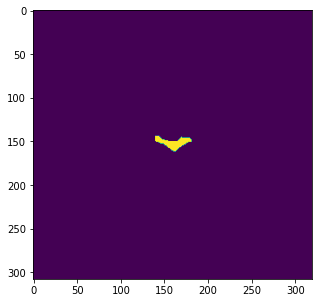

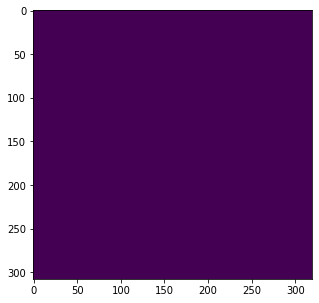

 --- --- --- 6th --- --- --- 


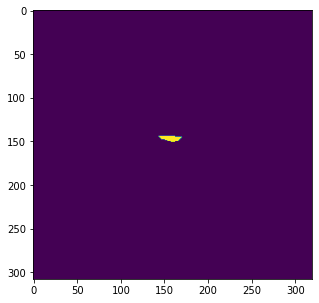

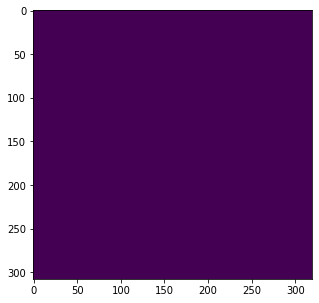

 --- --- --- img itself --- --- --- 


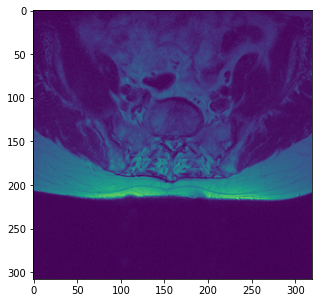

------------------------------------------------------------------------------------------

00079.PNG
infiles:  /home/natasha/unet/axial_data_new/test/First_3/pictures/00079.PNG
inmasks:  /home/natasha/unet/axial_data_new/test/First_3/masks/00079.npy
outputs:
torch.Size([1, 6, 308, 320])
torch.Size([1, 64, 308, 320])
torch.Size([1, 6, 600, 600])
torch.Size([1, 6, 600, 600])
torch.Size([1, 6, 600, 600])
torch.Size([1, 6, 600, 600])
torch.Size([1, 6, 600, 600])
full_output.shape: ...
10
output.shape: ...
torch.Size([1, 6, 308, 320])
mask.shape: ...
(6, 308, 320)
true_mask.shape: ...
(308, 320, 6)
uniques: ...
[0 1]
mask.shape: ...
(6, 308, 320)
 --- --- --- vis started --- --- --- 
 --- --- --- 1st --- --- --- 


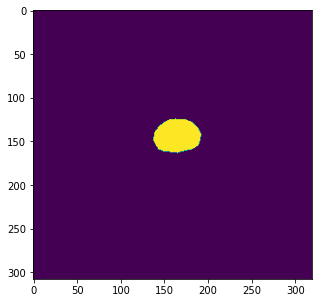

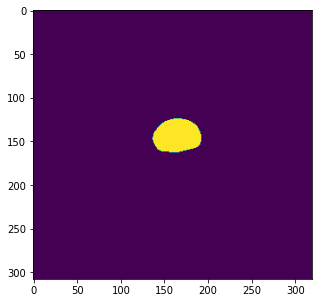

 --- --- --- 2nd --- --- --- 


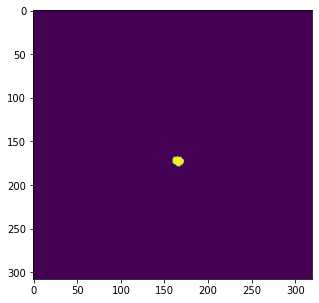

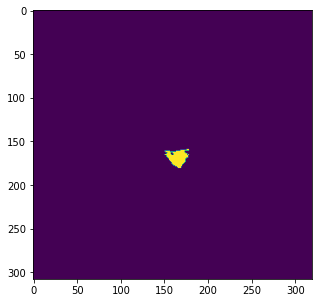

 --- --- --- 3rd --- --- --- 


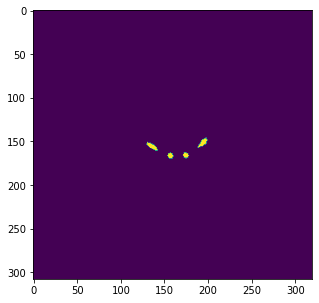

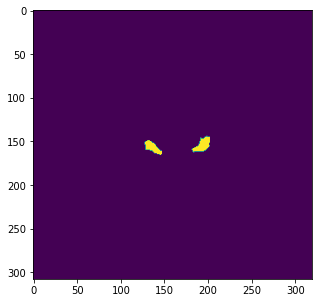

 --- --- --- 4th --- --- --- 


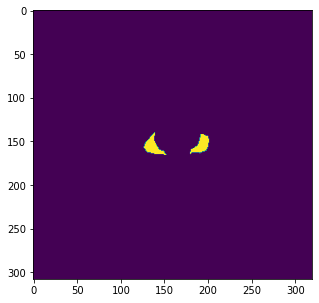

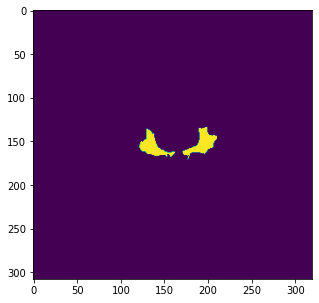

 --- --- --- 5th --- --- --- 


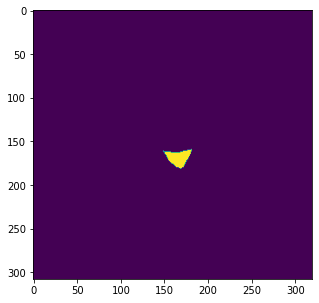

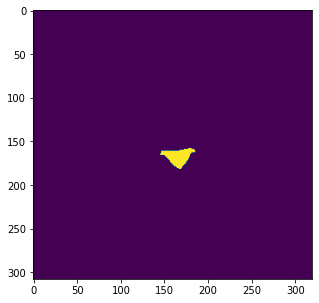

 --- --- --- 6th --- --- --- 


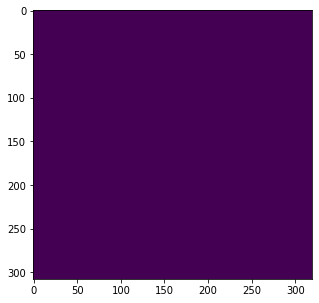

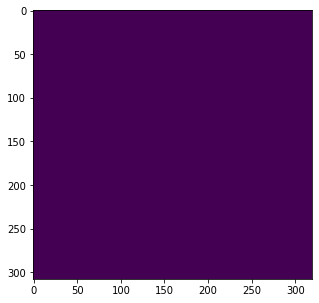

 --- --- --- img itself --- --- --- 


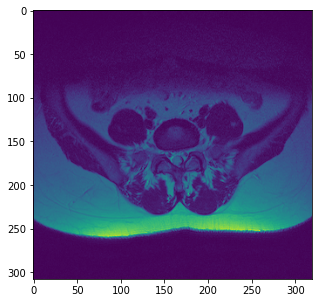

------------------------------------------------------------------------------------------

00111.PNG
infiles:  /home/natasha/unet/axial_data_new/test/First_3/pictures/00111.PNG
inmasks:  /home/natasha/unet/axial_data_new/test/First_3/masks/00111.npy
outputs:
torch.Size([1, 6, 308, 320])
torch.Size([1, 64, 308, 320])
torch.Size([1, 6, 600, 600])
torch.Size([1, 6, 600, 600])
torch.Size([1, 6, 600, 600])
torch.Size([1, 6, 600, 600])
torch.Size([1, 6, 600, 600])
full_output.shape: ...
10
output.shape: ...
torch.Size([1, 6, 308, 320])
mask.shape: ...
(6, 308, 320)
true_mask.shape: ...
(308, 320, 6)
uniques: ...
[0 1]
mask.shape: ...
(6, 308, 320)
 --- --- --- vis started --- --- --- 
 --- --- --- 1st --- --- --- 


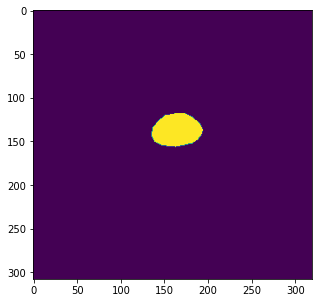

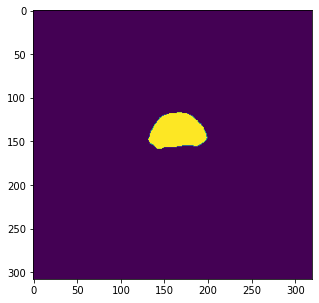

 --- --- --- 2nd --- --- --- 


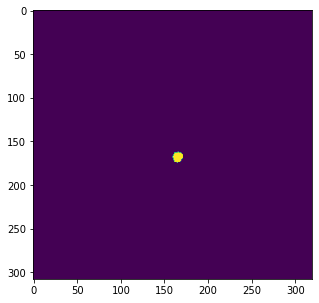

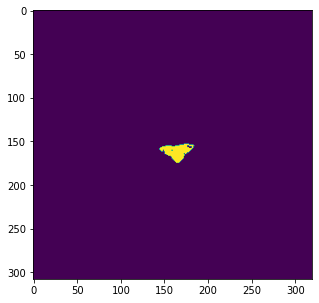

 --- --- --- 3rd --- --- --- 


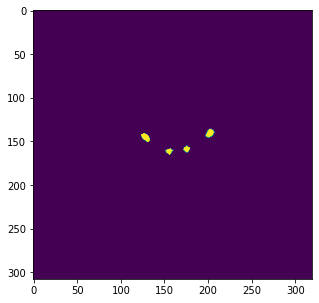

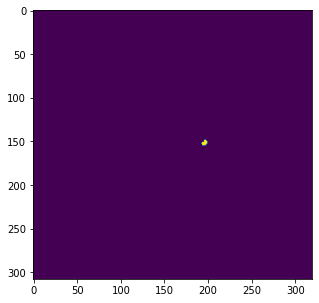

 --- --- --- 4th --- --- --- 


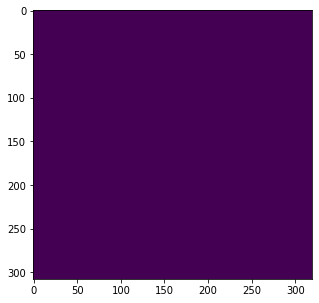

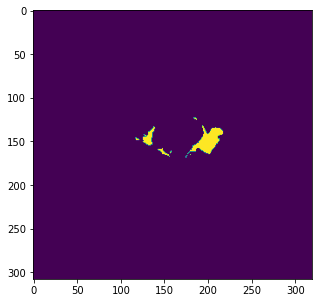

 --- --- --- 5th --- --- --- 


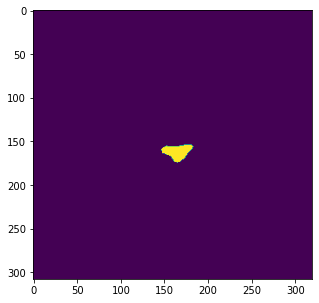

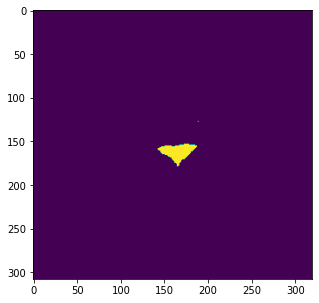

 --- --- --- 6th --- --- --- 


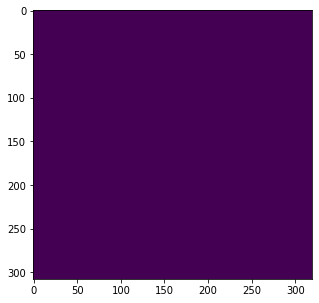

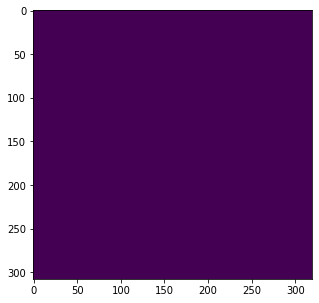

 --- --- --- img itself --- --- --- 


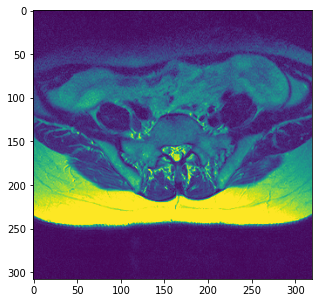

------------------------------------------------------------------------------------------

05783.PNG
infiles:  /home/natasha/unet/axial_data_new/test/First_3/pictures/05783.PNG
inmasks:  /home/natasha/unet/axial_data_new/test/First_3/masks/05783.npy
outputs:
torch.Size([1, 6, 308, 320])
torch.Size([1, 64, 308, 320])
torch.Size([1, 6, 600, 600])
torch.Size([1, 6, 600, 600])
torch.Size([1, 6, 600, 600])
torch.Size([1, 6, 600, 600])
torch.Size([1, 6, 600, 600])
full_output.shape: ...
10
output.shape: ...
torch.Size([1, 6, 308, 320])
mask.shape: ...
(6, 308, 320)
true_mask.shape: ...
(308, 320, 6)
uniques: ...
[0 1]
mask.shape: ...
(6, 308, 320)
 --- --- --- vis started --- --- --- 
 --- --- --- 1st --- --- --- 


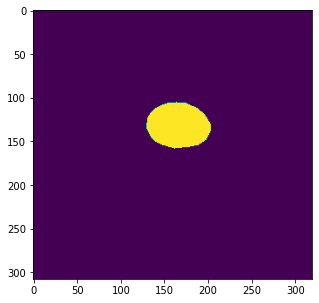

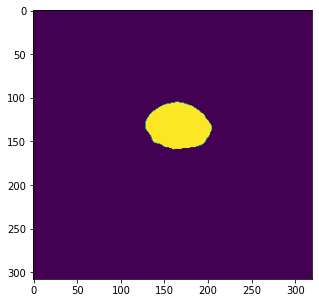

 --- --- --- 2nd --- --- --- 


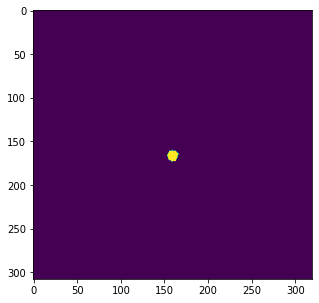

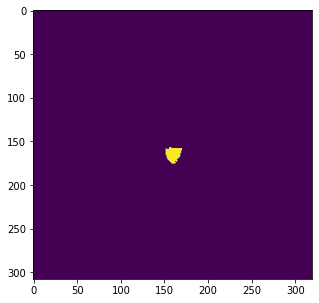

 --- --- --- 3rd --- --- --- 


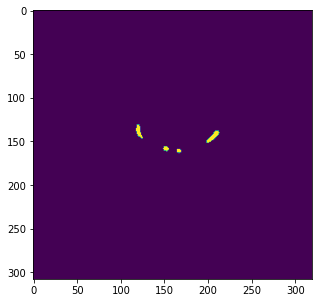

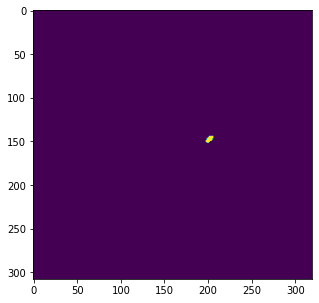

 --- --- --- 4th --- --- --- 


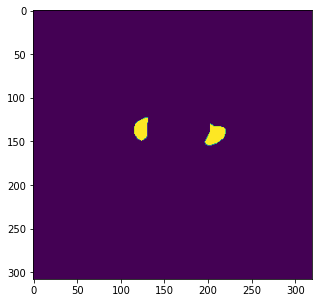

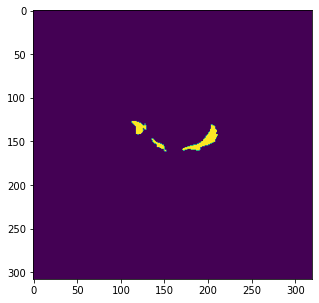

 --- --- --- 5th --- --- --- 


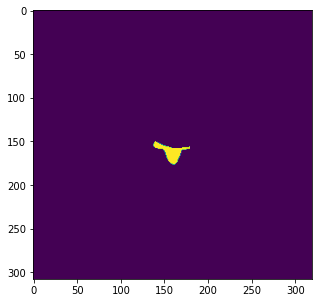

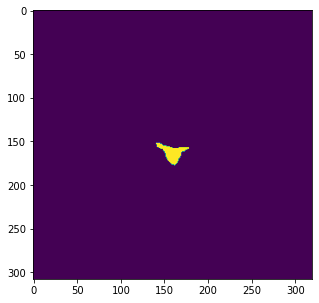

 --- --- --- 6th --- --- --- 


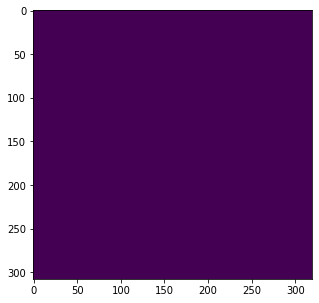

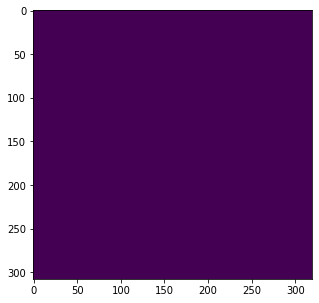

 --- --- --- img itself --- --- --- 


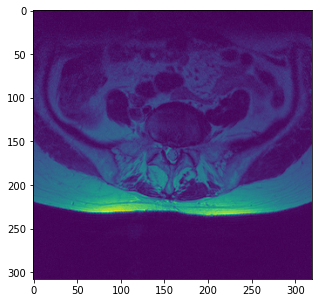

------------------------------------------------------------------------------------------

0098.PNG
infiles:  /home/natasha/unet/axial_data_new/test/First_3/pictures/0098.PNG
inmasks:  /home/natasha/unet/axial_data_new/test/First_3/masks/0098.npy
outputs:
torch.Size([1, 6, 308, 320])
torch.Size([1, 64, 308, 320])
torch.Size([1, 6, 600, 600])
torch.Size([1, 6, 600, 600])
torch.Size([1, 6, 600, 600])
torch.Size([1, 6, 600, 600])
torch.Size([1, 6, 600, 600])
full_output.shape: ...
10
output.shape: ...
torch.Size([1, 6, 308, 320])
mask.shape: ...
(6, 308, 320)
true_mask.shape: ...
(308, 320, 6)
uniques: ...
[0 1]
mask.shape: ...
(6, 308, 320)
 --- --- --- vis started --- --- --- 
 --- --- --- 1st --- --- --- 


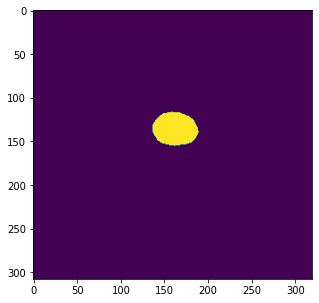

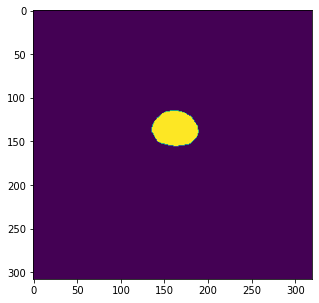

 --- --- --- 2nd --- --- --- 


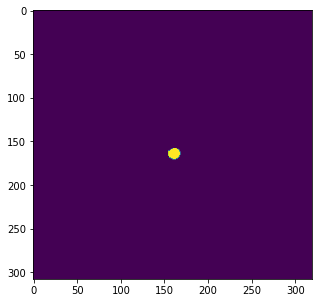

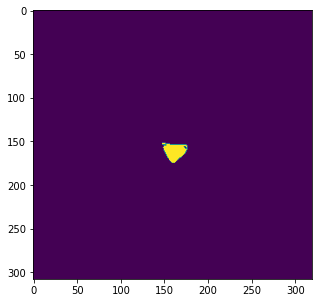

 --- --- --- 3rd --- --- --- 


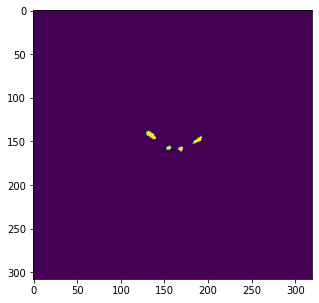

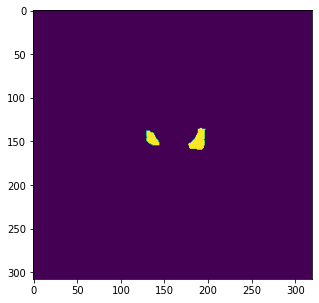

 --- --- --- 4th --- --- --- 


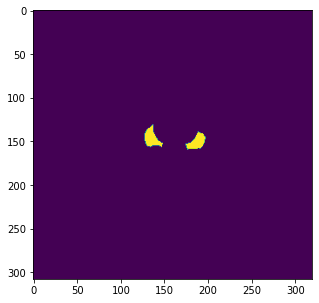

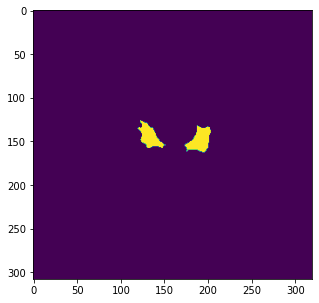

 --- --- --- 5th --- --- --- 


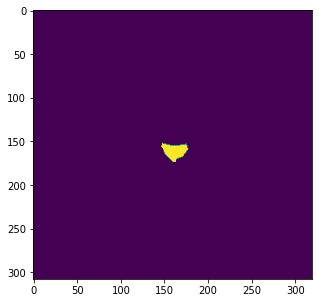

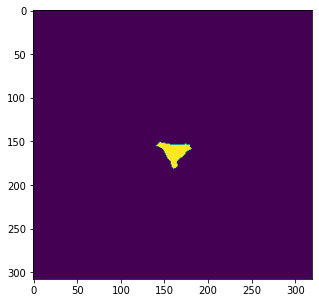

 --- --- --- 6th --- --- --- 


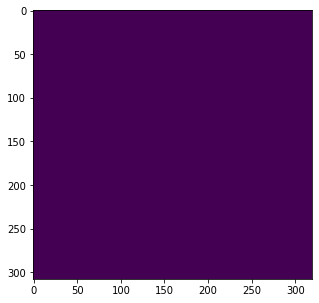

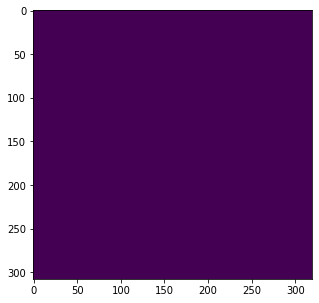

 --- --- --- img itself --- --- --- 


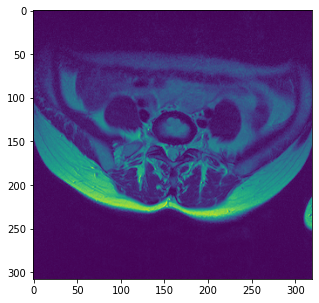

------------------------------------------------------------------------------------------

05912.PNG
infiles:  /home/natasha/unet/axial_data_new/test/First_3/pictures/05912.PNG
inmasks:  /home/natasha/unet/axial_data_new/test/First_3/masks/05912.npy
outputs:
torch.Size([1, 6, 308, 320])
torch.Size([1, 64, 308, 320])
torch.Size([1, 6, 600, 600])
torch.Size([1, 6, 600, 600])
torch.Size([1, 6, 600, 600])
torch.Size([1, 6, 600, 600])
torch.Size([1, 6, 600, 600])
full_output.shape: ...
10
output.shape: ...
torch.Size([1, 6, 308, 320])
mask.shape: ...
(6, 308, 320)
true_mask.shape: ...
(308, 320, 6)
uniques: ...
[0 1]
mask.shape: ...
(6, 308, 320)
 --- --- --- vis started --- --- --- 
 --- --- --- 1st --- --- --- 


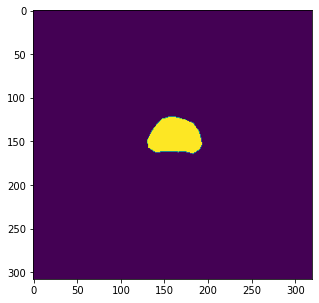

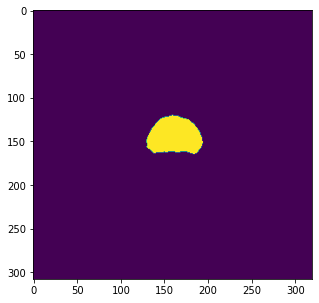

 --- --- --- 2nd --- --- --- 


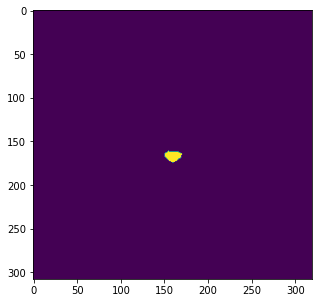

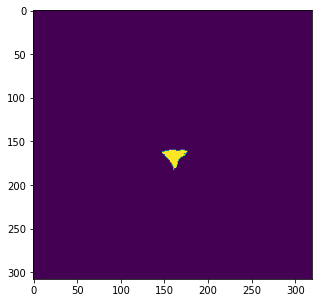

 --- --- --- 3rd --- --- --- 


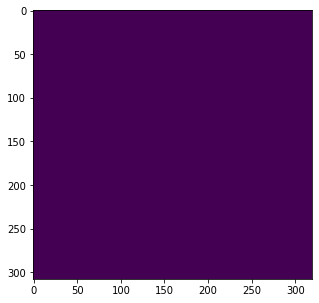

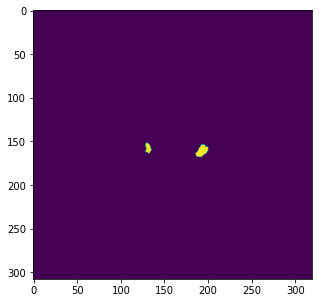

 --- --- --- 4th --- --- --- 


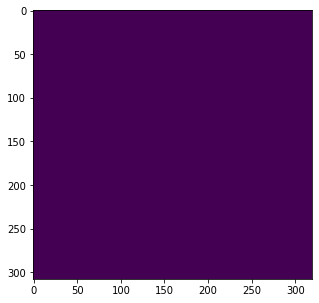

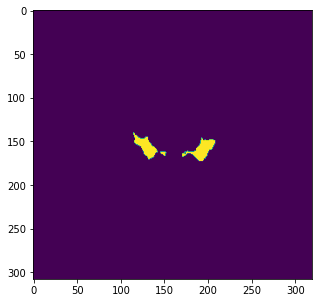

 --- --- --- 5th --- --- --- 


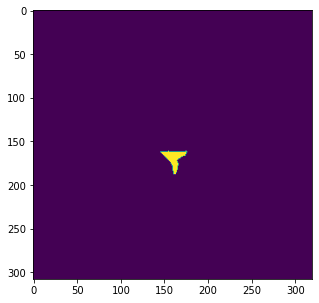

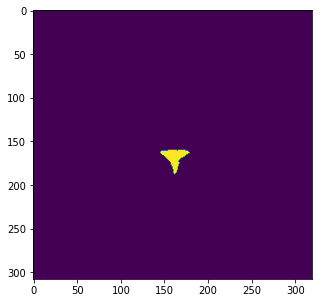

 --- --- --- 6th --- --- --- 


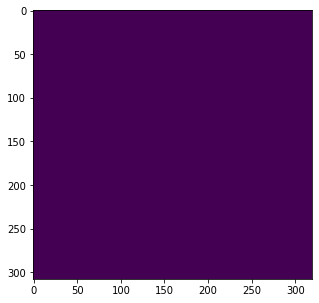

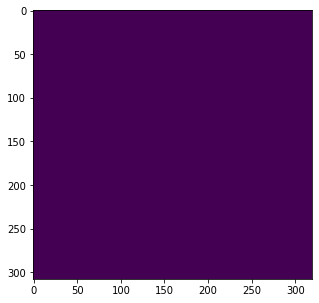

 --- --- --- img itself --- --- --- 


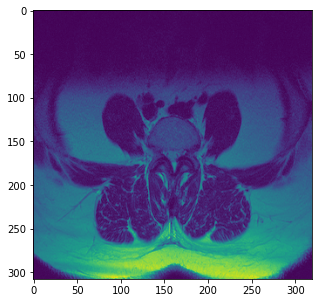

------------------------------------------------------------------------------------------

0077.PNG
infiles:  /home/natasha/unet/axial_data_new/test/First_3/pictures/0077.PNG
inmasks:  /home/natasha/unet/axial_data_new/test/First_3/masks/0077.npy
outputs:
torch.Size([1, 6, 308, 320])
torch.Size([1, 64, 308, 320])
torch.Size([1, 6, 600, 600])
torch.Size([1, 6, 600, 600])
torch.Size([1, 6, 600, 600])
torch.Size([1, 6, 600, 600])
torch.Size([1, 6, 600, 600])
full_output.shape: ...
10
output.shape: ...
torch.Size([1, 6, 308, 320])
mask.shape: ...
(6, 308, 320)
true_mask.shape: ...
(308, 320, 6)
uniques: ...
[0 1]
mask.shape: ...
(6, 308, 320)
 --- --- --- vis started --- --- --- 
 --- --- --- 1st --- --- --- 


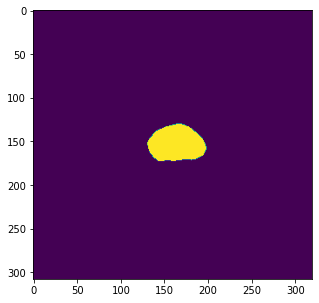

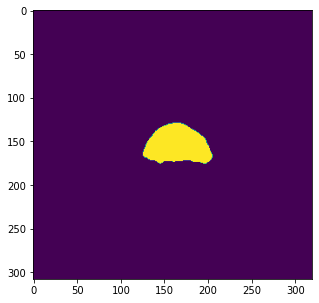

 --- --- --- 2nd --- --- --- 


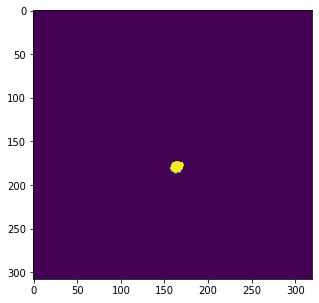

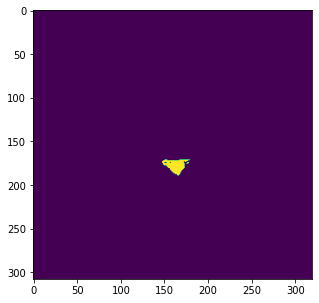

 --- --- --- 3rd --- --- --- 


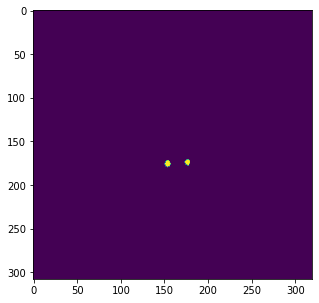

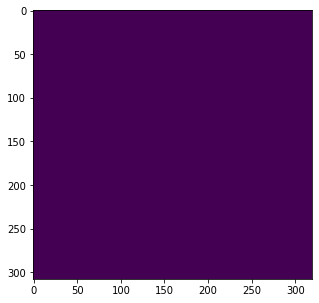

 --- --- --- 4th --- --- --- 


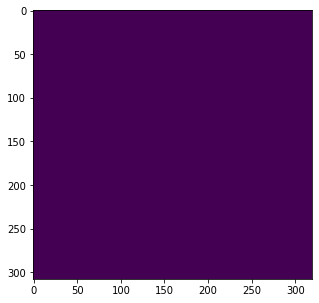

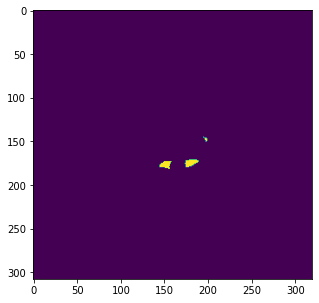

 --- --- --- 5th --- --- --- 


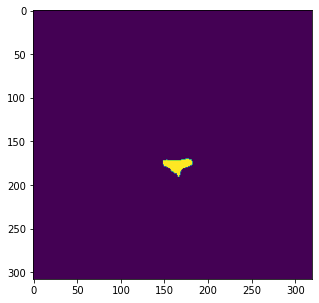

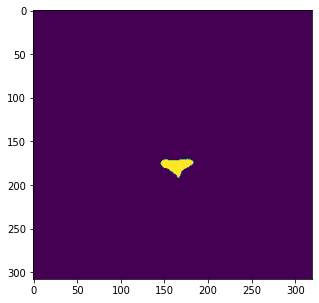

 --- --- --- 6th --- --- --- 


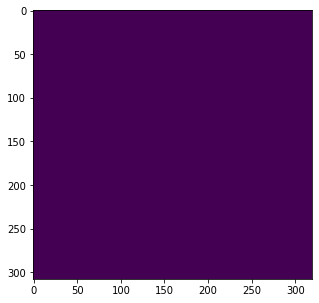

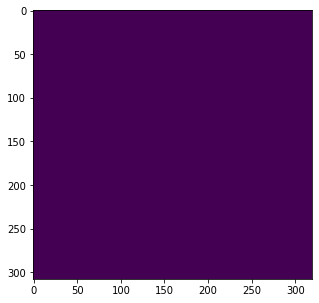

 --- --- --- img itself --- --- --- 


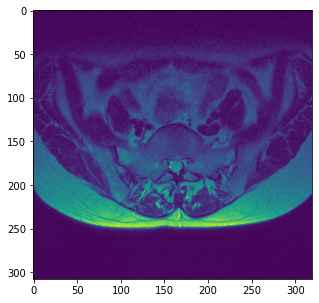

------------------------------------------------------------------------------------------

00085.PNG
infiles:  /home/natasha/unet/axial_data_new/test/First_3/pictures/00085.PNG
inmasks:  /home/natasha/unet/axial_data_new/test/First_3/masks/00085.npy
outputs:
torch.Size([1, 6, 308, 320])
torch.Size([1, 64, 308, 320])
torch.Size([1, 6, 600, 600])
torch.Size([1, 6, 600, 600])
torch.Size([1, 6, 600, 600])
torch.Size([1, 6, 600, 600])
torch.Size([1, 6, 600, 600])
full_output.shape: ...
10
output.shape: ...
torch.Size([1, 6, 308, 320])
mask.shape: ...
(6, 308, 320)
true_mask.shape: ...
(308, 320, 6)
uniques: ...
[0 1]
mask.shape: ...
(6, 308, 320)
 --- --- --- vis started --- --- --- 
 --- --- --- 1st --- --- --- 


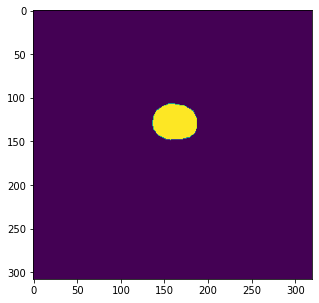

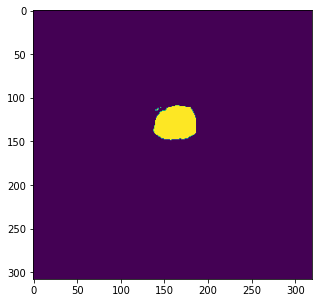

 --- --- --- 2nd --- --- --- 


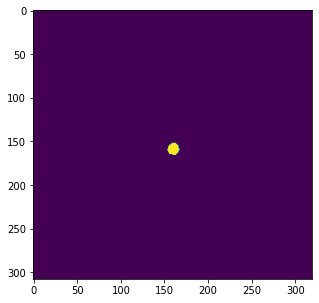

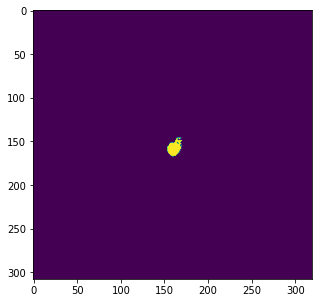

 --- --- --- 3rd --- --- --- 


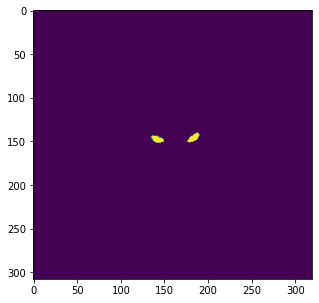

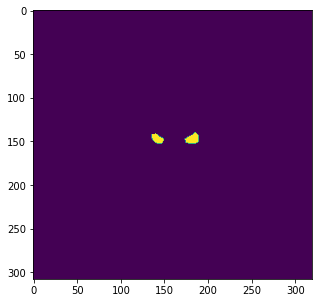

 --- --- --- 4th --- --- --- 


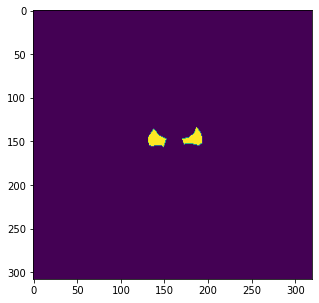

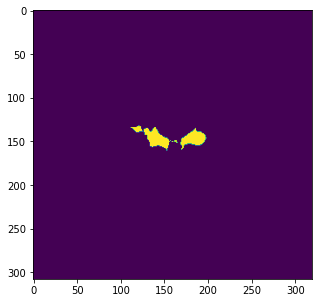

 --- --- --- 5th --- --- --- 


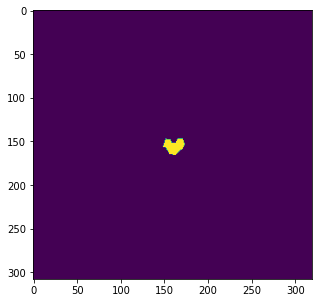

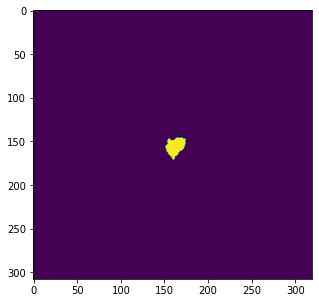

 --- --- --- 6th --- --- --- 


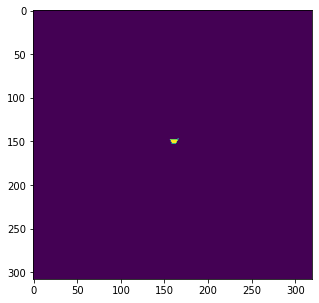

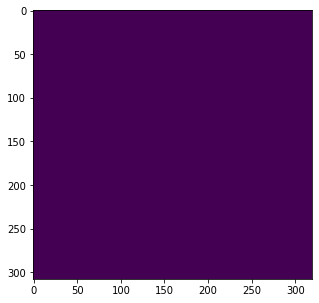

 --- --- --- img itself --- --- --- 


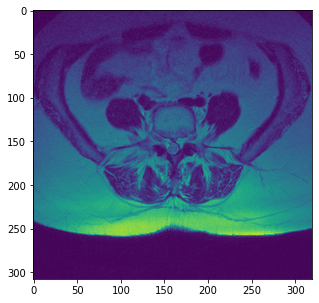

------------------------------------------------------------------------------------------

00093.PNG
infiles:  /home/natasha/unet/axial_data_new/test/First_3/pictures/00093.PNG
inmasks:  /home/natasha/unet/axial_data_new/test/First_3/masks/00093.npy
outputs:
torch.Size([1, 6, 308, 320])
torch.Size([1, 64, 308, 320])
torch.Size([1, 6, 600, 600])
torch.Size([1, 6, 600, 600])
torch.Size([1, 6, 600, 600])
torch.Size([1, 6, 600, 600])
torch.Size([1, 6, 600, 600])
full_output.shape: ...
10
output.shape: ...
torch.Size([1, 6, 308, 320])
mask.shape: ...
(6, 308, 320)
true_mask.shape: ...
(308, 320, 6)
uniques: ...
[0 1]
mask.shape: ...
(6, 308, 320)
 --- --- --- vis started --- --- --- 
 --- --- --- 1st --- --- --- 


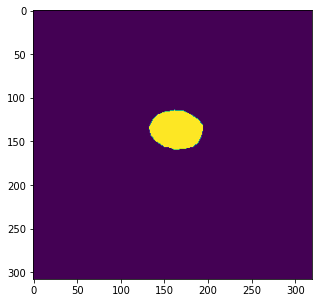

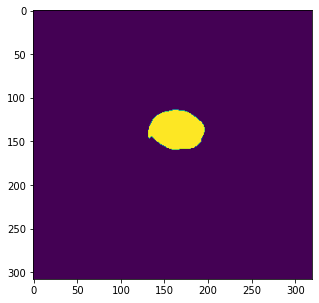

 --- --- --- 2nd --- --- --- 


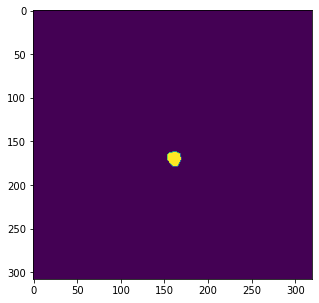

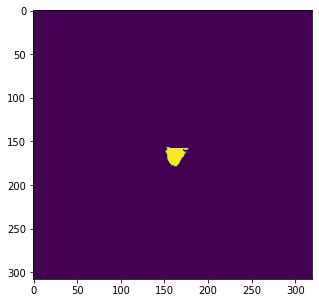

 --- --- --- 3rd --- --- --- 


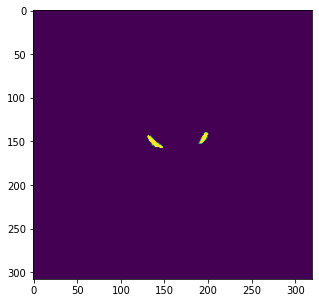

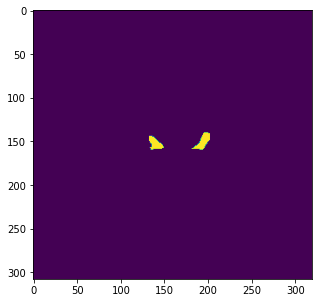

 --- --- --- 4th --- --- --- 


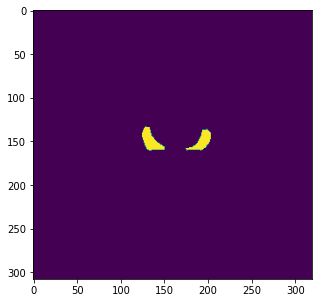

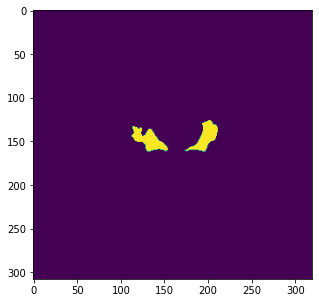

 --- --- --- 5th --- --- --- 


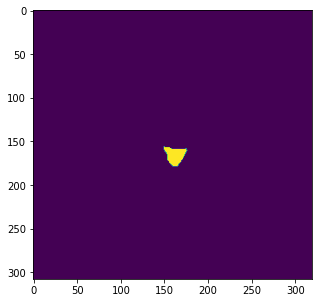

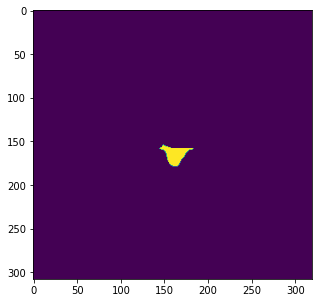

 --- --- --- 6th --- --- --- 


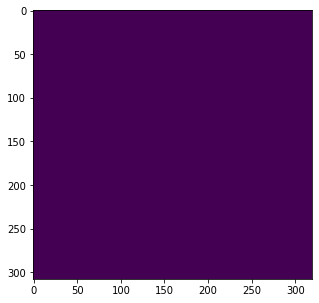

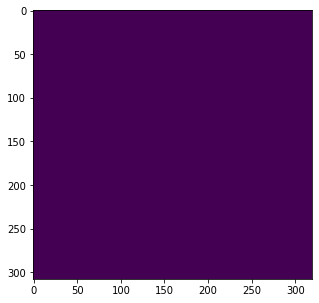

 --- --- --- img itself --- --- --- 


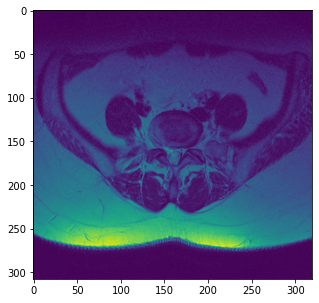

------------------------------------------------------------------------------------------

0094.PNG
infiles:  /home/natasha/unet/axial_data_new/test/First_3/pictures/0094.PNG
inmasks:  /home/natasha/unet/axial_data_new/test/First_3/masks/0094.npy
outputs:
torch.Size([1, 6, 308, 320])
torch.Size([1, 64, 308, 320])
torch.Size([1, 6, 600, 600])
torch.Size([1, 6, 600, 600])
torch.Size([1, 6, 600, 600])
torch.Size([1, 6, 600, 600])
torch.Size([1, 6, 600, 600])
full_output.shape: ...
10
output.shape: ...
torch.Size([1, 6, 308, 320])
mask.shape: ...
(6, 308, 320)
true_mask.shape: ...
(308, 320, 6)
uniques: ...
[0 1]
mask.shape: ...
(6, 308, 320)
 --- --- --- vis started --- --- --- 
 --- --- --- 1st --- --- --- 


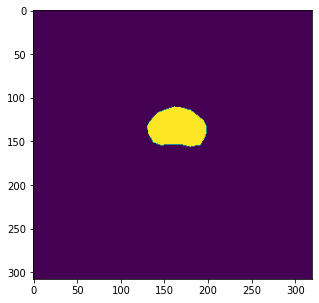

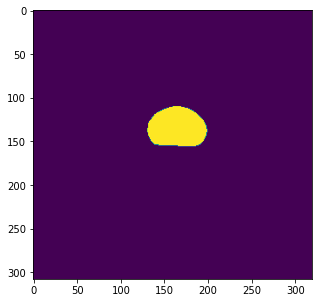

 --- --- --- 2nd --- --- --- 


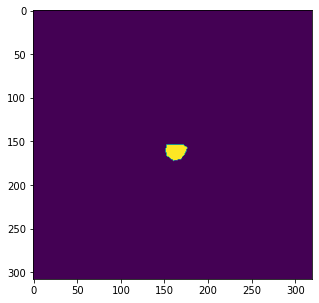

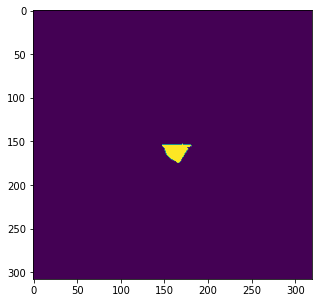

 --- --- --- 3rd --- --- --- 


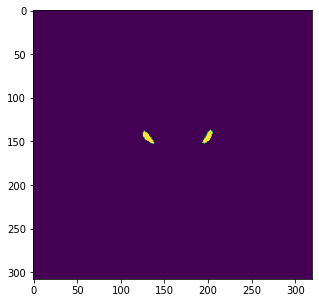

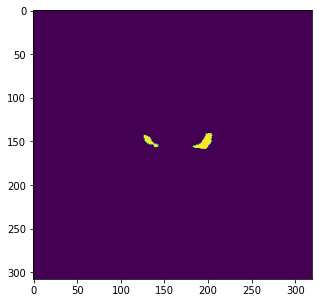

 --- --- --- 4th --- --- --- 


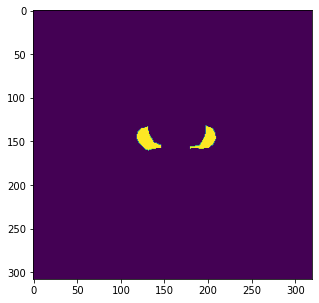

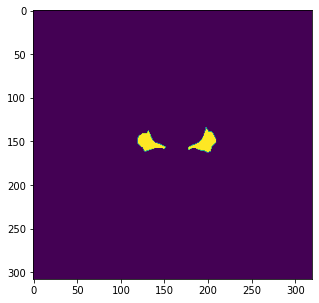

 --- --- --- 5th --- --- --- 


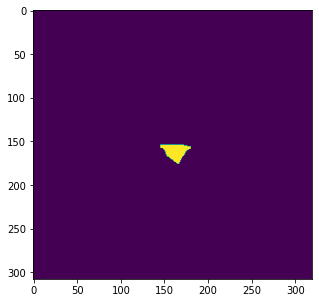

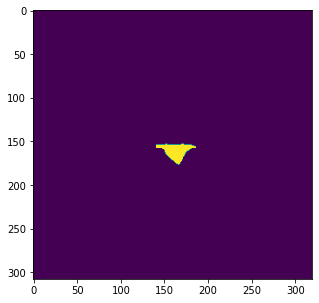

 --- --- --- 6th --- --- --- 


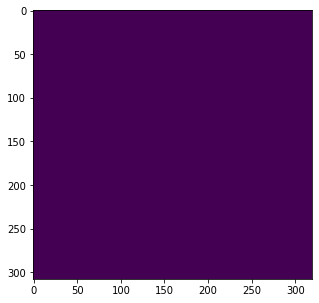

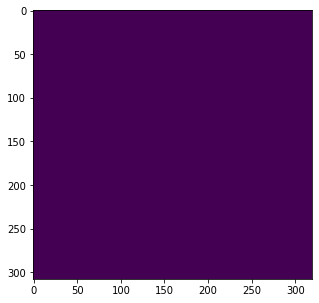

 --- --- --- img itself --- --- --- 


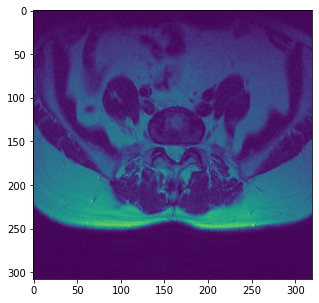

------------------------------------------------------------------------------------------

0119.PNG
infiles:  /home/natasha/unet/axial_data_new/test/First_3/pictures/0119.PNG
inmasks:  /home/natasha/unet/axial_data_new/test/First_3/masks/0119.npy
outputs:
torch.Size([1, 6, 308, 320])
torch.Size([1, 64, 308, 320])
torch.Size([1, 6, 600, 600])
torch.Size([1, 6, 600, 600])
torch.Size([1, 6, 600, 600])
torch.Size([1, 6, 600, 600])
torch.Size([1, 6, 600, 600])
full_output.shape: ...
10
output.shape: ...
torch.Size([1, 6, 308, 320])
mask.shape: ...
(6, 308, 320)
true_mask.shape: ...
(308, 320, 6)
uniques: ...
[0 1]
mask.shape: ...
(6, 308, 320)
 --- --- --- vis started --- --- --- 
 --- --- --- 1st --- --- --- 


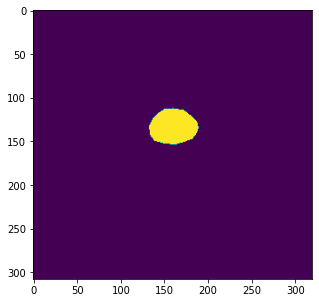

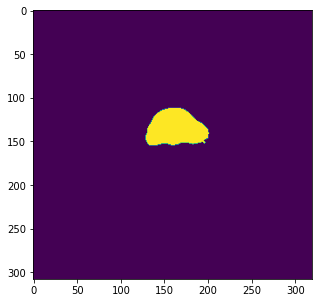

 --- --- --- 2nd --- --- --- 


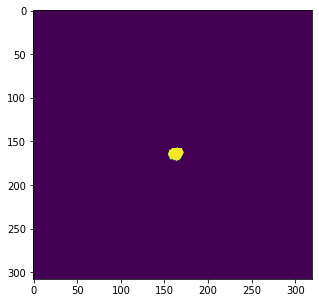

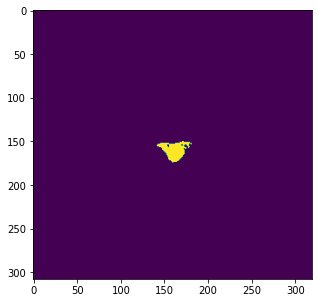

 --- --- --- 3rd --- --- --- 


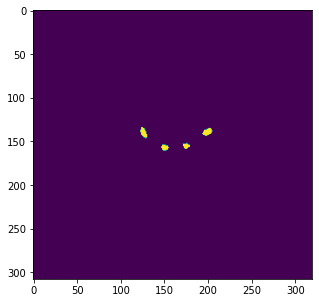

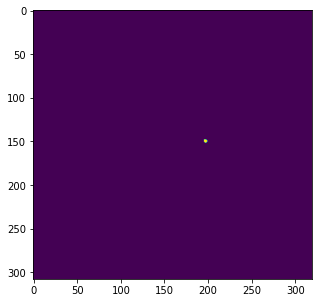

 --- --- --- 4th --- --- --- 


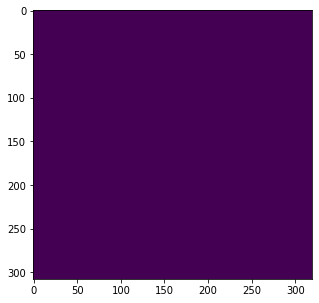

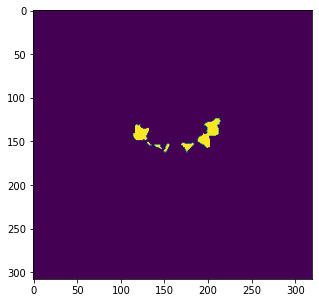

 --- --- --- 5th --- --- --- 


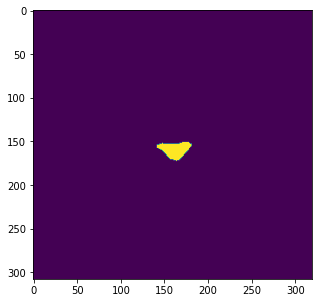

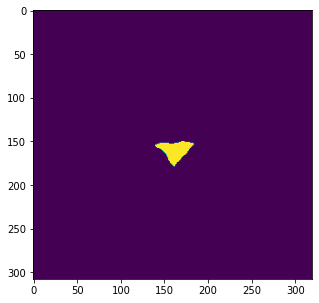

 --- --- --- 6th --- --- --- 


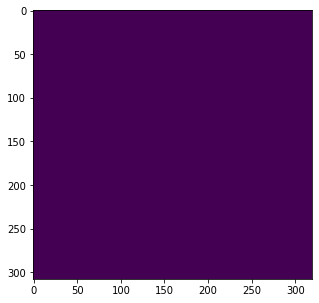

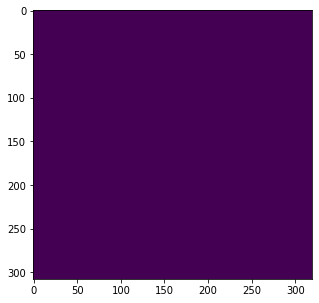

 --- --- --- img itself --- --- --- 


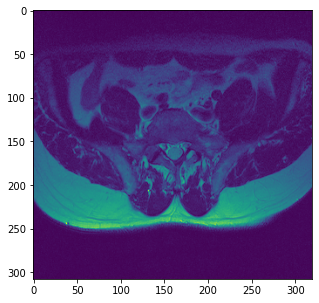

------------------------------------------------------------------------------------------

05833.PNG
infiles:  /home/natasha/unet/axial_data_new/test/First_3/pictures/05833.PNG
inmasks:  /home/natasha/unet/axial_data_new/test/First_3/masks/05833.npy
outputs:
torch.Size([1, 6, 308, 320])
torch.Size([1, 64, 308, 320])
torch.Size([1, 6, 600, 600])
torch.Size([1, 6, 600, 600])
torch.Size([1, 6, 600, 600])
torch.Size([1, 6, 600, 600])
torch.Size([1, 6, 600, 600])
full_output.shape: ...
10
output.shape: ...
torch.Size([1, 6, 308, 320])
mask.shape: ...
(6, 308, 320)
true_mask.shape: ...
(308, 320, 6)
uniques: ...
[0 1]
mask.shape: ...
(6, 308, 320)
 --- --- --- vis started --- --- --- 
 --- --- --- 1st --- --- --- 


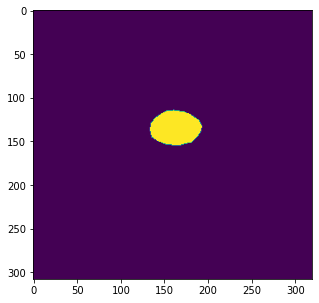

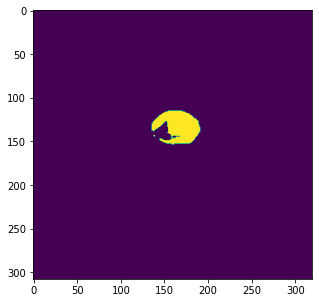

 --- --- --- 2nd --- --- --- 


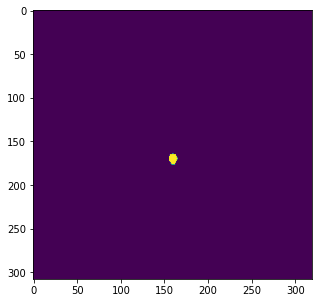

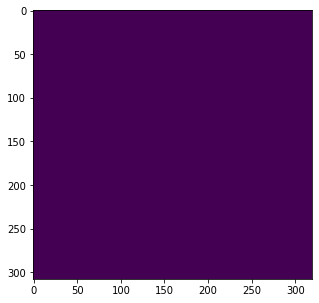

 --- --- --- 3rd --- --- --- 


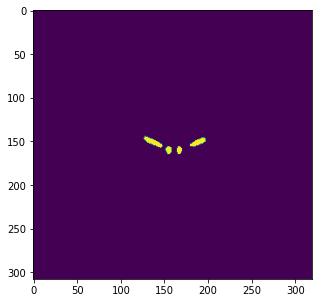

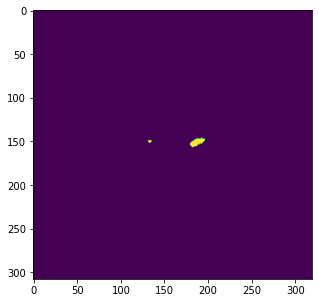

 --- --- --- 4th --- --- --- 


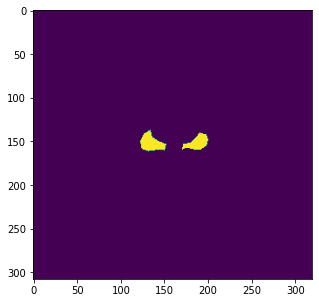

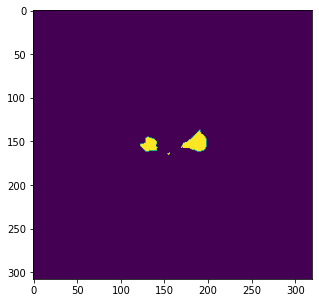

 --- --- --- 5th --- --- --- 


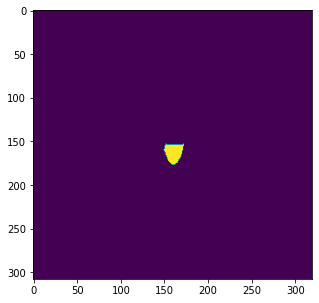

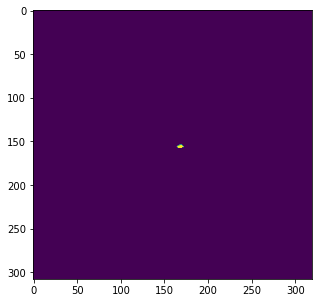

 --- --- --- 6th --- --- --- 


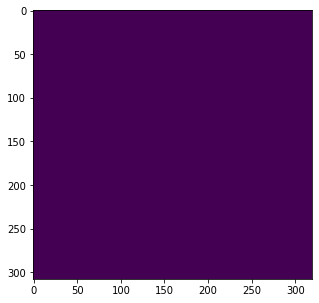

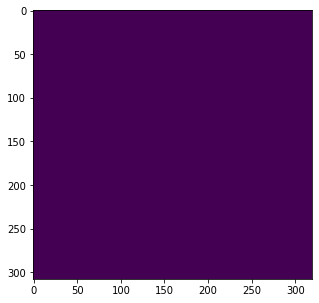

 --- --- --- img itself --- --- --- 


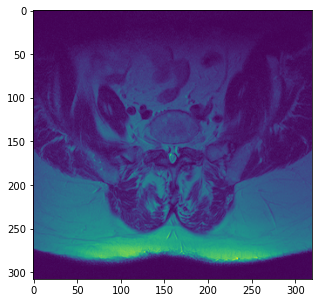

------------------------------------------------------------------------------------------

05828.PNG
infiles:  /home/natasha/unet/axial_data_new/test/First_3/pictures/05828.PNG
inmasks:  /home/natasha/unet/axial_data_new/test/First_3/masks/05828.npy
outputs:
torch.Size([1, 6, 308, 320])
torch.Size([1, 64, 308, 320])
torch.Size([1, 6, 600, 600])
torch.Size([1, 6, 600, 600])
torch.Size([1, 6, 600, 600])
torch.Size([1, 6, 600, 600])
torch.Size([1, 6, 600, 600])
full_output.shape: ...
10
output.shape: ...
torch.Size([1, 6, 308, 320])
mask.shape: ...
(6, 308, 320)
true_mask.shape: ...
(308, 320, 6)
uniques: ...
[0 1]
mask.shape: ...
(6, 308, 320)
 --- --- --- vis started --- --- --- 
 --- --- --- 1st --- --- --- 


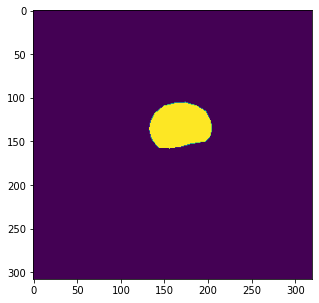

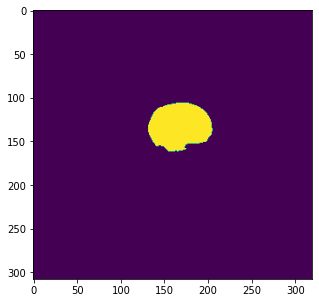

 --- --- --- 2nd --- --- --- 


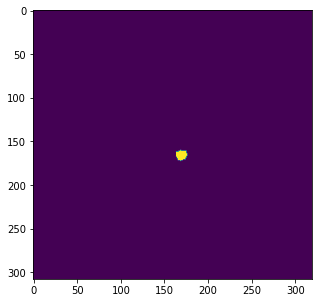

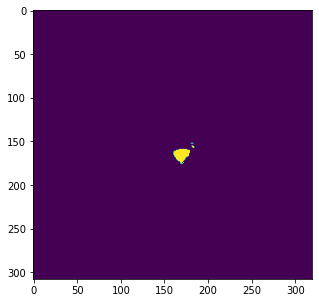

 --- --- --- 3rd --- --- --- 


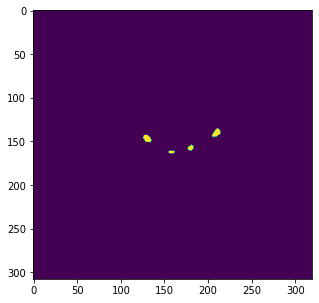

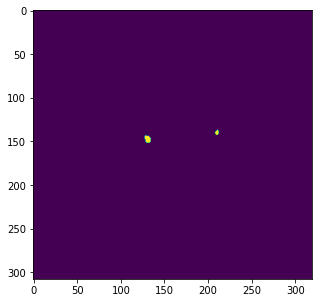

 --- --- --- 4th --- --- --- 


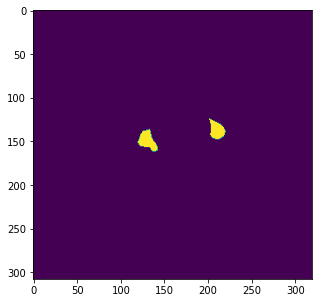

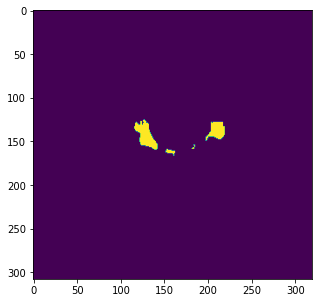

 --- --- --- 5th --- --- --- 


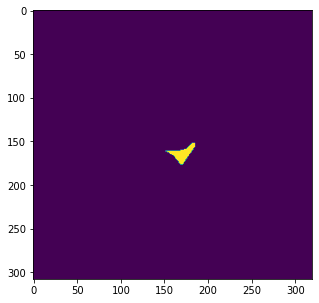

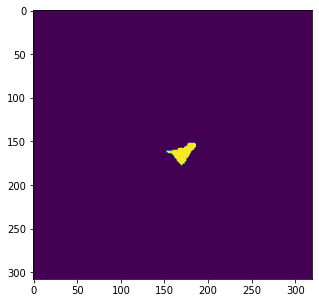

 --- --- --- 6th --- --- --- 


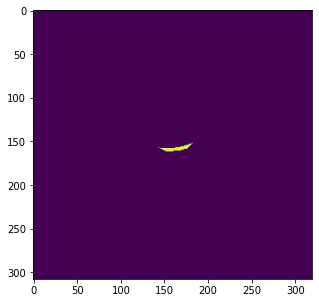

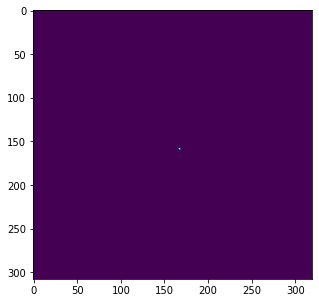

 --- --- --- img itself --- --- --- 


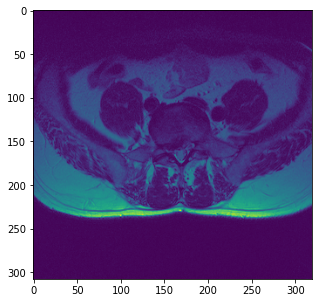

------------------------------------------------------------------------------------------

05804.PNG
infiles:  /home/natasha/unet/axial_data_new/test/First_3/pictures/05804.PNG
inmasks:  /home/natasha/unet/axial_data_new/test/First_3/masks/05804.npy
outputs:
torch.Size([1, 6, 308, 320])
torch.Size([1, 64, 308, 320])
torch.Size([1, 6, 600, 600])
torch.Size([1, 6, 600, 600])
torch.Size([1, 6, 600, 600])
torch.Size([1, 6, 600, 600])
torch.Size([1, 6, 600, 600])
full_output.shape: ...
10
output.shape: ...
torch.Size([1, 6, 308, 320])
mask.shape: ...
(6, 308, 320)
true_mask.shape: ...
(308, 320, 6)
uniques: ...
[0 1]
mask.shape: ...
(6, 308, 320)
 --- --- --- vis started --- --- --- 
 --- --- --- 1st --- --- --- 


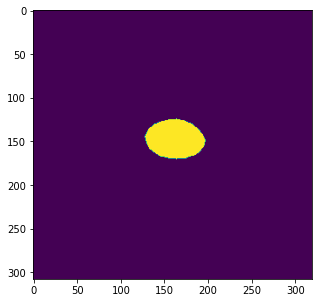

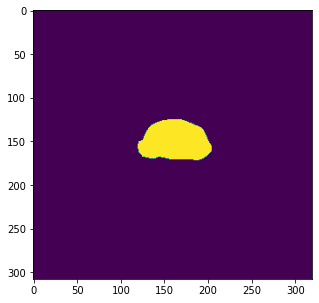

 --- --- --- 2nd --- --- --- 


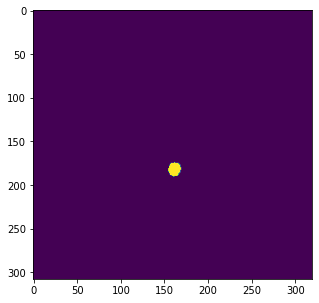

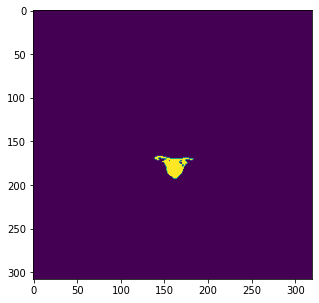

 --- --- --- 3rd --- --- --- 


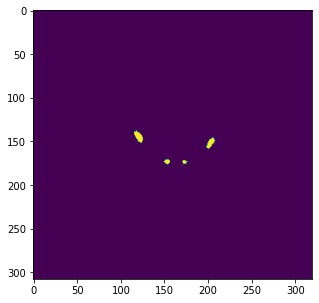

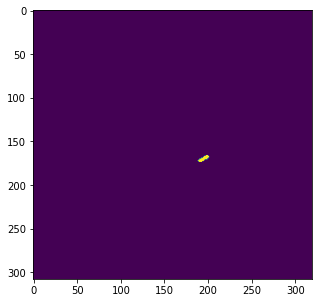

 --- --- --- 4th --- --- --- 


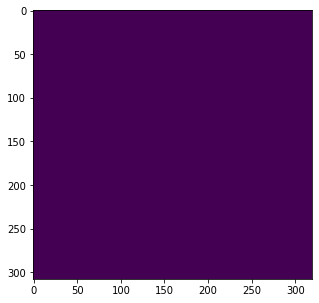

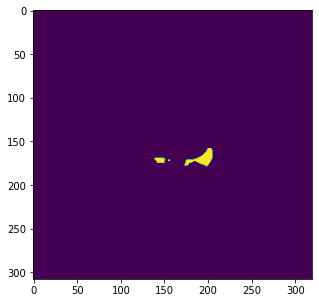

 --- --- --- 5th --- --- --- 


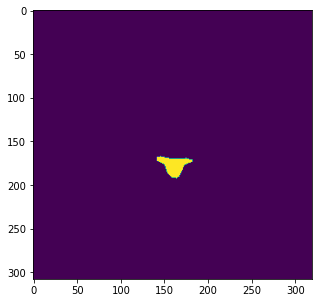

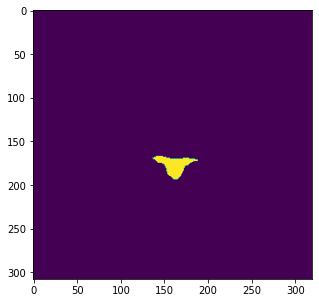

 --- --- --- 6th --- --- --- 


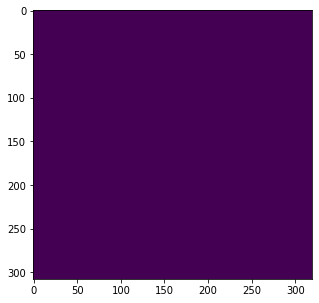

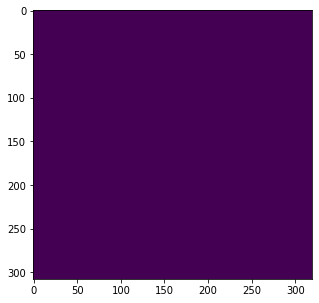

 --- --- --- img itself --- --- --- 


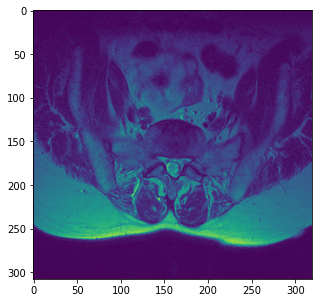

------------------------------------------------------------------------------------------

00106.PNG
infiles:  /home/natasha/unet/axial_data_new/test/First_3/pictures/00106.PNG
inmasks:  /home/natasha/unet/axial_data_new/test/First_3/masks/00106.npy
outputs:
torch.Size([1, 6, 308, 320])
torch.Size([1, 64, 308, 320])
torch.Size([1, 6, 600, 600])
torch.Size([1, 6, 600, 600])
torch.Size([1, 6, 600, 600])
torch.Size([1, 6, 600, 600])
torch.Size([1, 6, 600, 600])
full_output.shape: ...
10
output.shape: ...
torch.Size([1, 6, 308, 320])
mask.shape: ...
(6, 308, 320)
true_mask.shape: ...
(308, 320, 6)
uniques: ...
[0 1]
mask.shape: ...
(6, 308, 320)
 --- --- --- vis started --- --- --- 
 --- --- --- 1st --- --- --- 


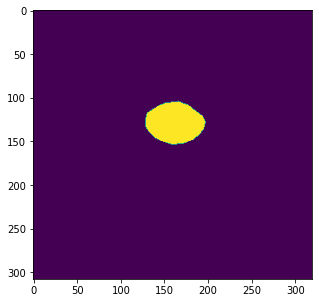

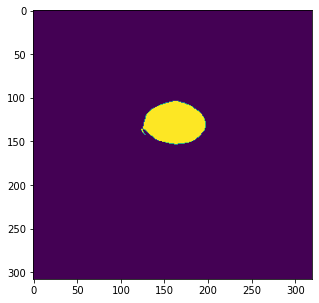

 --- --- --- 2nd --- --- --- 


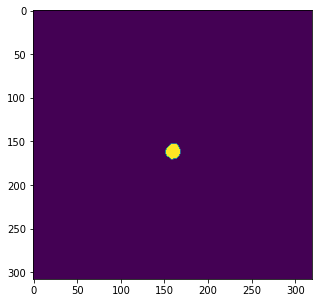

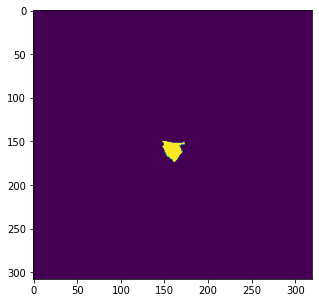

 --- --- --- 3rd --- --- --- 


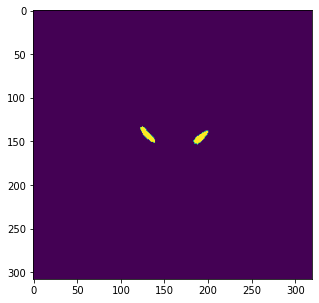

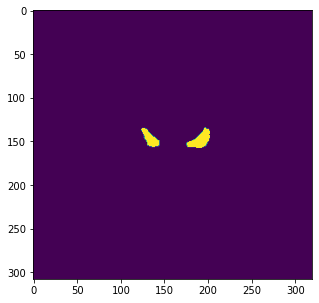

 --- --- --- 4th --- --- --- 


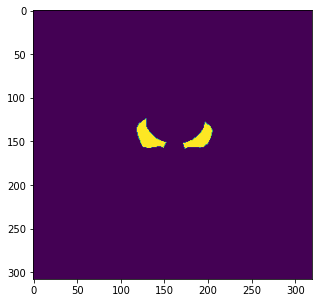

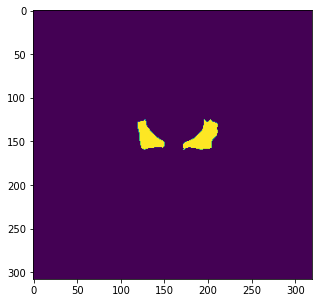

 --- --- --- 5th --- --- --- 


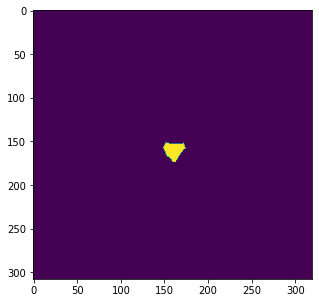

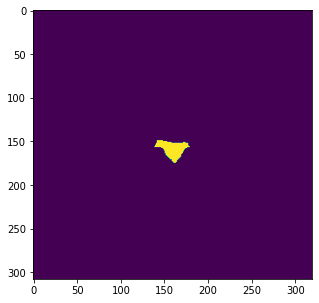

 --- --- --- 6th --- --- --- 


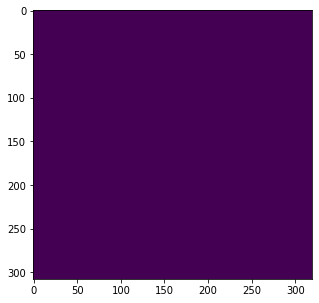

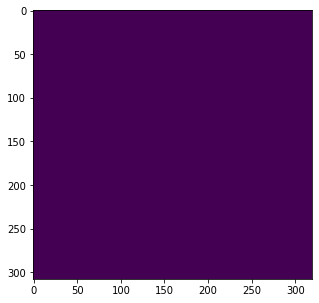

 --- --- --- img itself --- --- --- 


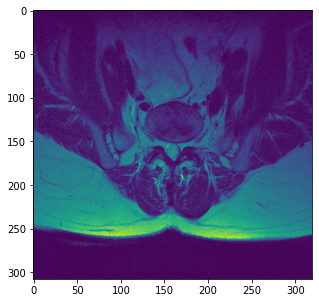

------------------------------------------------------------------------------------------

05780.PNG
infiles:  /home/natasha/unet/axial_data_new/test/First_3/pictures/05780.PNG
inmasks:  /home/natasha/unet/axial_data_new/test/First_3/masks/05780.npy
outputs:
torch.Size([1, 6, 308, 320])
torch.Size([1, 64, 308, 320])
torch.Size([1, 6, 600, 600])
torch.Size([1, 6, 600, 600])
torch.Size([1, 6, 600, 600])
torch.Size([1, 6, 600, 600])
torch.Size([1, 6, 600, 600])
full_output.shape: ...
10
output.shape: ...
torch.Size([1, 6, 308, 320])
mask.shape: ...
(6, 308, 320)
true_mask.shape: ...
(308, 320, 6)
uniques: ...
[0 1]
mask.shape: ...
(6, 308, 320)
 --- --- --- vis started --- --- --- 
 --- --- --- 1st --- --- --- 


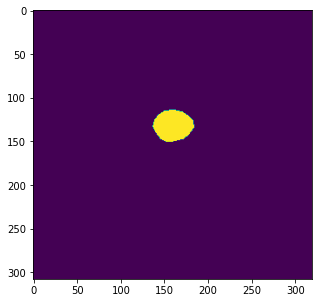

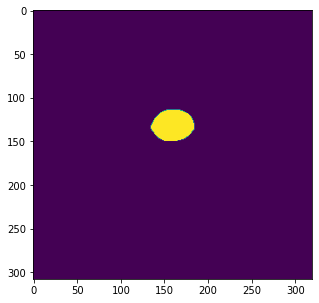

 --- --- --- 2nd --- --- --- 


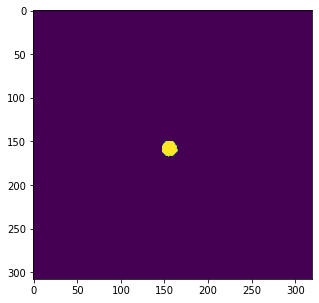

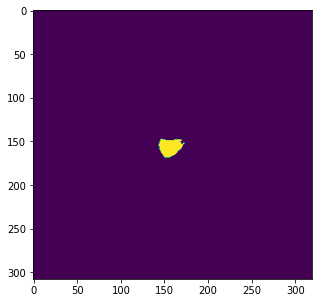

 --- --- --- 3rd --- --- --- 


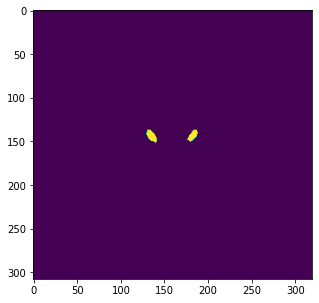

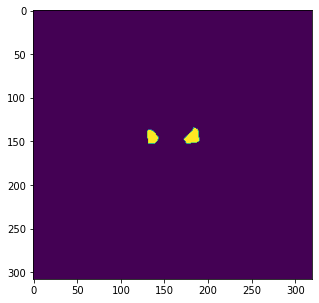

 --- --- --- 4th --- --- --- 


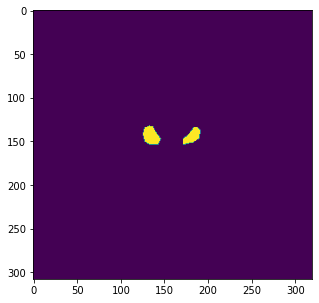

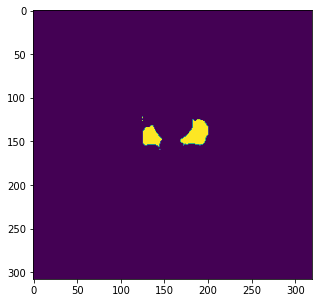

 --- --- --- 5th --- --- --- 


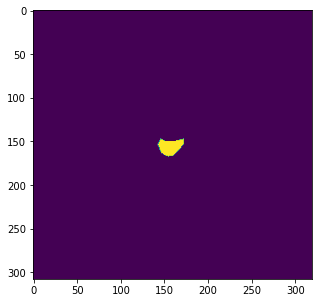

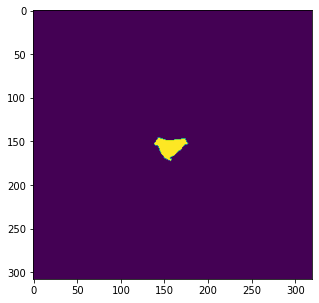

 --- --- --- 6th --- --- --- 


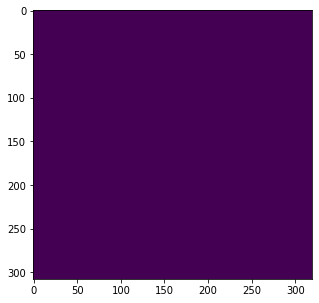

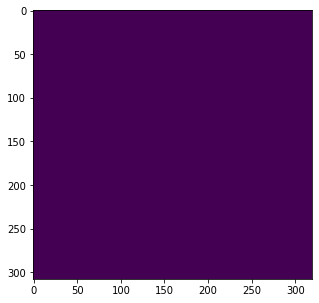

 --- --- --- img itself --- --- --- 


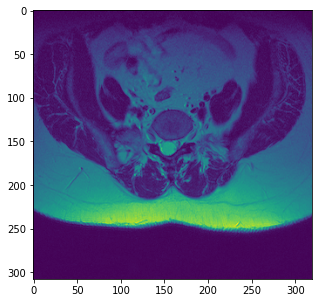

------------------------------------------------------------------------------------------

0089.PNG
infiles:  /home/natasha/unet/axial_data_new/test/First_3/pictures/0089.PNG
inmasks:  /home/natasha/unet/axial_data_new/test/First_3/masks/0089.npy
outputs:
torch.Size([1, 6, 308, 320])
torch.Size([1, 64, 308, 320])
torch.Size([1, 6, 600, 600])
torch.Size([1, 6, 600, 600])
torch.Size([1, 6, 600, 600])
torch.Size([1, 6, 600, 600])
torch.Size([1, 6, 600, 600])
full_output.shape: ...
10
output.shape: ...
torch.Size([1, 6, 308, 320])
mask.shape: ...
(6, 308, 320)
true_mask.shape: ...
(308, 320, 6)
uniques: ...
[0 1]
mask.shape: ...
(6, 308, 320)
 --- --- --- vis started --- --- --- 
 --- --- --- 1st --- --- --- 


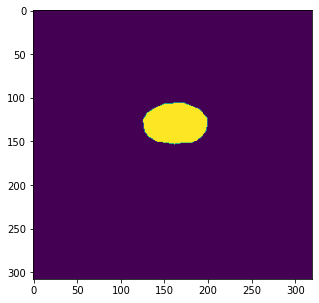

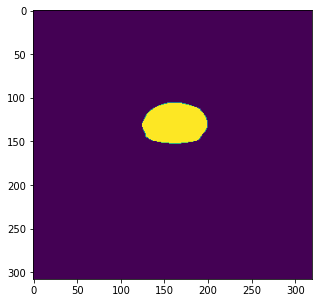

 --- --- --- 2nd --- --- --- 


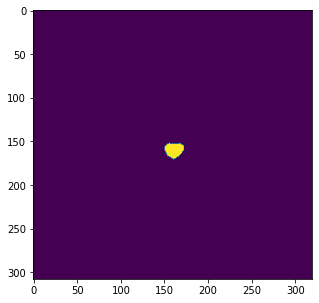

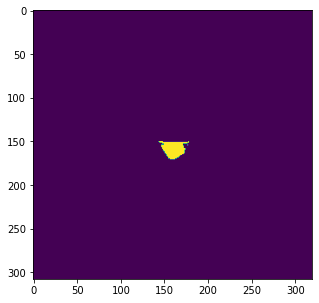

 --- --- --- 3rd --- --- --- 


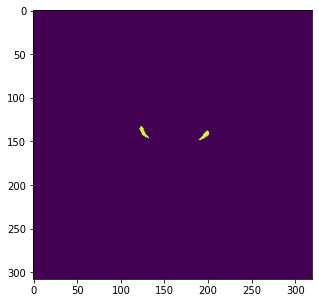

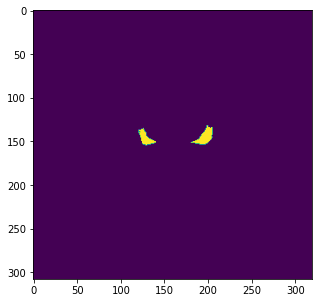

 --- --- --- 4th --- --- --- 


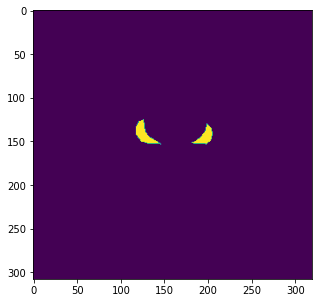

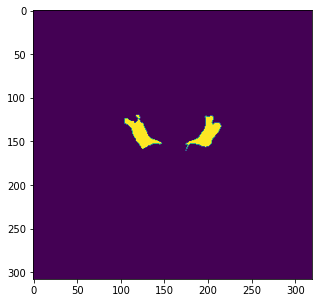

 --- --- --- 5th --- --- --- 


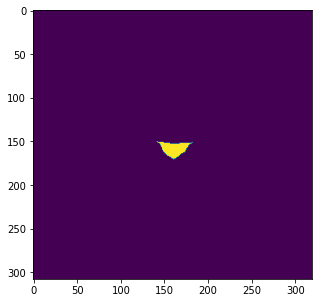

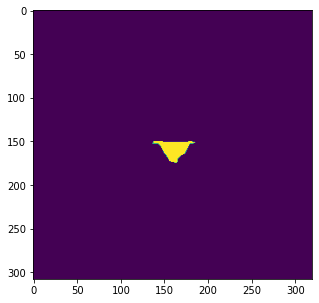

 --- --- --- 6th --- --- --- 


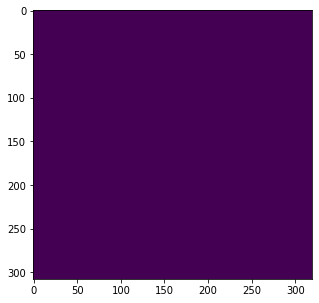

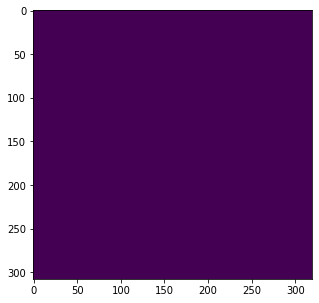

 --- --- --- img itself --- --- --- 


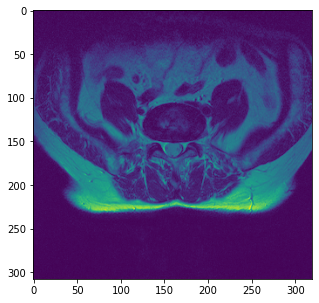

------------------------------------------------------------------------------------------

00112.PNG
infiles:  /home/natasha/unet/axial_data_new/test/First_3/pictures/00112.PNG
inmasks:  /home/natasha/unet/axial_data_new/test/First_3/masks/00112.npy
outputs:
torch.Size([1, 6, 308, 320])
torch.Size([1, 64, 308, 320])
torch.Size([1, 6, 600, 600])
torch.Size([1, 6, 600, 600])
torch.Size([1, 6, 600, 600])
torch.Size([1, 6, 600, 600])
torch.Size([1, 6, 600, 600])
full_output.shape: ...
10
output.shape: ...
torch.Size([1, 6, 308, 320])
mask.shape: ...
(6, 308, 320)
true_mask.shape: ...
(308, 320, 6)
uniques: ...
[0 1]
mask.shape: ...
(6, 308, 320)
 --- --- --- vis started --- --- --- 
 --- --- --- 1st --- --- --- 


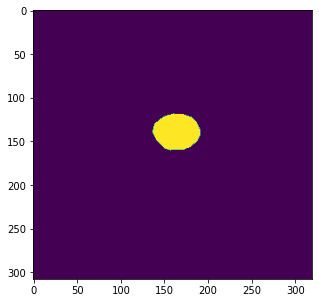

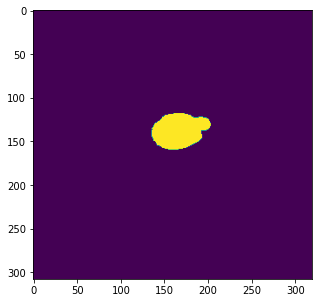

 --- --- --- 2nd --- --- --- 


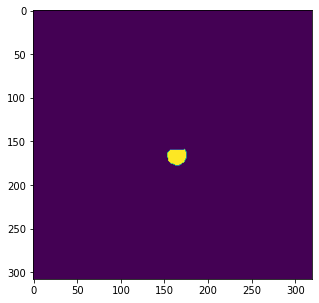

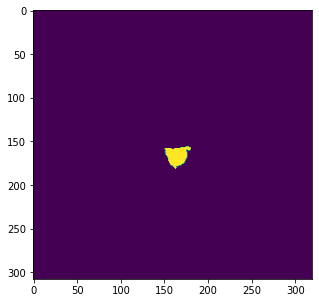

 --- --- --- 3rd --- --- --- 


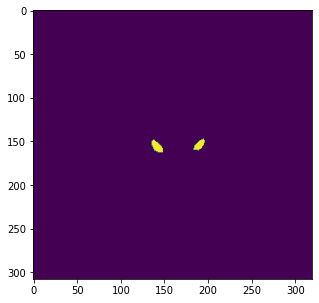

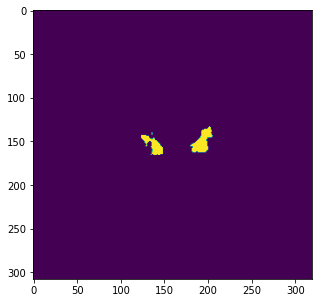

 --- --- --- 4th --- --- --- 


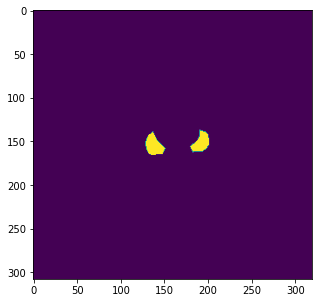

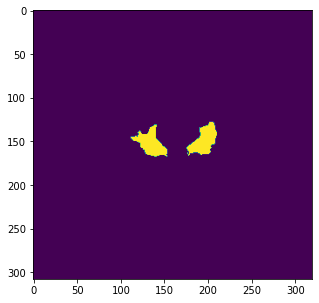

 --- --- --- 5th --- --- --- 


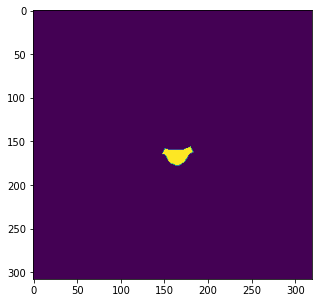

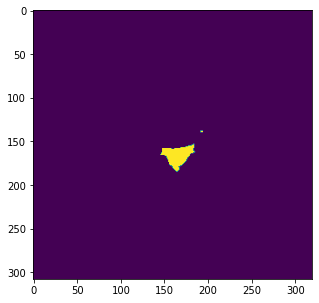

 --- --- --- 6th --- --- --- 


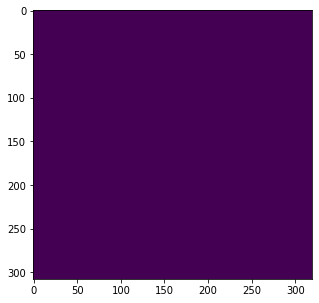

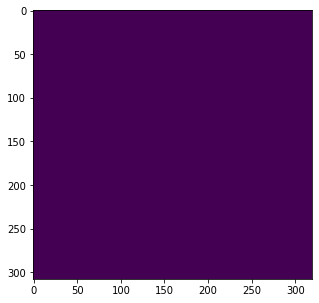

 --- --- --- img itself --- --- --- 


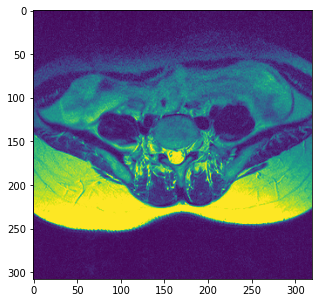

------------------------------------------------------------------------------------------

00121.PNG
infiles:  /home/natasha/unet/axial_data_new/test/First_3/pictures/00121.PNG
inmasks:  /home/natasha/unet/axial_data_new/test/First_3/masks/00121.npy
outputs:
torch.Size([1, 6, 308, 320])
torch.Size([1, 64, 308, 320])
torch.Size([1, 6, 600, 600])
torch.Size([1, 6, 600, 600])
torch.Size([1, 6, 600, 600])
torch.Size([1, 6, 600, 600])
torch.Size([1, 6, 600, 600])
full_output.shape: ...
10
output.shape: ...
torch.Size([1, 6, 308, 320])
mask.shape: ...
(6, 308, 320)
true_mask.shape: ...
(308, 320, 6)
uniques: ...
[0 1]
mask.shape: ...
(6, 308, 320)
 --- --- --- vis started --- --- --- 
 --- --- --- 1st --- --- --- 


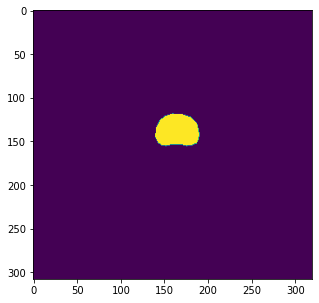

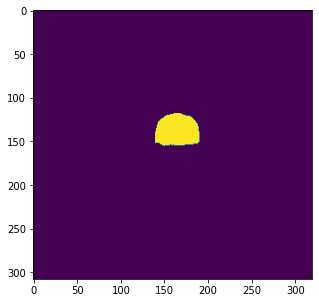

 --- --- --- 2nd --- --- --- 


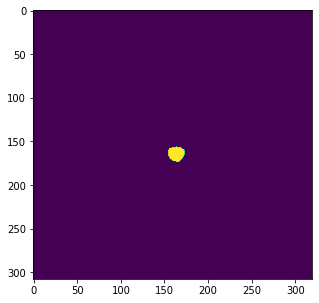

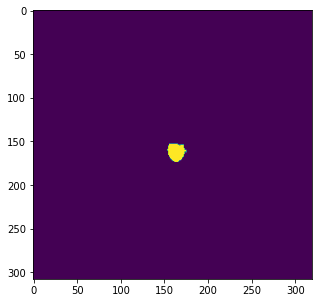

 --- --- --- 3rd --- --- --- 


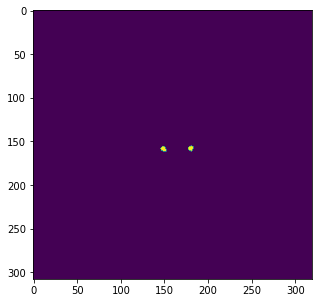

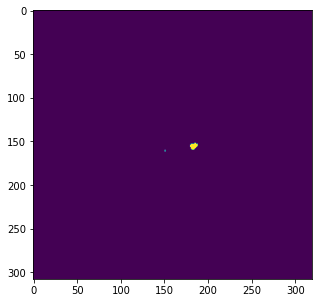

 --- --- --- 4th --- --- --- 


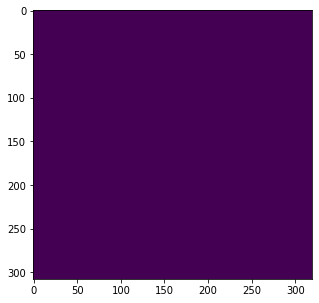

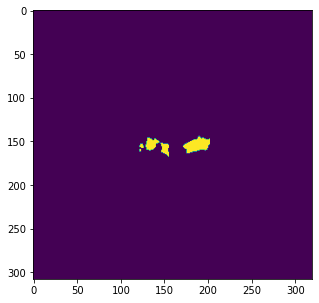

 --- --- --- 5th --- --- --- 


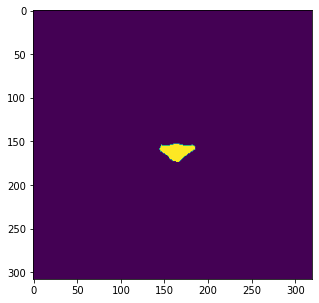

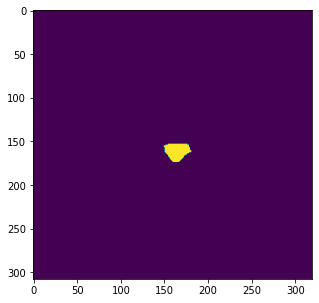

 --- --- --- 6th --- --- --- 


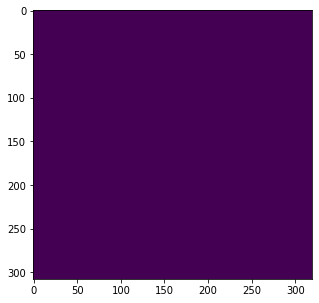

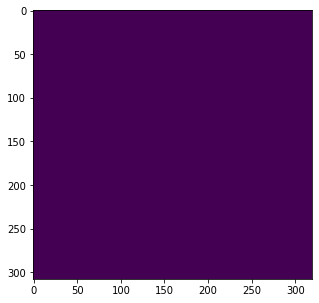

 --- --- --- img itself --- --- --- 


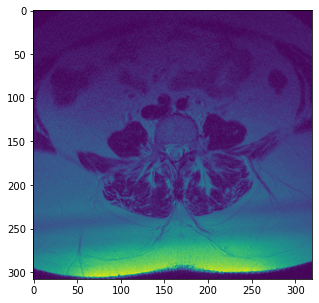

------------------------------------------------------------------------------------------

00108.PNG
infiles:  /home/natasha/unet/axial_data_new/test/First_3/pictures/00108.PNG
inmasks:  /home/natasha/unet/axial_data_new/test/First_3/masks/00108.npy
outputs:
torch.Size([1, 6, 308, 320])
torch.Size([1, 64, 308, 320])
torch.Size([1, 6, 600, 600])
torch.Size([1, 6, 600, 600])
torch.Size([1, 6, 600, 600])
torch.Size([1, 6, 600, 600])
torch.Size([1, 6, 600, 600])
full_output.shape: ...
10
output.shape: ...
torch.Size([1, 6, 308, 320])
mask.shape: ...
(6, 308, 320)
true_mask.shape: ...
(308, 320, 6)
uniques: ...
[0 1]
mask.shape: ...
(6, 308, 320)
 --- --- --- vis started --- --- --- 
 --- --- --- 1st --- --- --- 


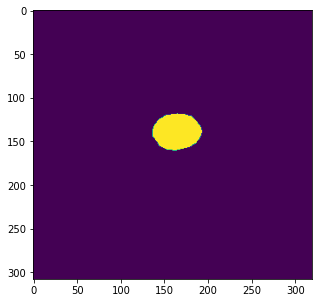

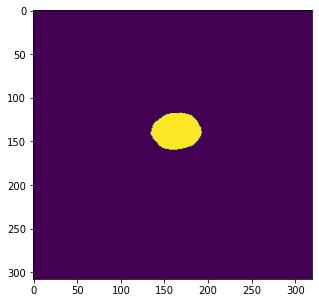

 --- --- --- 2nd --- --- --- 


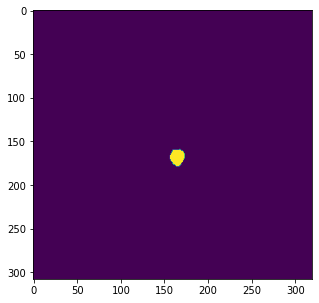

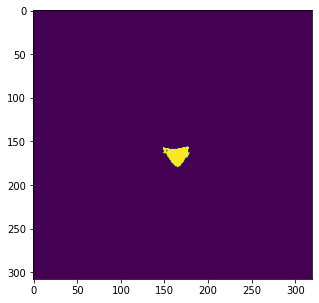

 --- --- --- 3rd --- --- --- 


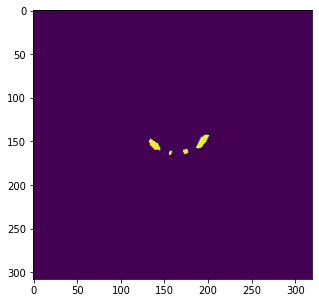

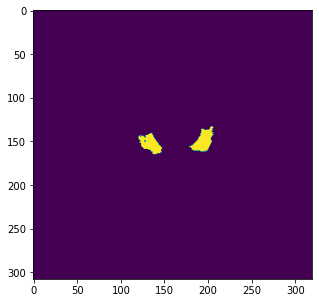

 --- --- --- 4th --- --- --- 


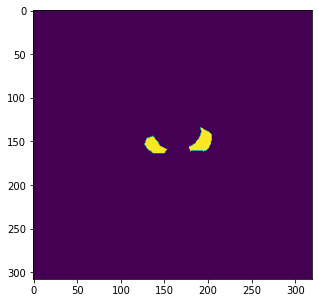

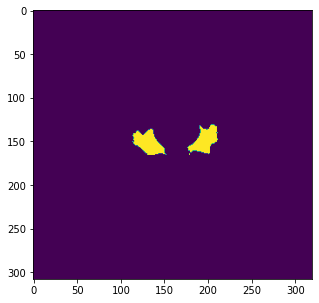

 --- --- --- 5th --- --- --- 


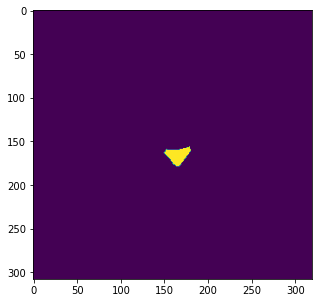

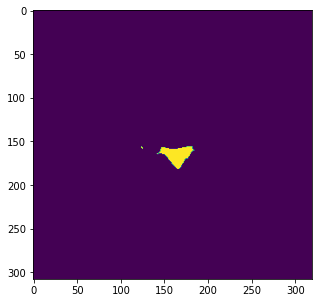

 --- --- --- 6th --- --- --- 


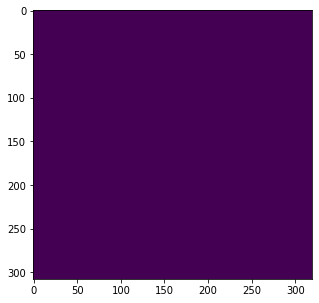

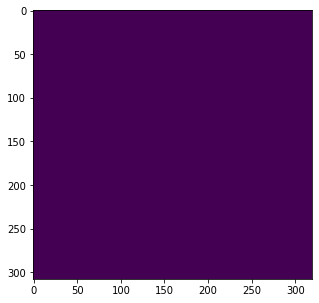

 --- --- --- img itself --- --- --- 


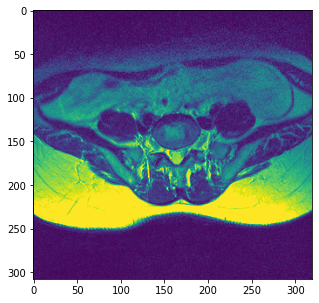

------------------------------------------------------------------------------------------

00117.PNG
infiles:  /home/natasha/unet/axial_data_new/test/First_3/pictures/00117.PNG
inmasks:  /home/natasha/unet/axial_data_new/test/First_3/masks/00117.npy
outputs:
torch.Size([1, 6, 308, 320])
torch.Size([1, 64, 308, 320])
torch.Size([1, 6, 600, 600])
torch.Size([1, 6, 600, 600])
torch.Size([1, 6, 600, 600])
torch.Size([1, 6, 600, 600])
torch.Size([1, 6, 600, 600])
full_output.shape: ...
10
output.shape: ...
torch.Size([1, 6, 308, 320])
mask.shape: ...
(6, 308, 320)
true_mask.shape: ...
(308, 320, 6)
uniques: ...
[0 1]
mask.shape: ...
(6, 308, 320)
 --- --- --- vis started --- --- --- 
 --- --- --- 1st --- --- --- 


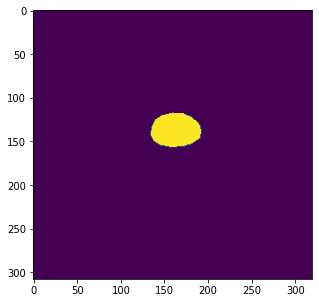

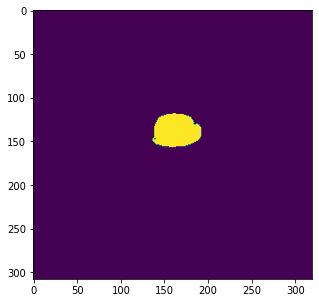

 --- --- --- 2nd --- --- --- 


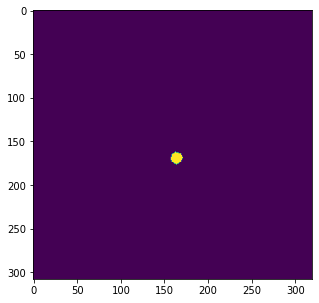

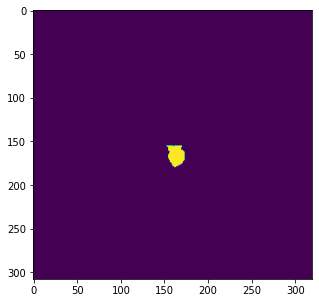

 --- --- --- 3rd --- --- --- 


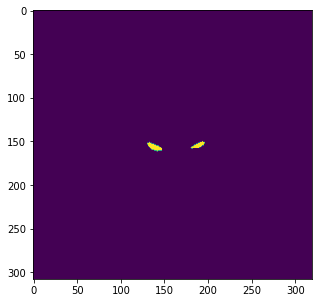

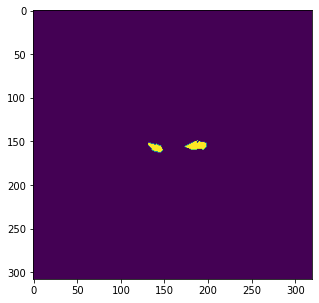

 --- --- --- 4th --- --- --- 


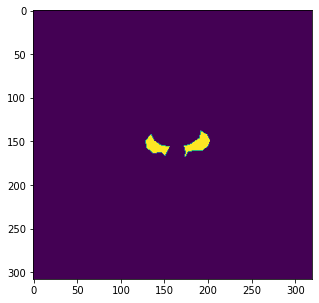

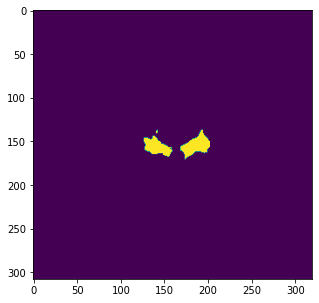

 --- --- --- 5th --- --- --- 


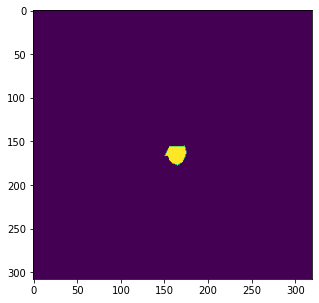

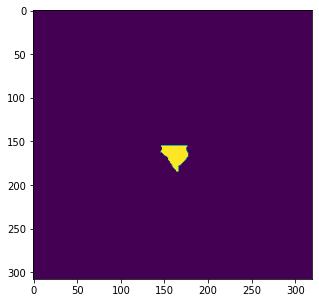

 --- --- --- 6th --- --- --- 


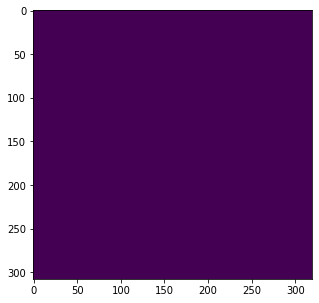

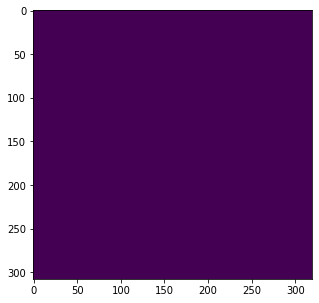

 --- --- --- img itself --- --- --- 


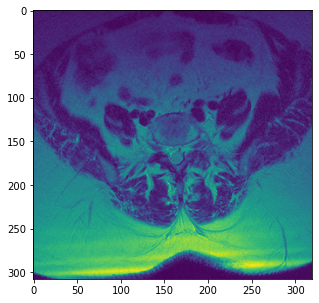

------------------------------------------------------------------------------------------

00124.PNG
infiles:  /home/natasha/unet/axial_data_new/test/First_3/pictures/00124.PNG
inmasks:  /home/natasha/unet/axial_data_new/test/First_3/masks/00124.npy
outputs:
torch.Size([1, 6, 308, 320])
torch.Size([1, 64, 308, 320])
torch.Size([1, 6, 600, 600])
torch.Size([1, 6, 600, 600])
torch.Size([1, 6, 600, 600])
torch.Size([1, 6, 600, 600])
torch.Size([1, 6, 600, 600])
full_output.shape: ...
10
output.shape: ...
torch.Size([1, 6, 308, 320])
mask.shape: ...
(6, 308, 320)
true_mask.shape: ...
(308, 320, 6)
uniques: ...
[0 1]
mask.shape: ...
(6, 308, 320)
 --- --- --- vis started --- --- --- 
 --- --- --- 1st --- --- --- 


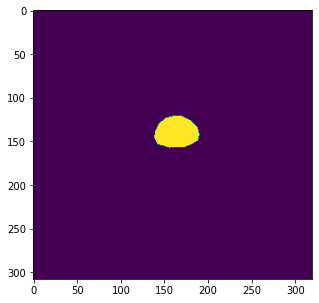

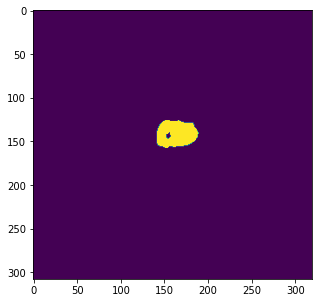

 --- --- --- 2nd --- --- --- 


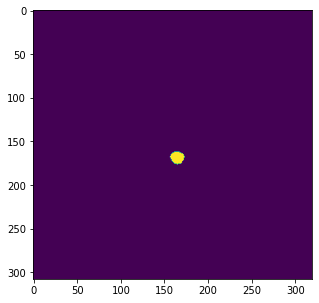

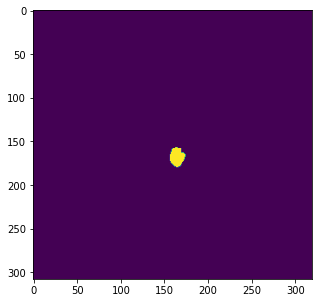

 --- --- --- 3rd --- --- --- 


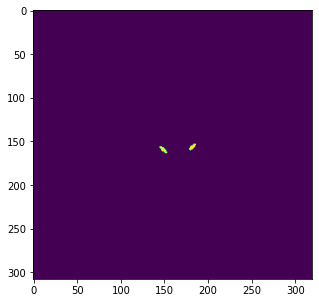

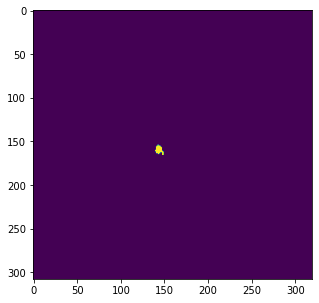

 --- --- --- 4th --- --- --- 


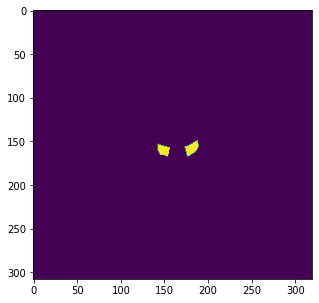

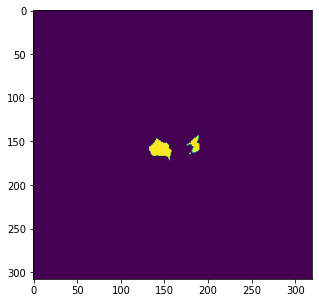

 --- --- --- 5th --- --- --- 


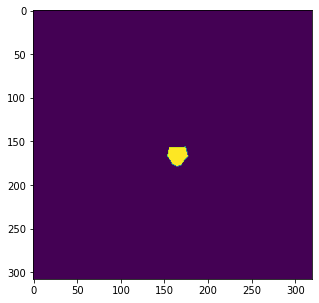

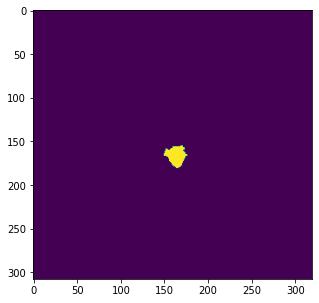

 --- --- --- 6th --- --- --- 


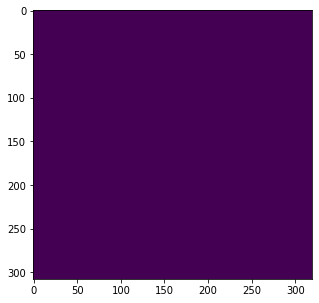

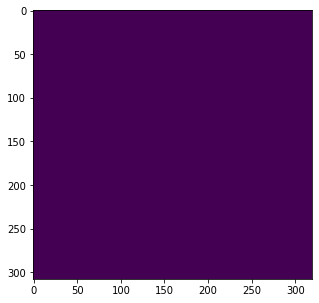

 --- --- --- img itself --- --- --- 


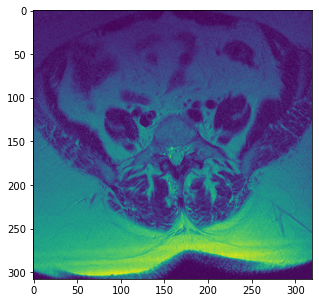

------------------------------------------------------------------------------------------

05801.PNG
infiles:  /home/natasha/unet/axial_data_new/test/First_3/pictures/05801.PNG
inmasks:  /home/natasha/unet/axial_data_new/test/First_3/masks/05801.npy
outputs:
torch.Size([1, 6, 308, 320])
torch.Size([1, 64, 308, 320])
torch.Size([1, 6, 600, 600])
torch.Size([1, 6, 600, 600])
torch.Size([1, 6, 600, 600])
torch.Size([1, 6, 600, 600])
torch.Size([1, 6, 600, 600])
full_output.shape: ...
10
output.shape: ...
torch.Size([1, 6, 308, 320])
mask.shape: ...
(6, 308, 320)
true_mask.shape: ...
(308, 320, 6)
uniques: ...
[0 1]
mask.shape: ...
(6, 308, 320)
 --- --- --- vis started --- --- --- 
 --- --- --- 1st --- --- --- 


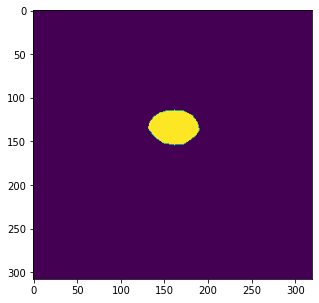

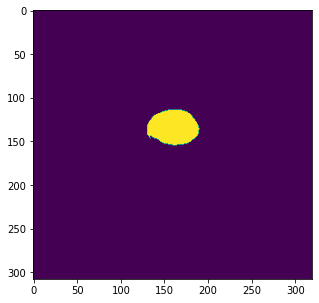

 --- --- --- 2nd --- --- --- 


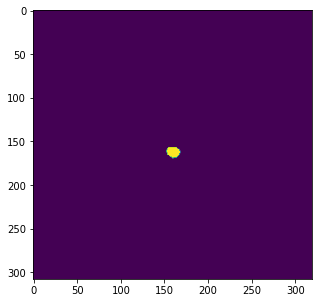

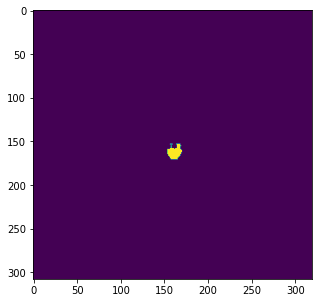

 --- --- --- 3rd --- --- --- 


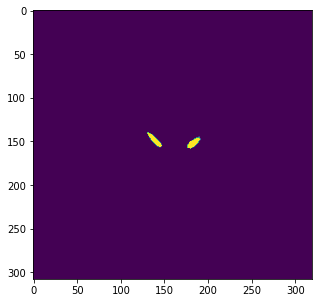

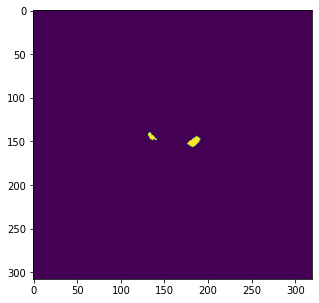

 --- --- --- 4th --- --- --- 


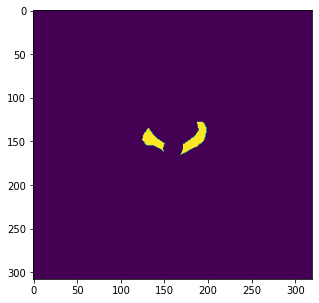

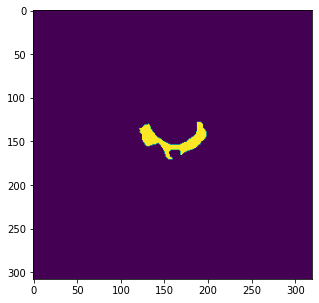

 --- --- --- 5th --- --- --- 


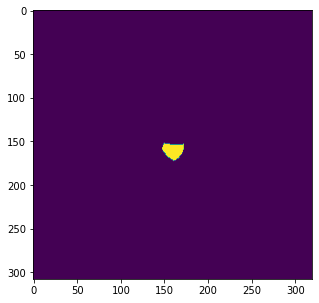

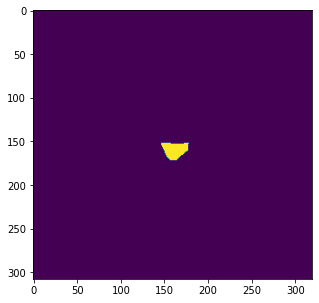

 --- --- --- 6th --- --- --- 


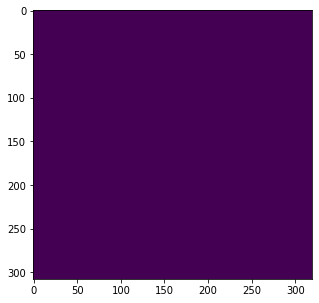

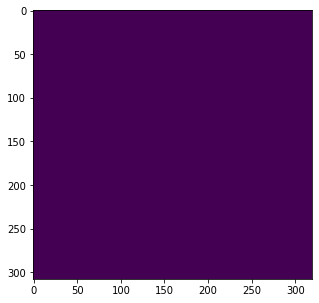

 --- --- --- img itself --- --- --- 


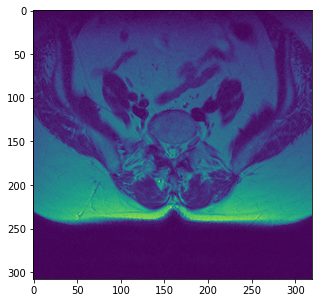

------------------------------------------------------------------------------------------

00087.PNG
infiles:  /home/natasha/unet/axial_data_new/test/First_3/pictures/00087.PNG
inmasks:  /home/natasha/unet/axial_data_new/test/First_3/masks/00087.npy
outputs:
torch.Size([1, 6, 308, 320])
torch.Size([1, 64, 308, 320])
torch.Size([1, 6, 600, 600])
torch.Size([1, 6, 600, 600])
torch.Size([1, 6, 600, 600])
torch.Size([1, 6, 600, 600])
torch.Size([1, 6, 600, 600])
full_output.shape: ...
10
output.shape: ...
torch.Size([1, 6, 308, 320])
mask.shape: ...
(6, 308, 320)
true_mask.shape: ...
(308, 320, 6)
uniques: ...
[0 1]
mask.shape: ...
(6, 308, 320)
 --- --- --- vis started --- --- --- 
 --- --- --- 1st --- --- --- 


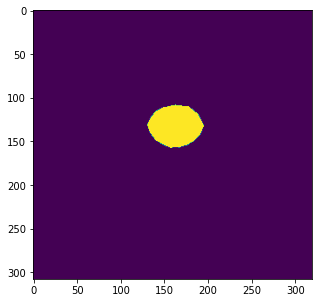

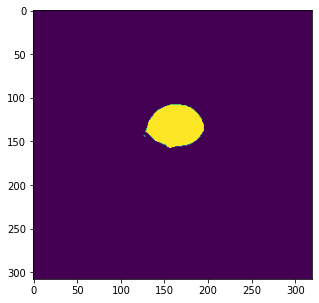

 --- --- --- 2nd --- --- --- 


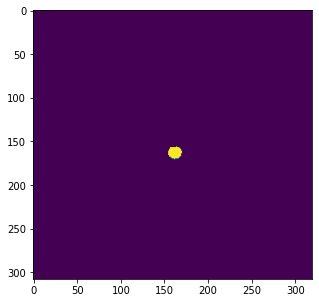

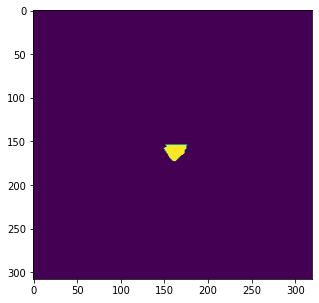

 --- --- --- 3rd --- --- --- 


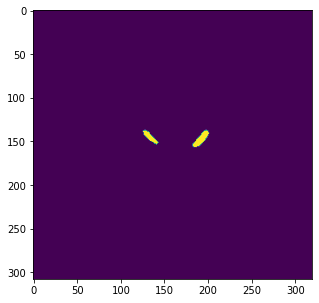

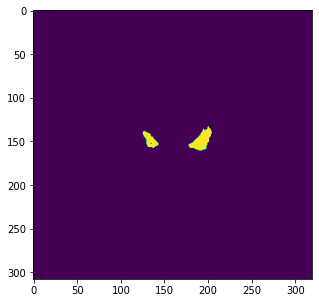

 --- --- --- 4th --- --- --- 


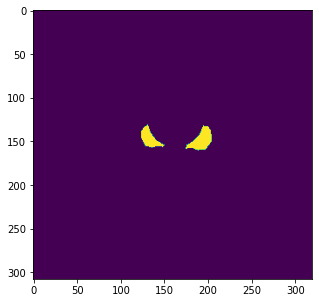

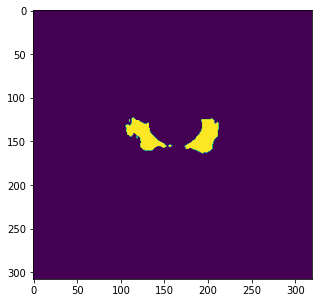

 --- --- --- 5th --- --- --- 


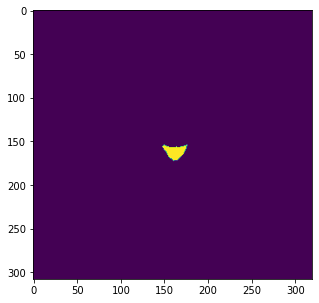

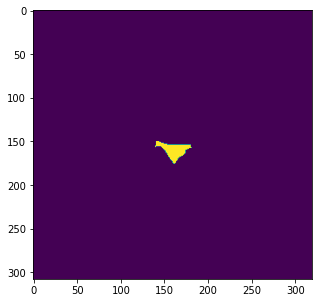

 --- --- --- 6th --- --- --- 


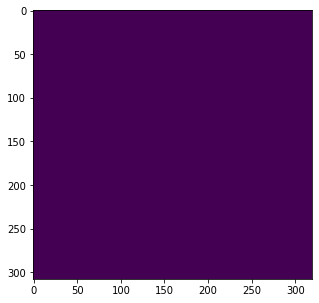

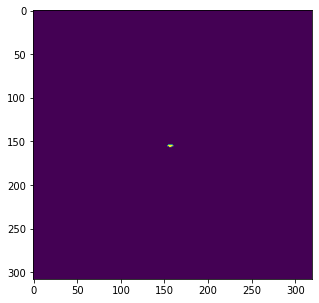

 --- --- --- img itself --- --- --- 


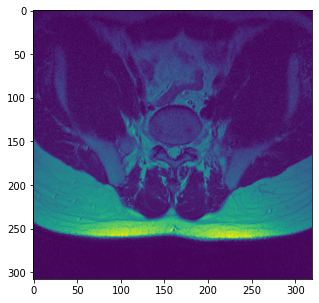

------------------------------------------------------------------------------------------



In [20]:
for i in range(50):
    
    choise = random.choice(infile_list)
    in_files = indirimg + choise
    in_masks = imdirmask + choise[:-3] + 'npy'
    print(choise)
    print('infiles: ', in_files)
    print('inmasks: ', in_masks)

    img = Image.open(in_files)
    img

    mask = predict_img(net=net,
                       full_img=img,
                       scale_factor=scale,
                       out_threshold=mask_threshold,
                       device=device)

    print('mask.shape: ...')
    print(mask.shape)

    true_mask = np.load(in_masks)
    print('true_mask.shape: ...')
    print(true_mask.shape)
    print('uniques: ...')
    print(np.unique(true_mask))

    res_treshold = 0.05
    mask = np.array([mask[0] > res_treshold, mask[1] > res_treshold, mask[2] > res_treshold, \
                     mask[3] > res_treshold, mask[4] > res_treshold, mask[5] > res_treshold])
    
    print('mask.shape: ...')
    print(mask.shape)


    print(''' --- --- --- vis started --- --- --- ''')

    print(''' --- --- --- 1st --- --- --- ''')

    plt.figure(figsize=(5,5)) 
    plt.imshow(true_mask[:,:,0] * 255)
    plt.show()

    plt.figure(figsize=(5,5))
    plt.imshow(mask[0])
    plt.show()

    print(''' --- --- --- 2nd --- --- --- ''')

    plt.figure(figsize=(5,5))
    plt.imshow(true_mask[:,:,1] * 255)
    plt.show()
    plt.figure(figsize=(5,5))
    plt.imshow(mask[1])
    plt.show()

    print(''' --- --- --- 3rd --- --- --- ''')

    plt.figure(figsize=(5,5))
    plt.imshow(true_mask[:,:,2] * 255)
    plt.show()
    plt.figure(figsize=(5,5))
    plt.imshow(mask[2])
    plt.show()

    print(''' --- --- --- 4th --- --- --- ''')

    plt.figure(figsize=(5,5))
    plt.imshow(true_mask[:,:,3] * 255)
    plt.show()
    plt.figure(figsize=(5,5))
    plt.imshow(mask[3])
    plt.show()

    print(''' --- --- --- 5th --- --- --- ''')

    plt.figure(figsize=(5,5))
    plt.imshow(true_mask[:,:,4] * 255)
    plt.show()
    plt.figure(figsize=(5,5))
    plt.imshow(mask[4])
    plt.show()

    print(''' --- --- --- 6th --- --- --- ''')

    plt.figure(figsize=(5,5))
    plt.imshow(true_mask[:,:,5] * 255)
    plt.show()
    plt.figure(figsize=(5,5))
    plt.imshow(mask[5])
    plt.show()






    print(''' --- --- --- img itself --- --- --- ''')    

    plt.figure(figsize=(5,5))
    plt.imshow(img)
    plt.show()

    print('------------------------------------------------------------------------------------------\n')